In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas_profiling as pp
from sklearn.preprocessing import OrdinalEncoder

In [2]:
# Importing the training data set

train = pd.read_csv('~/Downloads/train.csv')
train

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,45798355,8467,-,MERCEDES-BENZ,CLK 200,1999,Coupe,Yes,CNG,2.0 Turbo,300000 km,4.0,Manual,Rear,02-Mar,Left wheel,Silver,5
19233,45778856,15681,831,HYUNDAI,Sonata,2011,Sedan,Yes,Petrol,2.4,161600 km,4.0,Tiptronic,Front,04-May,Left wheel,Red,8
19234,45804997,26108,836,HYUNDAI,Tucson,2010,Jeep,Yes,Diesel,2,116365 km,4.0,Automatic,Front,04-May,Left wheel,Grey,4
19235,45793526,5331,1288,CHEVROLET,Captiva,2007,Jeep,Yes,Diesel,2,51258 km,4.0,Automatic,Front,04-May,Left wheel,Black,4


# EDA & Preprocessing

In [3]:
#Basic Statistics for each feature in Train Data

for i in train.columns:
    print("Basic statistics for feature : {0}".format(i))
    print(train[i].describe())
    print("---------------------------------------------")

Basic statistics for feature : ID
count    1.923700e+04
mean     4.557654e+07
std      9.365914e+05
min      2.074688e+07
25%      4.569837e+07
50%      4.577231e+07
75%      4.580204e+07
max      4.581665e+07
Name: ID, dtype: float64
---------------------------------------------
Basic statistics for feature : Price
count    1.923700e+04
mean     1.855593e+04
std      1.905813e+05
min      1.000000e+00
25%      5.331000e+03
50%      1.317200e+04
75%      2.207500e+04
max      2.630750e+07
Name: Price, dtype: float64
---------------------------------------------
Basic statistics for feature : Levy
count     19237
unique      559
top           -
freq       5819
Name: Levy, dtype: object
---------------------------------------------
Basic statistics for feature : Manufacturer
count       19237
unique         65
top       HYUNDAI
freq         3769
Name: Manufacturer, dtype: object
---------------------------------------------
Basic statistics for feature : Model
count     19237
unique     

In [4]:
# checking for null values

train.isnull().sum()

ID                  0
Price               0
Levy                0
Manufacturer        0
Model               0
Prod. year          0
Category            0
Leather interior    0
Fuel type           0
Engine volume       0
Mileage             0
Cylinders           0
Gear box type       0
Drive wheels        0
Doors               0
Wheel               0
Color               0
Airbags             0
dtype: int64

In [5]:
# training data profile report

pp.ProfileReport(train)

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# removing KM from Mileage

train['Mileage']= train['Mileage'].str.replace(r'km$', '')

train['Mileage'] = train['Mileage'].astype(float)
train['Mileage_2']=pd.qcut(train['Mileage'], q=20)

train['Mileage_2'].value_counts()

<ipython-input-6-6baa82f4887c>:3: FutureWarning: The default value of regex will change from True to False in a future version.
  train['Mileage']= train['Mileage'].str.replace(r'km$', '')


(126000.0, 137000.0]        977
(230000.0, 265210.0]        964
(188888.0, 204800.0]        964
(70139.0, 82392.0]          964
(115372.8, 126000.0]        963
(2313.2, 25061.4]           962
(265210.0, 320000.0]        962
(173943.8, 188888.0]        962
(159764.2, 173943.8]        962
(148689.8, 159764.2]        962
(-0.001, 2313.2]            962
(105944.2, 115372.8]        962
(82392.0, 95349.0]          962
(56774.2, 70139.0]          962
(42782.8, 56774.2]          962
(25061.4, 42782.8]          962
(204800.0, 230000.0]        961
(95349.0, 105944.2]         959
(320000.0, 2147483647.0]    958
(137000.0, 148689.8]        945
Name: Mileage_2, dtype: int64

In [7]:
# binning mileage on 20 quartiles

bin_labels = ['0', '1', '2', '3', '4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19']
train['Mileage_3'] = pd.qcut(train['Mileage'],
                              q=[0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5,
                                 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1],
                              labels=bin_labels)
train['Mileage_3']

0        14
1        15
2        15
3        13
4         6
         ..
19232    18
19233    13
19234     9
19235     3
19236    14
Name: Mileage_3, Length: 19237, dtype: category
Categories (20, object): ['0' < '1' < '2' < '3' ... '16' < '17' < '18' < '19']

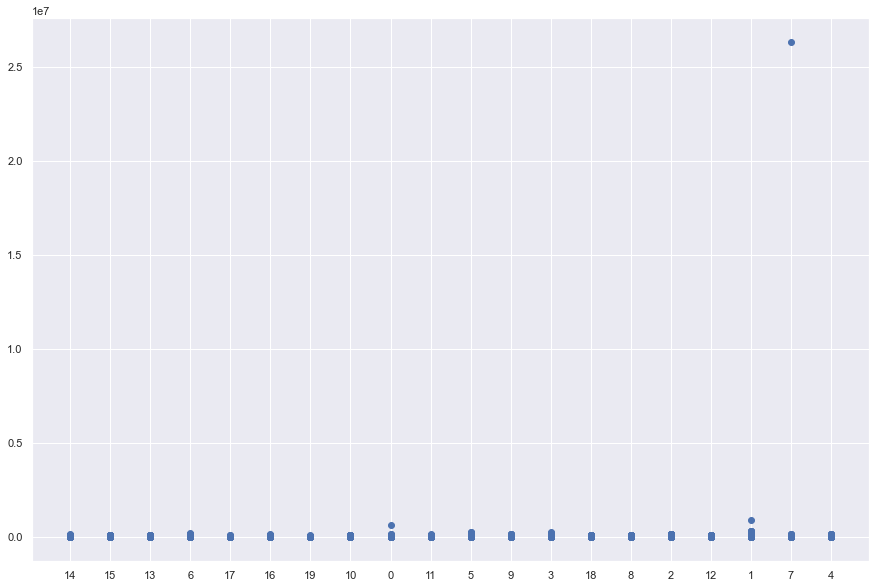

In [8]:
# plotting mileage against price

sns.set(rc={"figure.figsize":(15, 10)})

plt.scatter( train['Mileage_3'], train['Price'])

In [9]:
# encoding airbags

cut_labels_air = [0,1,2,3,4,5]
cut_bins_air = [0, 1, 3, 5, 10, 13, 20]
train['Airbags_2'] = pd.cut(train['Airbags'], bins=cut_bins_air, labels=cut_labels_air, precision=1)
train[['Airbags', 'Airbags_2']]

,Airbags,Airbags_2
0,12,4
1,8,3
2,2,1
3,0,NaN
4,4,2
...,...,...
19232,5,2
19233,8,3
19234,4,2
19235,4,2


In [10]:
# Airbag value counts

train['Airbags_2'].value_counts()

2    5927
4    5689
3    3917
1    1103
5     120
0      76
Name: Airbags_2, dtype: int64

In [11]:
train[['Airbags', 'Airbags_2']].head(30)

,Airbags,Airbags_2
0,12,4
1,8,3
2,2,1
3,0,NaN
4,4,2
5,4,2
6,12,4
7,12,4
8,12,4
9,12,4


In [12]:
# replacing null lables with zero

train['Airbags_2'] = train['Airbags_2'].fillna (0)
train[['Airbags', 'Airbags_2']].head()

,Airbags,Airbags_2
0,12,4
1,8,3
2,2,1
3,0,0
4,4,2


In [13]:
train['Airbags_2'].value_counts()

2    5927
4    5689
3    3917
0    2481
1    1103
5     120
Name: Airbags_2, dtype: int64

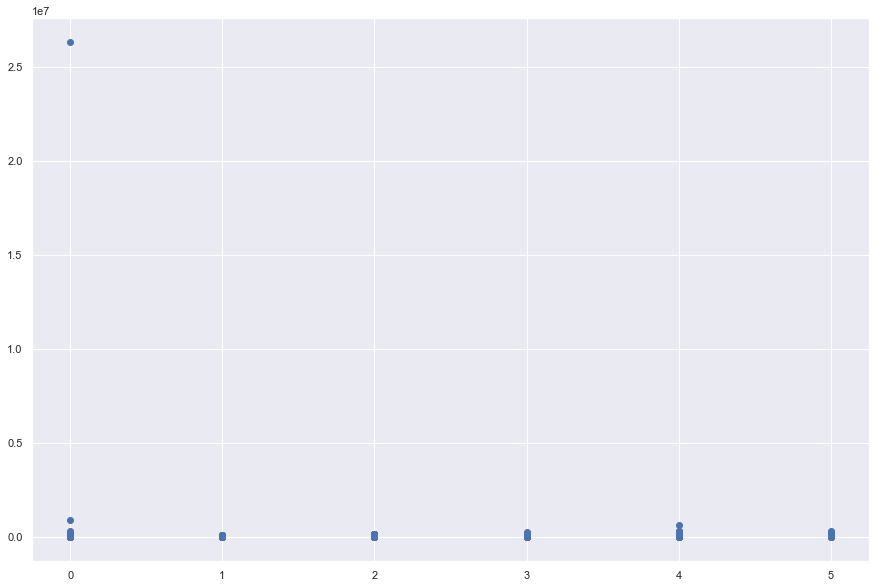

In [14]:
# plotting airbags against price

plt.scatter( train['Airbags_2'], train['Price'])

In [15]:
# encoding cylinders

cut_labels_cyl = [0,1,2,3,4,5,6]
cut_bins_cyl = [0, 1, 3, 6, 8, 10, 14, 20]
train['Cylinders_2'] = pd.cut(train['Cylinders'], bins=cut_bins_cyl, labels=cut_labels_cyl, precision=1)
train[['Cylinders', 'Cylinders_2']]

,Cylinders,Cylinders_2
0,6.0,2
1,6.0,2
2,4.0,2
3,4.0,2
4,4.0,2
...,...,...
19232,4.0,2
19233,4.0,2
19234,4.0,2
19235,4.0,2


In [16]:
# cylinder value counts

train['Cylinders_2'].value_counts()

2    17998
3      995
1      149
5       39
0       38
4       13
6        5
Name: Cylinders_2, dtype: int64

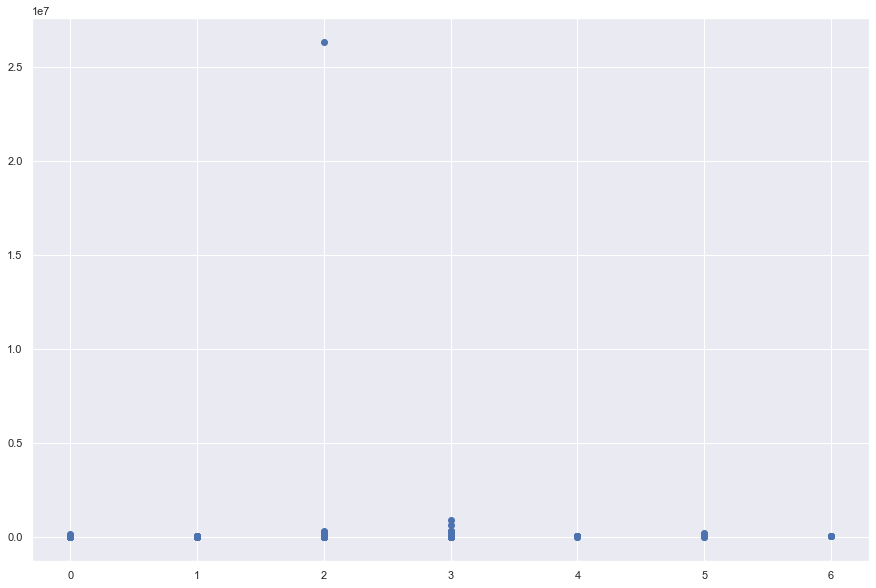

In [17]:
# plotting cylinders against price

plt.scatter( train['Cylinders_2'], train['Price'])

In [18]:
train['Cylinders_2'] = train['Cylinders_2'].fillna (0)
train['Cylinders_2'].value_counts()

2    17998
3      995
1      149
5       39
0       38
4       13
6        5
Name: Cylinders_2, dtype: int64

In [19]:
# encoding prod.year

cut_labels_pdy = [0,1,2,3,4,5,6,7]
cut_bins_pdy = [1930, 1970, 1980, 1990, 2000, 2005, 2010, 2015, 2021]
train['Prod. year_2'] = pd.cut(train['Prod. year'], bins=cut_bins_pdy, labels=cut_labels_pdy, precision=1)
train[['Prod. year', 'Prod. year_2']]

,Prod. year,Prod. year_2
0,2010,5
1,2011,6
2,2006,5
3,2011,6
4,2014,6
...,...,...
19232,1999,3
19233,2011,6
19234,2010,5
19235,2007,5


In [20]:
# prod. year value counts

train['Prod. year_2'].value_counts()

6    9403
5    3602
7    3288
4    1683
3    1174
2      62
0      15
1      10
Name: Prod. year_2, dtype: int64

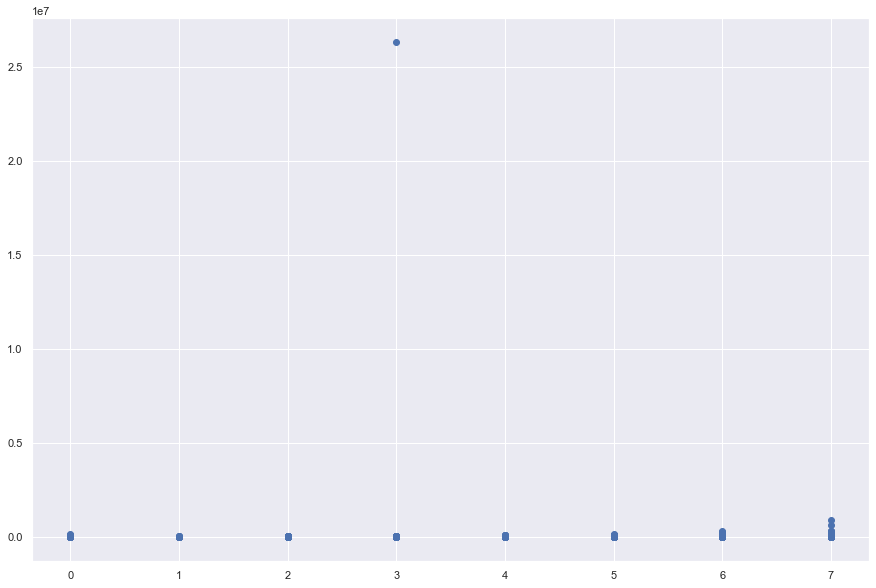

In [21]:
# plotting prod.year against price

plt.scatter( train['Prod. year_2'], train['Price'])

In [22]:
train['Engine volume']

0              3.5
1                3
2              1.3
3              2.5
4              1.3
           ...    
19232    2.0 Turbo
19233          2.4
19234            2
19235            2
19236          2.4
Name: Engine volume, Length: 19237, dtype: object

In [23]:
# splitting datafrae based on turbo in engine volume

train['Engine_volume'] = train['Engine volume']
train1 = train[train.Engine_volume.str.contains('Turbo',case=False)]
train1

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,...,Doors,Wheel,Color,Airbags,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume
23,45814106,7840,-,FORD,Transit,2001,Microbus,No,Diesel,2.0 Turbo,...,02-Mar,Left wheel,White,0,"(204800.0, 230000.0]",16,0,2,4,2.0 Turbo
25,45782859,20385,-,MERCEDES-BENZ,E 220,2006,Sedan,Yes,Diesel,2.2 Turbo,...,04-May,Left wheel,Black,8,"(204800.0, 230000.0]",16,3,2,5,2.2 Turbo
30,44944581,15681,1288,MERCEDES-BENZ,Vito,2007,Goods wagon,No,Diesel,2.0 Turbo,...,04-May,Left wheel,White,4,"(173943.8, 188888.0]",14,2,2,5,2.0 Turbo
34,45542380,24462,-,JEEP,Grand Cherokee,2007,Jeep,Yes,Diesel,3.0 Turbo,...,04-May,Left wheel,Black,10,"(230000.0, 265210.0]",17,3,2,5,3.0 Turbo
42,45667253,20165,650,VOLKSWAGEN,Jetta,2016,Sedan,Yes,Petrol,1.4 Turbo,...,04-May,Left wheel,Black,8,"(2313.2, 25061.4]",1,3,2,7,1.4 Turbo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19170,45776725,10976,-,MERCEDES-BENZ,C 220,2001,Sedan,No,Diesel,2.2 Turbo,...,04-May,Left wheel,Silver,4,"(265210.0, 320000.0]",18,2,2,4,2.2 Turbo
19190,45790255,24462,642,BMW,528,2012,Sedan,Yes,Petrol,2.0 Turbo,...,04-May,Left wheel,Black,12,"(95349.0, 105944.2]",7,4,2,6,2.0 Turbo
19200,45725908,36065,640,MERCEDES-BENZ,CLA 250 AMG,2013,Sedan,Yes,Petrol,2.0 Turbo,...,04-May,Left wheel,Red,12,"(56774.2, 70139.0]",4,4,2,6,2.0 Turbo
19225,45794580,8781,1107,OPEL,Combo,2007,Goods wagon,No,Diesel,1.7 Turbo,...,04-May,Left wheel,Beige,4,"(230000.0, 265210.0]",17,2,2,5,1.7 Turbo


In [24]:
train2 = train[~train.Engine_volume.str.contains('Turbo',case=False)]
train2

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,...,Doors,Wheel,Color,Airbags,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,...,04-May,Left wheel,Silver,12,"(173943.8, 188888.0]",14,4,2,5,3.5
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,...,04-May,Left wheel,Black,8,"(188888.0, 204800.0]",15,3,2,6,3
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,...,04-May,Right-hand drive,Black,2,"(188888.0, 204800.0]",15,1,2,5,1.3
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,...,04-May,Left wheel,White,0,"(159764.2, 173943.8]",13,0,2,6,2.5
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,...,04-May,Left wheel,Silver,4,"(82392.0, 95349.0]",6,2,2,6,1.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19231,45772306,5802,1055,MERCEDES-BENZ,E 350,2013,Sedan,Yes,Diesel,3.5,...,04-May,Left wheel,Grey,12,"(105944.2, 115372.8]",8,4,2,6,3.5
19233,45778856,15681,831,HYUNDAI,Sonata,2011,Sedan,Yes,Petrol,2.4,...,04-May,Left wheel,Red,8,"(159764.2, 173943.8]",13,3,2,6,2.4
19234,45804997,26108,836,HYUNDAI,Tucson,2010,Jeep,Yes,Diesel,2,...,04-May,Left wheel,Grey,4,"(115372.8, 126000.0]",9,2,2,5,2
19235,45793526,5331,1288,CHEVROLET,Captiva,2007,Jeep,Yes,Diesel,2,...,04-May,Left wheel,Black,4,"(42782.8, 56774.2]",3,2,2,5,2


In [25]:
cut_labels_ev = [1,2,3,4,5,6,7,8]
cut_bins_ev = [0,0.9,1.9,2.9,3.9,4.9,5.9,6.9,7.9]
train2['Engine_volume_2'] = pd.cut(train2['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)
train2[['Engine_volume', 'Engine_volume_2']]

<ipython-input-25-74dc147d1e17>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train2['Engine_volume_2'] = pd.cut(train2['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)


,Engine_volume,Engine_volume_2
0,3.5,4
1,3,4
2,1.3,2
3,2.5,3
4,1.3,2
...,...,...
19231,3.5,4
19233,2.4,3
19234,2,3
19235,2,3


In [26]:
train2['Engine_volume_2'].value_counts()

3    7748
2    5857
4    2647
5     733
6     198
1      72
7      38
8       1
Name: Engine_volume_2, dtype: int64

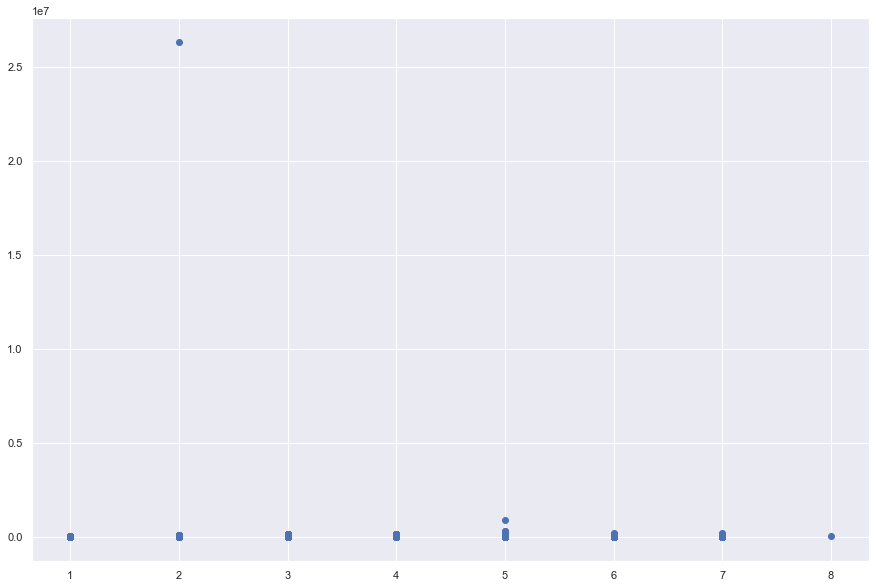

In [27]:
plt.scatter( train2['Engine_volume_2'], train2['Price'])

In [28]:
train1['Engine_volume'] = train1['Engine_volume'].str.replace(r' Turbo$', '')
train1

<ipython-input-28-826d8195bac7>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  train1['Engine_volume'] = train1['Engine_volume'].str.replace(r' Turbo$', '')
<ipython-input-28-826d8195bac7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train1['Engine_volume'] = train1['Engine_volume'].str.replace(r' Turbo$', '')


,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,...,Doors,Wheel,Color,Airbags,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume
23,45814106,7840,-,FORD,Transit,2001,Microbus,No,Diesel,2.0 Turbo,...,02-Mar,Left wheel,White,0,"(204800.0, 230000.0]",16,0,2,4,2.0
25,45782859,20385,-,MERCEDES-BENZ,E 220,2006,Sedan,Yes,Diesel,2.2 Turbo,...,04-May,Left wheel,Black,8,"(204800.0, 230000.0]",16,3,2,5,2.2
30,44944581,15681,1288,MERCEDES-BENZ,Vito,2007,Goods wagon,No,Diesel,2.0 Turbo,...,04-May,Left wheel,White,4,"(173943.8, 188888.0]",14,2,2,5,2.0
34,45542380,24462,-,JEEP,Grand Cherokee,2007,Jeep,Yes,Diesel,3.0 Turbo,...,04-May,Left wheel,Black,10,"(230000.0, 265210.0]",17,3,2,5,3.0
42,45667253,20165,650,VOLKSWAGEN,Jetta,2016,Sedan,Yes,Petrol,1.4 Turbo,...,04-May,Left wheel,Black,8,"(2313.2, 25061.4]",1,3,2,7,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19170,45776725,10976,-,MERCEDES-BENZ,C 220,2001,Sedan,No,Diesel,2.2 Turbo,...,04-May,Left wheel,Silver,4,"(265210.0, 320000.0]",18,2,2,4,2.2
19190,45790255,24462,642,BMW,528,2012,Sedan,Yes,Petrol,2.0 Turbo,...,04-May,Left wheel,Black,12,"(95349.0, 105944.2]",7,4,2,6,2.0
19200,45725908,36065,640,MERCEDES-BENZ,CLA 250 AMG,2013,Sedan,Yes,Petrol,2.0 Turbo,...,04-May,Left wheel,Red,12,"(56774.2, 70139.0]",4,4,2,6,2.0
19225,45794580,8781,1107,OPEL,Combo,2007,Goods wagon,No,Diesel,1.7 Turbo,...,04-May,Left wheel,Beige,4,"(230000.0, 265210.0]",17,2,2,5,1.7


In [29]:
cut_labels_ev = [10,20,30,40,50,60,70,80]
cut_bins_ev = [0,0.9,1.9,2.9,3.9,4.9,5.9,6.9,7.9]
train1['Engine_volume_2'] = pd.cut(train1['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)
train1[['Engine_volume', 'Engine_volume_2']]

<ipython-input-29-6aebb548b6ca>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train1['Engine_volume_2'] = pd.cut(train1['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)


,Engine_volume,Engine_volume_2
23,2.0,30
25,2.2,30
30,2.0,30
34,3.0,40
42,1.4,20
...,...,...
19170,2.2,30
19190,2.0,30
19200,2.0,30
19225,1.7,20


In [30]:
train1['Engine_volume_2'].value_counts()

30    863
20    622
40    351
50     62
60     17
10     13
70      3
80      0
Name: Engine_volume_2, dtype: int64

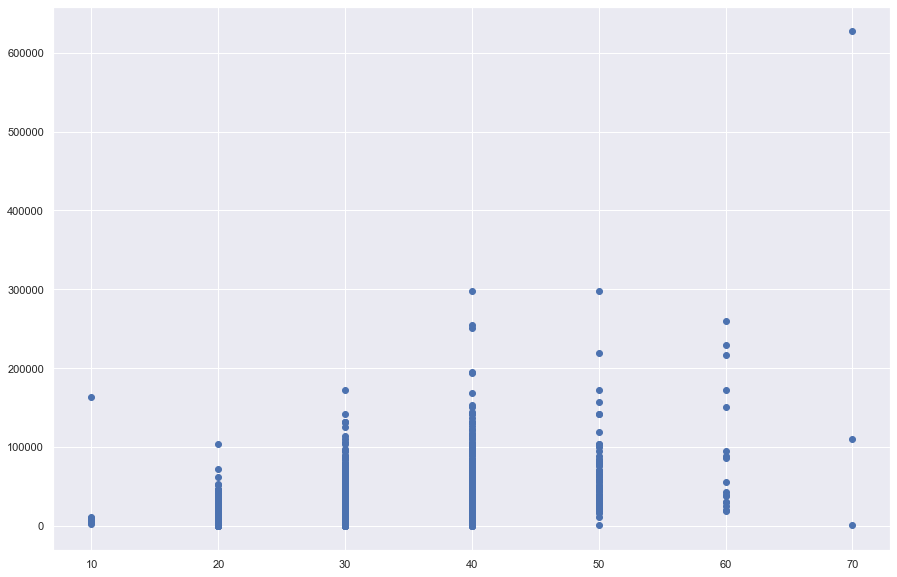

In [31]:
plt.scatter( train1['Engine_volume_2'], train1['Price'])

In [32]:
# concatenating the earlier split dataframes based on turbo in engine volume

train3 = pd.concat([train1, train2], axis=0)
train3

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,...,Wheel,Color,Airbags,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume,Engine_volume_2
23,45814106,7840,-,FORD,Transit,2001,Microbus,No,Diesel,2.0 Turbo,...,Left wheel,White,0,"(204800.0, 230000.0]",16,0,2,4,2.0,30
25,45782859,20385,-,MERCEDES-BENZ,E 220,2006,Sedan,Yes,Diesel,2.2 Turbo,...,Left wheel,Black,8,"(204800.0, 230000.0]",16,3,2,5,2.2,30
30,44944581,15681,1288,MERCEDES-BENZ,Vito,2007,Goods wagon,No,Diesel,2.0 Turbo,...,Left wheel,White,4,"(173943.8, 188888.0]",14,2,2,5,2.0,30
34,45542380,24462,-,JEEP,Grand Cherokee,2007,Jeep,Yes,Diesel,3.0 Turbo,...,Left wheel,Black,10,"(230000.0, 265210.0]",17,3,2,5,3.0,40
42,45667253,20165,650,VOLKSWAGEN,Jetta,2016,Sedan,Yes,Petrol,1.4 Turbo,...,Left wheel,Black,8,"(2313.2, 25061.4]",1,3,2,7,1.4,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19231,45772306,5802,1055,MERCEDES-BENZ,E 350,2013,Sedan,Yes,Diesel,3.5,...,Left wheel,Grey,12,"(105944.2, 115372.8]",8,4,2,6,3.5,4
19233,45778856,15681,831,HYUNDAI,Sonata,2011,Sedan,Yes,Petrol,2.4,...,Left wheel,Red,8,"(159764.2, 173943.8]",13,3,2,6,2.4,3
19234,45804997,26108,836,HYUNDAI,Tucson,2010,Jeep,Yes,Diesel,2,...,Left wheel,Grey,4,"(115372.8, 126000.0]",9,2,2,5,2,3
19235,45793526,5331,1288,CHEVROLET,Captiva,2007,Jeep,Yes,Diesel,2,...,Left wheel,Black,4,"(42782.8, 56774.2]",3,2,2,5,2,3


In [33]:
train3['Engine_volume_2'].value_counts()

3     7748
2     5857
4     2647
30     863
5      733
20     622
40     351
6      198
1       72
50      62
7       38
60      17
10      13
70       3
8        1
Name: Engine_volume_2, dtype: int64

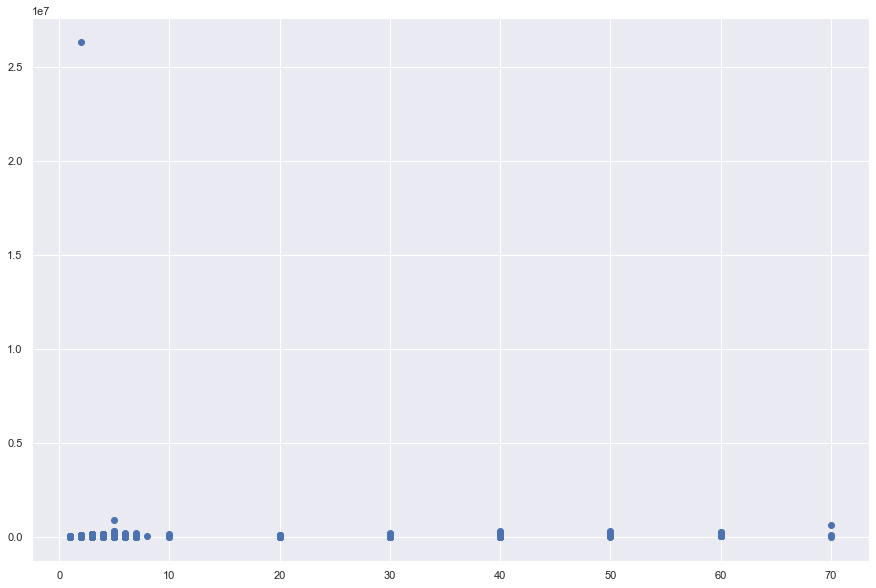

In [34]:
plt.scatter( train3['Engine_volume_2'], train3['Price'])

In [35]:
# ordinal encoding the following columns

train4a = train[['Category', 'Leather interior', 'Fuel type', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color']]

oe = OrdinalEncoder()
oe.fit(train4a)
train4b = oe.transform(train4a)
train4b

array([[ 4.,  1.,  2., ...,  1.,  0., 12.],
       [ 4.,  0.,  5., ...,  1.,  0.,  1.],
       [ 3.,  0.,  5., ...,  1.,  1.,  1.],
       ...,
       [ 4.,  1.,  1., ...,  1.,  0.,  7.],
       [ 4.,  1.,  1., ...,  1.,  0.,  1.],
       [ 9.,  1.,  2., ...,  1.,  0., 14.]])

In [36]:
columns = ['Category', 'Leather interior', 'Fuel type', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color']

train4 = pd.DataFrame(train4b, columns = columns)
train4

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color
0,4.0,1.0,2.0,0.0,0.0,1.0,0.0,12.0
1,4.0,0.0,5.0,2.0,0.0,1.0,0.0,1.0
2,3.0,0.0,5.0,3.0,1.0,1.0,1.0,1.0
3,4.0,1.0,2.0,0.0,0.0,1.0,0.0,14.0
4,3.0,1.0,5.0,0.0,1.0,1.0,0.0,12.0
...,...,...,...,...,...,...,...,...
19232,1.0,1.0,0.0,1.0,2.0,0.0,0.0,12.0
19233,9.0,1.0,5.0,2.0,1.0,1.0,0.0,11.0
19234,4.0,1.0,1.0,0.0,1.0,1.0,0.0,7.0
19235,4.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0


In [37]:
# Identifying the sparse manufacturers

threshold = 3 
value_counts = train['Manufacturer'].value_counts() 
to_rare = value_counts[value_counts <= threshold].index
to_rare

Index(['ROVER', 'FERRARI', 'სხვა', 'SAAB', 'ZAZ', 'ROLLS-ROYCE', 'BENTLEY',
       'SEAT', 'PONTIAC', 'HAVAL', 'SATURN', 'LANCIA', 'GREATWALL', 'TESLA',
       'LAMBORGHINI', 'ASTON MARTIN'],
      dtype='object')

In [38]:
# manufacturers value counts

train['Manufacturer'].replace(['ROVER', 'ZAZ', 'BENTLEY', 'SEAT', 'სხვა', 'SAAB', 'FERRARI','ROLLS-ROYCE', 'LAMBORGHINI', 'ASTON MARTIN', 'HAVAL', 'TESLA','GREATWALL', 'PONTIAC', 'SATURN', 'LANCIA'],'Rare', inplace=True)

train['Manufacturer'].value_counts()

HYUNDAI          3769
TOYOTA           3662
MERCEDES-BENZ    2076
FORD             1111
CHEVROLET        1069
BMW              1049
LEXUS             982
HONDA             977
NISSAN            660
VOLKSWAGEN        579
SSANGYONG         441
KIA               421
OPEL              397
MITSUBISHI        289
SUBARU            275
AUDI              255
MAZDA             183
JEEP              138
DODGE              91
DAEWOO             91
FIAT               78
SUZUKI             76
PORSCHE            54
LAND ROVER         49
VAZ                48
MINI               48
JAGUAR             42
RENAULT            37
INFINITI           30
CHRYSLER           26
Rare               25
SKODA              20
VOLVO              19
PEUGEOT            17
BUICK              16
GMC                15
LINCOLN            15
ACURA              15
CADILLAC           14
DAIHATSU           13
UAZ                12
GAZ                12
CITROEN             9
SCION               7
HUMMER              5
MOSKVICH  

In [39]:
train3['Manufacturer_2'] = train['Manufacturer']
train3['Manufacturer_2']

23                FORD
25       MERCEDES-BENZ
30       MERCEDES-BENZ
34                JEEP
42          VOLKSWAGEN
             ...      
19231    MERCEDES-BENZ
19233          HYUNDAI
19234          HYUNDAI
19235        CHEVROLET
19236          HYUNDAI
Name: Manufacturer_2, Length: 19237, dtype: object

In [40]:
# encoding manufacturer

oe_mfg = OrdinalEncoder()

mfg = train['Manufacturer'].values.reshape(-1, 1)
oe_mfg.fit(mfg)
train3['Manufacturer_3'] = oe_mfg.transform(mfg)
train3['Manufacturer_3']

23       25.0
25        6.0
30       16.0
34       13.0
42       16.0
         ... 
19231    29.0
19233    18.0
19234    18.0
19235     6.0
19236    18.0
Name: Manufacturer_3, Length: 19237, dtype: float64

In [41]:
# encoding model

oe_md = OrdinalEncoder()

md = train['Model'].values.reshape(-1, 1)
oe_md.fit(md)
train3['Model_2'] = oe_md.transform(md)
train3['Model_2']

23       1242.0
25        658.0
30        684.0
34        661.0
42        684.0
          ...  
19231     385.0
19233    1334.0
19234    1442.0
19235     456.0
19236    1334.0
Name: Model_2, Length: 19237, dtype: float64

In [42]:
train5 = train4
train5['Mileage'] = train['Mileage_3']
train5['Airbags'] = train['Airbags_2']
train5['Cylinders'] = train['Cylinders_2']
train5['Prod_year'] = train['Prod. year_2']
train5['Engine_volume'] = train3['Engine_volume_2']
train5['Manufacturer'] = train3['Manufacturer_3']
train5['Model'] = train3['Model_2']
train5['Price'] = train['Price']
train5.head()

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color,Mileage,Airbags,Cylinders,Prod_year,Engine_volume,Manufacturer,Model,Price
0,4.0,1.0,2.0,0.0,0.0,1.0,0.0,12.0,14,4,2,5,4,13.0,742.0,13328
1,4.0,0.0,5.0,2.0,0.0,1.0,0.0,1.0,15,3,2,6,4,18.0,1334.0,16621
2,3.0,0.0,5.0,3.0,1.0,1.0,1.0,1.0,15,1,2,5,2,35.0,278.0,8467
3,4.0,1.0,2.0,0.0,0.0,1.0,0.0,14.0,13,0,2,6,3,2.0,219.0,3607
4,3.0,1.0,5.0,0.0,1.0,1.0,0.0,12.0,6,2,2,6,2,13.0,715.0,11726


In [43]:
train5.dtypes

Category             float64
Leather interior     float64
Fuel type            float64
Gear box type        float64
Drive wheels         float64
Doors                float64
Wheel                float64
Color                float64
Mileage             category
Airbags             category
Cylinders           category
Prod_year           category
Engine_volume         object
Manufacturer         float64
Model                float64
Price                  int64
dtype: object

In [44]:
train5['Mileage'] = train5['Mileage'].astype(float)
train5['Airbags'] = train5['Airbags'].astype(float)
train5['Cylinders'] = train5['Cylinders'].astype(float)
train5['Prod_year'] = train5['Prod_year'].astype(float)
train5['Engine_volume'] = train5['Engine_volume'].astype(float)


In [45]:
train5.dtypes

Category            float64
Leather interior    float64
Fuel type           float64
Gear box type       float64
Drive wheels        float64
Doors               float64
Wheel               float64
Color               float64
Mileage             float64
Airbags             float64
Cylinders           float64
Prod_year           float64
Engine_volume       float64
Manufacturer        float64
Model               float64
Price                 int64
dtype: object

In [46]:
# removing infinite and null vales

print(np.any(np.isfinite(train5)))
print(np.any(np.isnan(train5)))

True
True


In [47]:
train5.replace([np.inf, -np.inf], np.nan, inplace=True)

In [48]:
train5.dropna(inplace=True)
train5

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color,Mileage,Airbags,Cylinders,Prod_year,Engine_volume,Manufacturer,Model,Price
0,4.0,1.0,2.0,0.0,0.0,1.0,0.0,12.0,14.0,4.0,2.0,5.0,4.0,13.0,742.0,13328
1,4.0,0.0,5.0,2.0,0.0,1.0,0.0,1.0,15.0,3.0,2.0,6.0,4.0,18.0,1334.0,16621
2,3.0,0.0,5.0,3.0,1.0,1.0,1.0,1.0,15.0,1.0,2.0,5.0,2.0,35.0,278.0,8467
3,4.0,1.0,2.0,0.0,0.0,1.0,0.0,14.0,13.0,0.0,2.0,6.0,3.0,2.0,219.0,3607
4,3.0,1.0,5.0,0.0,1.0,1.0,0.0,12.0,6.0,2.0,2.0,6.0,2.0,13.0,715.0,11726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,1.0,1.0,0.0,1.0,2.0,0.0,0.0,12.0,18.0,2.0,2.0,3.0,30.0,6.0,541.0,8467
19233,9.0,1.0,5.0,2.0,1.0,1.0,0.0,11.0,13.0,3.0,2.0,6.0,3.0,18.0,1334.0,15681
19234,4.0,1.0,1.0,0.0,1.0,1.0,0.0,7.0,9.0,2.0,2.0,5.0,3.0,18.0,1442.0,26108
19235,4.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,2.0,2.0,5.0,3.0,6.0,456.0,5331


In [49]:
#outlier handling

from numpy import mean
from numpy import std

data_mean, data_std = mean(train['Price']), std(train['Price'])

# identify outliers
cut_off = data_std * 2
lower, upper = data_mean - cut_off, data_mean + cut_off

# identify outliers
l_outliers = [x for x in train5['Price'] if x < lower]
u_outliers = [x for x in train5['Price'] if x > upper]

out_rem_std =  [x for x in train['Price'] if x > lower and x < upper]
#print('Identified outliers: %d' % len(outliers))
print(l_outliers)
print(u_outliers)

[]
[627220, 872946, 26307500]


In [50]:
indexNames = train5[ train5['Price'] > 627219 ].index
train5.drop(indexNames , inplace=True)
train5

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color,Mileage,Airbags,Cylinders,Prod_year,Engine_volume,Manufacturer,Model,Price
0,4.0,1.0,2.0,0.0,0.0,1.0,0.0,12.0,14.0,4.0,2.0,5.0,4.0,13.0,742.0,13328
1,4.0,0.0,5.0,2.0,0.0,1.0,0.0,1.0,15.0,3.0,2.0,6.0,4.0,18.0,1334.0,16621
2,3.0,0.0,5.0,3.0,1.0,1.0,1.0,1.0,15.0,1.0,2.0,5.0,2.0,35.0,278.0,8467
3,4.0,1.0,2.0,0.0,0.0,1.0,0.0,14.0,13.0,0.0,2.0,6.0,3.0,2.0,219.0,3607
4,3.0,1.0,5.0,0.0,1.0,1.0,0.0,12.0,6.0,2.0,2.0,6.0,2.0,13.0,715.0,11726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,1.0,1.0,0.0,1.0,2.0,0.0,0.0,12.0,18.0,2.0,2.0,3.0,30.0,6.0,541.0,8467
19233,9.0,1.0,5.0,2.0,1.0,1.0,0.0,11.0,13.0,3.0,2.0,6.0,3.0,18.0,1334.0,15681
19234,4.0,1.0,1.0,0.0,1.0,1.0,0.0,7.0,9.0,2.0,2.0,5.0,3.0,18.0,1442.0,26108
19235,4.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,2.0,2.0,5.0,3.0,6.0,456.0,5331


In [51]:
print(np.any(np.isfinite(train5)))
print(np.any(np.isnan(train5)))

True
False


In [ ]:
# variables against price plots after outlier treatment 

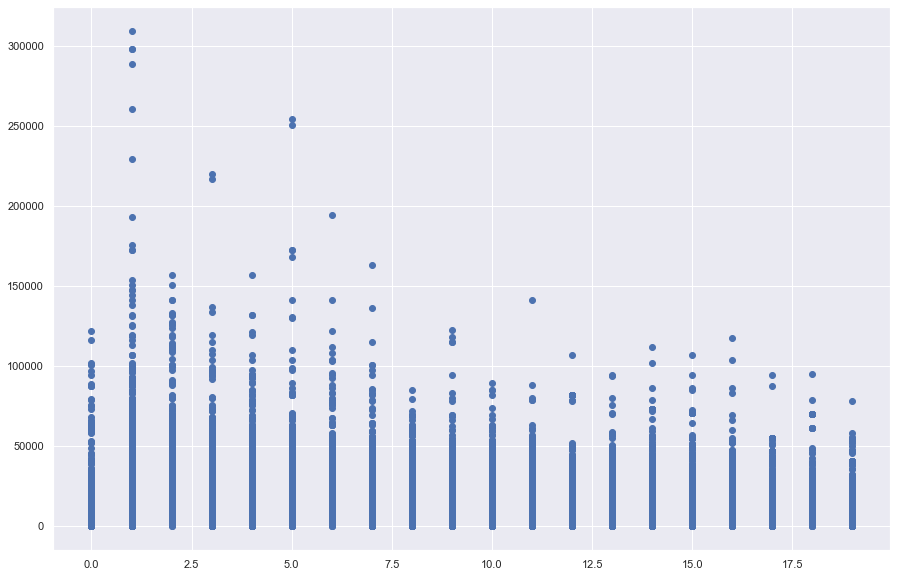

In [52]:
# mileage - price

plt.scatter( train5['Mileage'], train5['Price'])

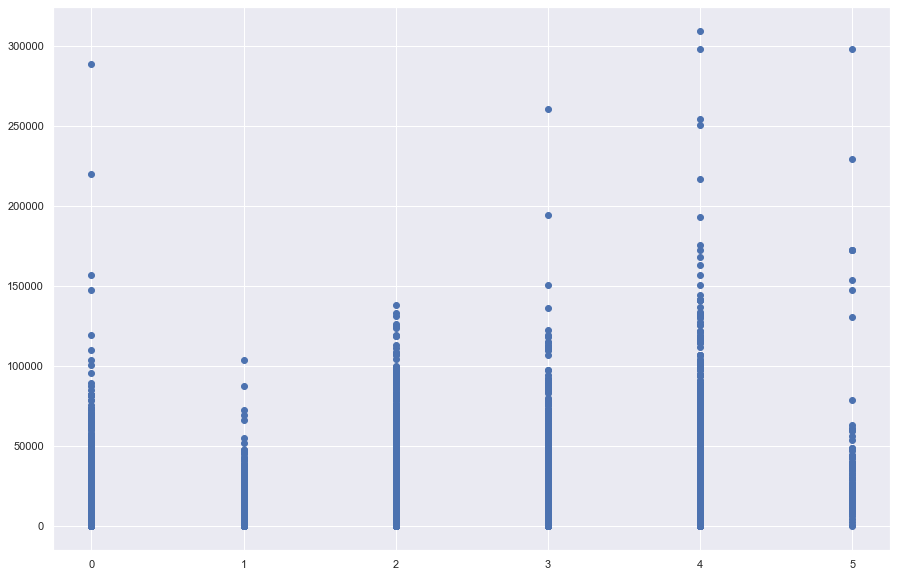

In [53]:
# airbags - price

plt.scatter( train5['Airbags'], train5['Price'])

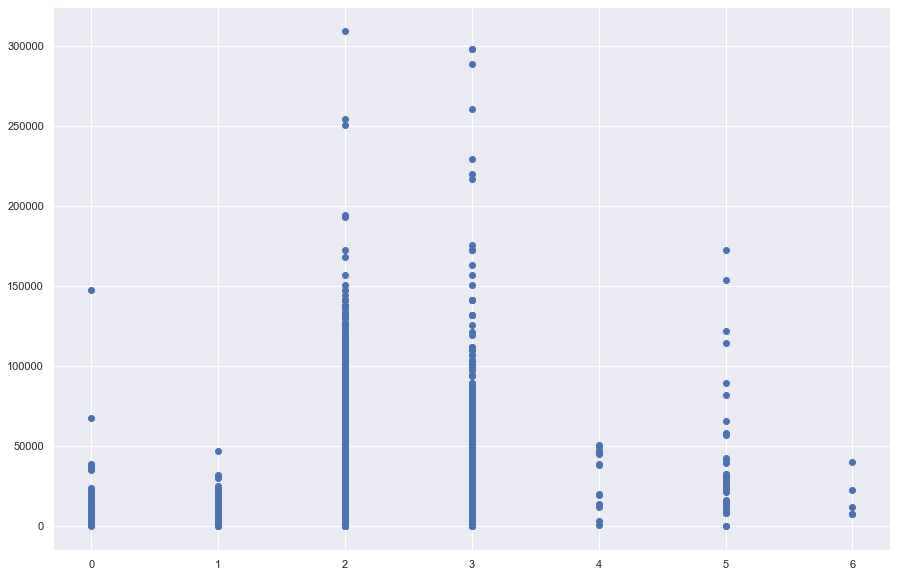

In [54]:
# cylinders - price

plt.scatter( train5['Cylinders'], train5['Price'])

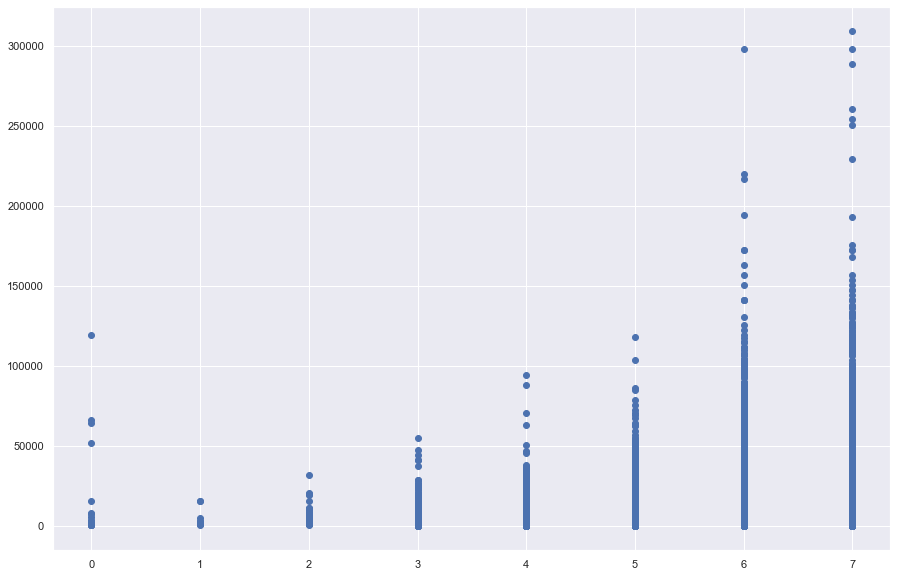

In [55]:
# prod year - price

plt.scatter( train5['Prod_year'], train5['Price'])

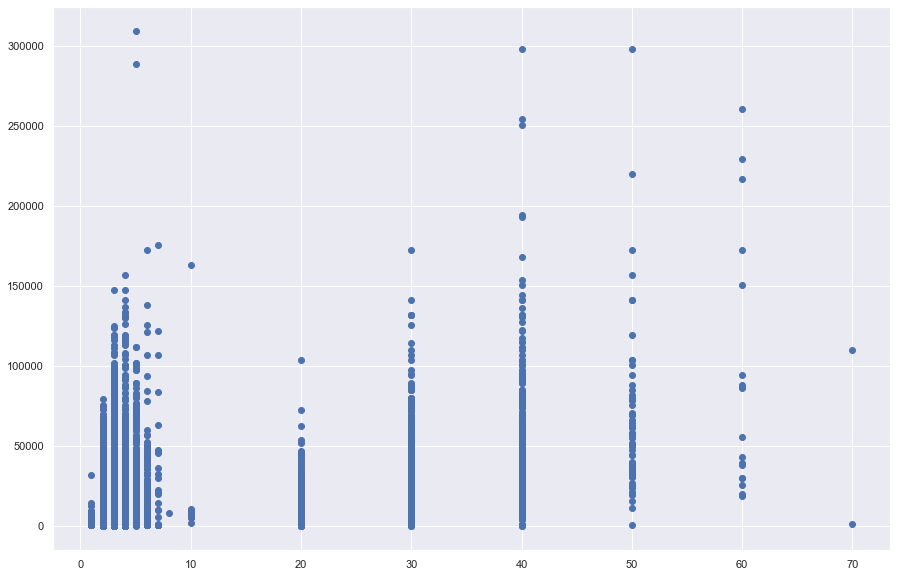

In [56]:
# engine volume - price

plt.scatter( train5['Engine_volume'], train5['Price'])

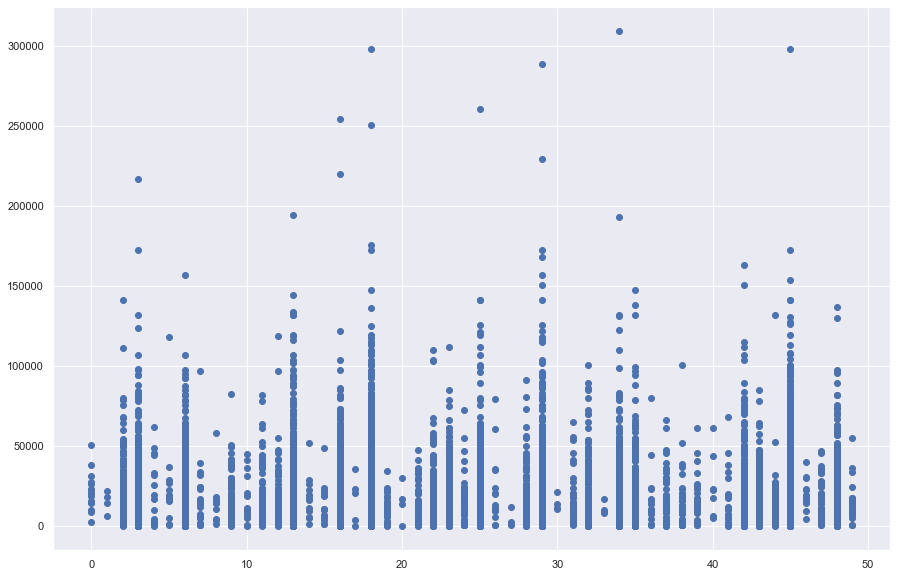

In [57]:
# manufacturer - price

plt.scatter( train5['Manufacturer'], train5['Price'])

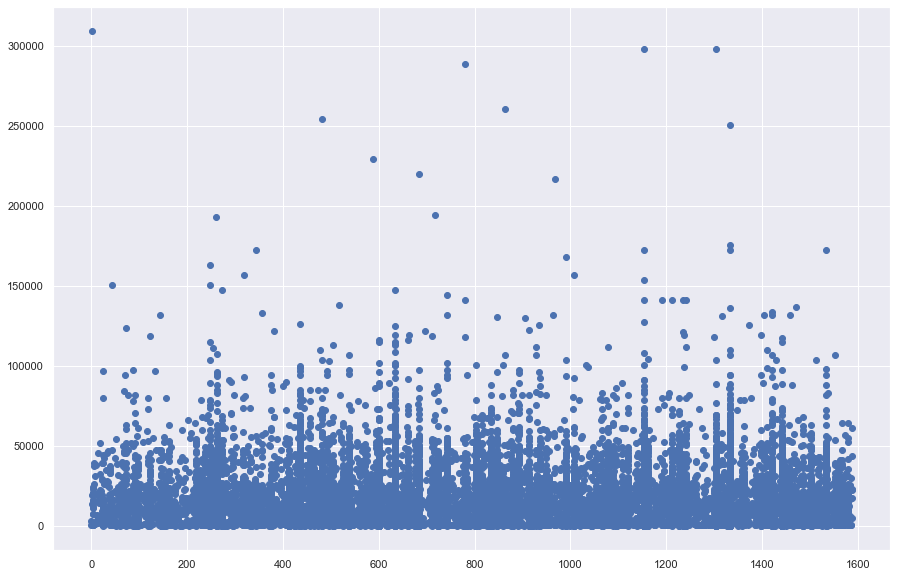

In [58]:
# model - price

plt.scatter( train5['Model'], train5['Price'])

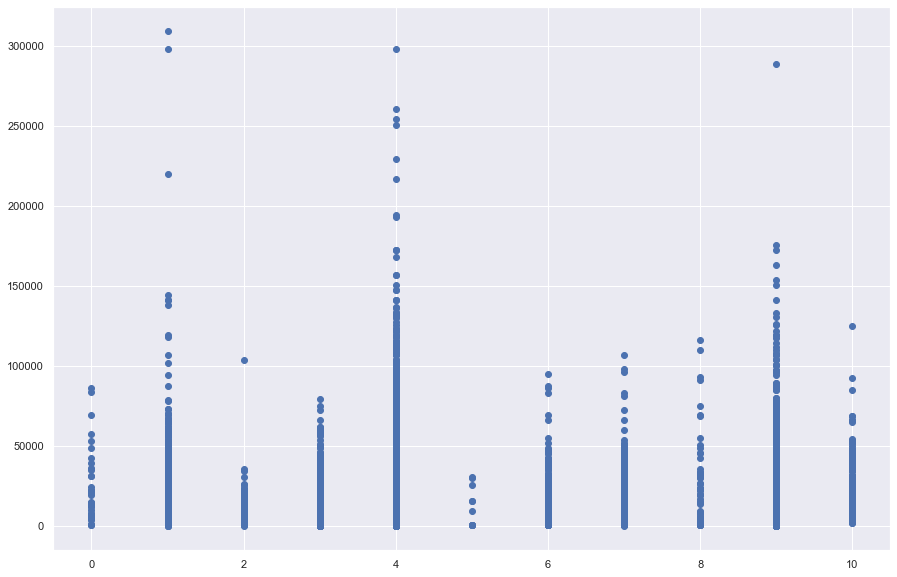

In [59]:
# category - price

plt.scatter( train5['Category'], train5['Price'])

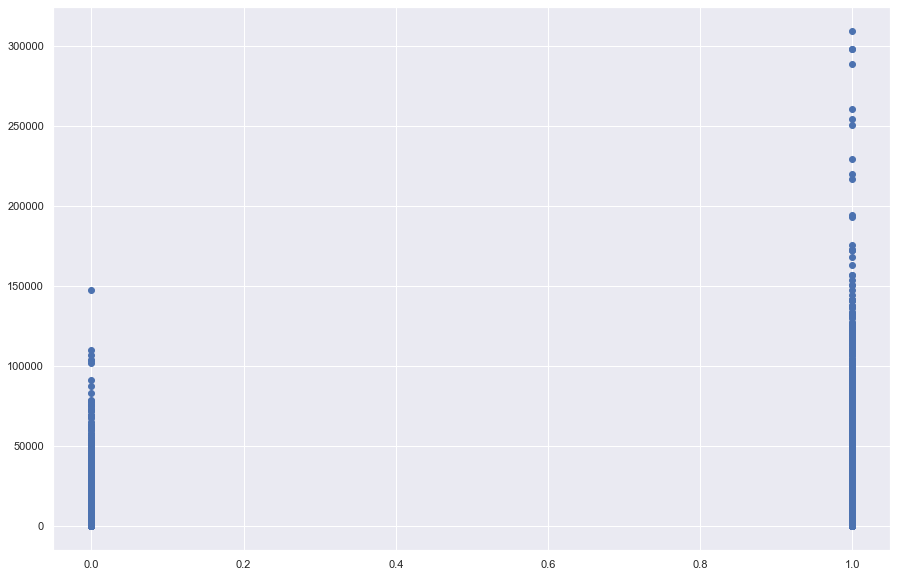

In [60]:
# leather interior - price

plt.scatter( train5['Leather interior'], train5['Price'])

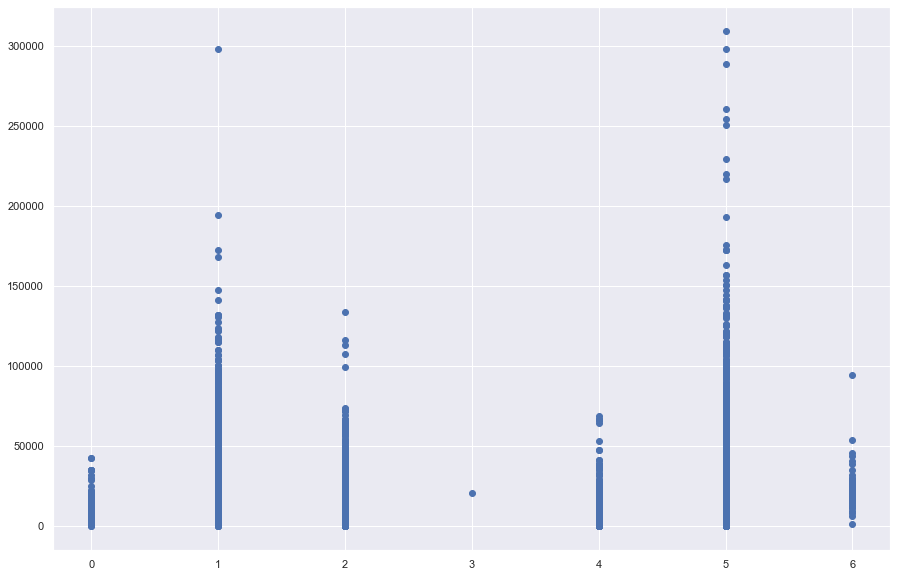

In [61]:
# fuel type - price

plt.scatter( train5['Fuel type'], train5['Price'])

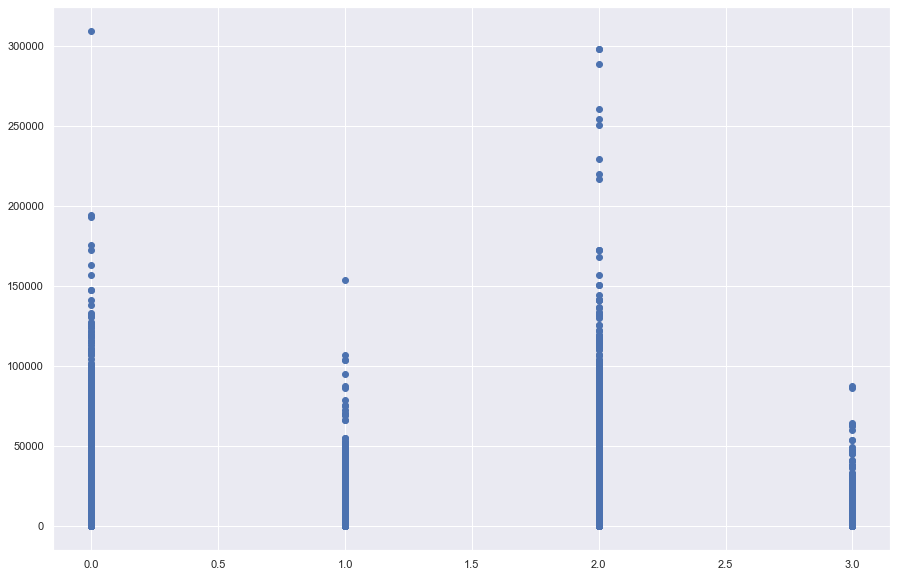

In [62]:
# gearbox type - price

plt.scatter( train5['Gear box type'], train5['Price'])

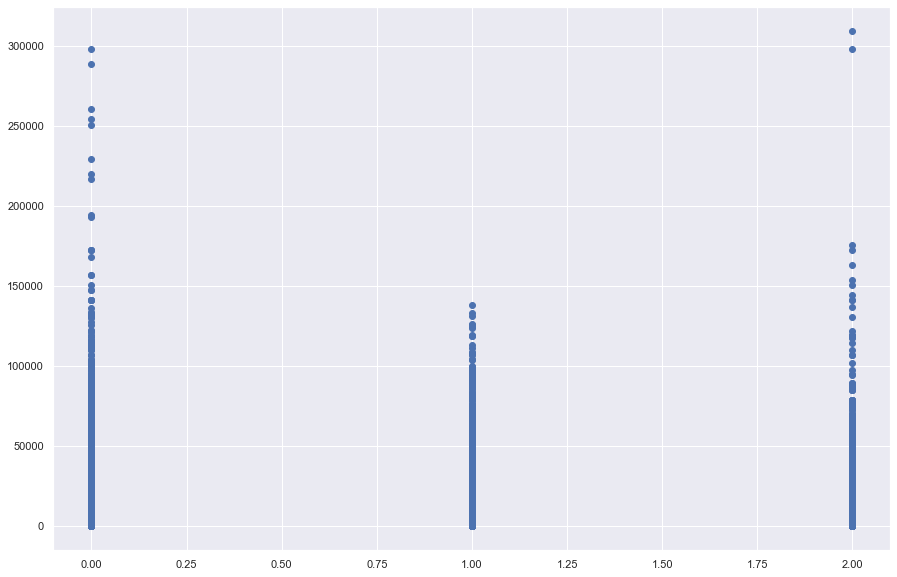

In [63]:
# drive wheels - price

plt.scatter( train5['Drive wheels'], train5['Price'])

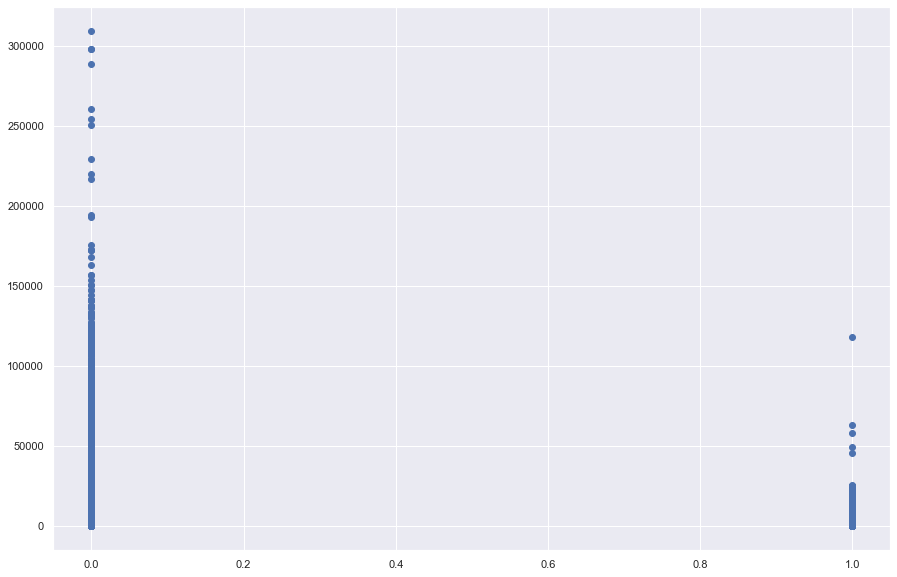

In [64]:
# wheel - price

plt.scatter( train5['Wheel'], train5['Price'])

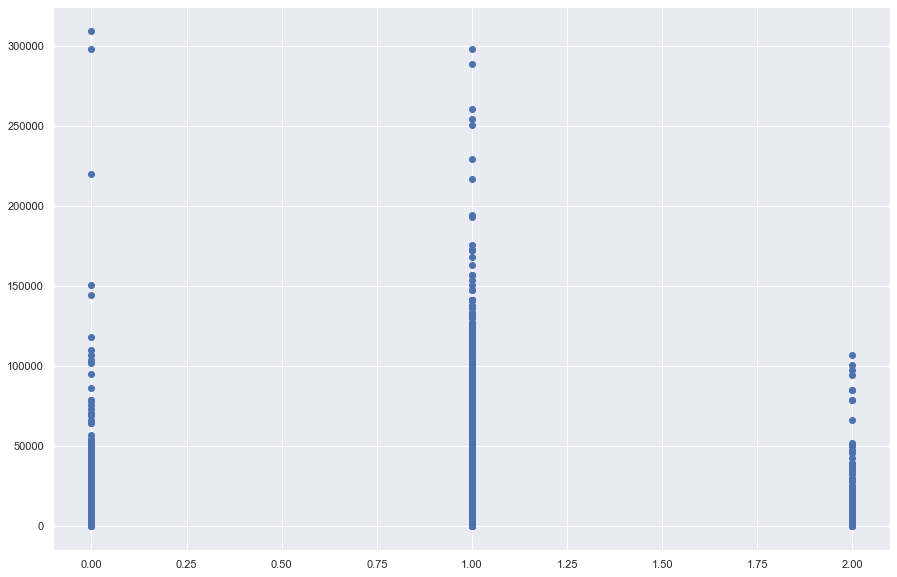

In [65]:
# doors - price

plt.scatter( train5['Doors'], train5['Price'])

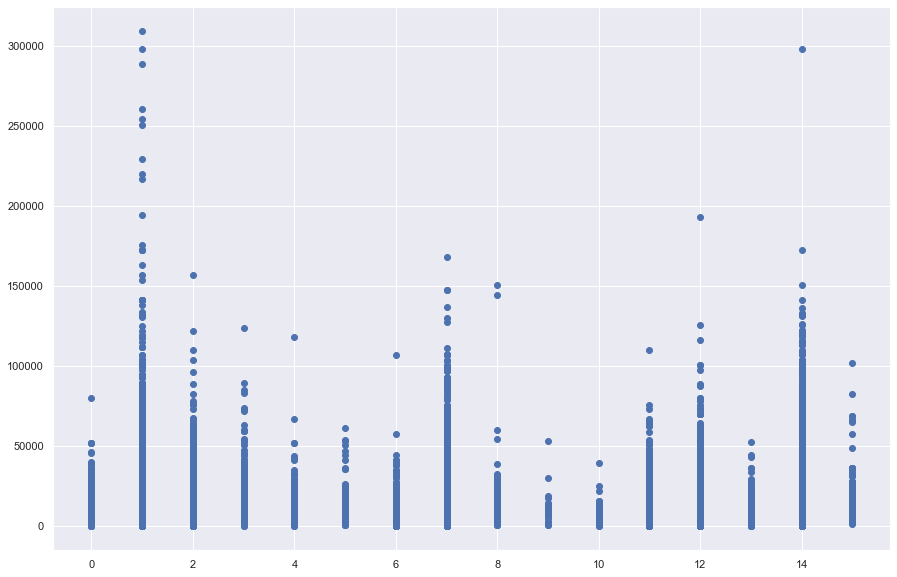

In [66]:
# colour - price

plt.scatter( train5['Color'], train5['Price'])

# Modelling

In [67]:
X = train5.iloc[:, : -1]
y = train5.iloc[:, -1]

In [68]:
# train test split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [44]:
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit
from datetime import datetime
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn import linear_model
from sklearn import linear_model
from sklearn import ensemble
from keras.models import Sequential 
from keras.layers import Dense, Activation 
from keras.layers import Dropout
import keras
from tensorflow.keras import optimizers
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from keras.callbacks import ModelCheckpoint
import tensorflow as tf
from keras.initializers import he_normal
from keras.layers.normalization import BatchNormalization
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [113]:
# XGBOOST

#start = datetime.now()


# initialize Our first XGBoost model...
regr = xgb.XGBRegressor(silent=False, random_state=15)
#regr = MultiOutputRegressor(regr1)
# declare parameters for hyperparameter tuning
parameters = {'learning_rate':[0.001,0.01,0.1],'n_estimators':[100,300,500,700],'max_depth':[1,2,3]} 

# Perform cross validation 
clf = GridSearchCV(regr,
                    param_grid = parameters,
                    scoring="neg_mean_squared_error",
                    cv = 5,
                    n_jobs = -1,
                    verbose = 1)
result = clf.fit(X_train, y_train)

# Summarize results
print("Best: %f using %s" % (result.best_score_, result.best_params_))
means = result.cv_results_['mean_test_score']
stds = result.cv_results_['std_test_score']
params = result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f 1(%f) with: %r" % (mean, stdev, param))   

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[12:13:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Best: -134686677.491226 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 700}
-569948953.552843 1(23020309.351823) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 100}
-480723907.609765 1(21749002.084664) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 300}
-419374892.074900 1(20731716.093430) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 500}
-376980438.005140 1(19902493.638728) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators'

In [61]:

xgb1 = xgb.XGBRegressor(max_depth=1,learning_rate = 0.1,n_estimators=300,nthread=-1)
xgb1

XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=0.1, max_delta_step=None, max_depth=1,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=300, n_jobs=None, nthread=-1, num_parallel_tree=None,
             random_state=None, reg_alpha=None, reg_lambda=None,
             scale_pos_weight=None, subsample=None, tree_method=None,
             validate_parameters=None, verbosity=None)

In [114]:
xgb2 = xgb.XGBRegressor(max_depth=3,learning_rate = 0.1,n_estimators=700,nthread=-1)
xgb2

XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=0.1, max_delta_step=None, max_depth=3,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=700, n_jobs=None, nthread=-1, num_parallel_tree=None,
             random_state=None, reg_alpha=None, reg_lambda=None,
             scale_pos_weight=None, subsample=None, tree_method=None,
             validate_parameters=None, verbosity=None)

In [62]:
y_pred_testf2=clf.predict(X_test)

In [115]:
y_pred_testf3=clf.predict(X_test)

<ipython-input-67-c9406cd47a6f>:12: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


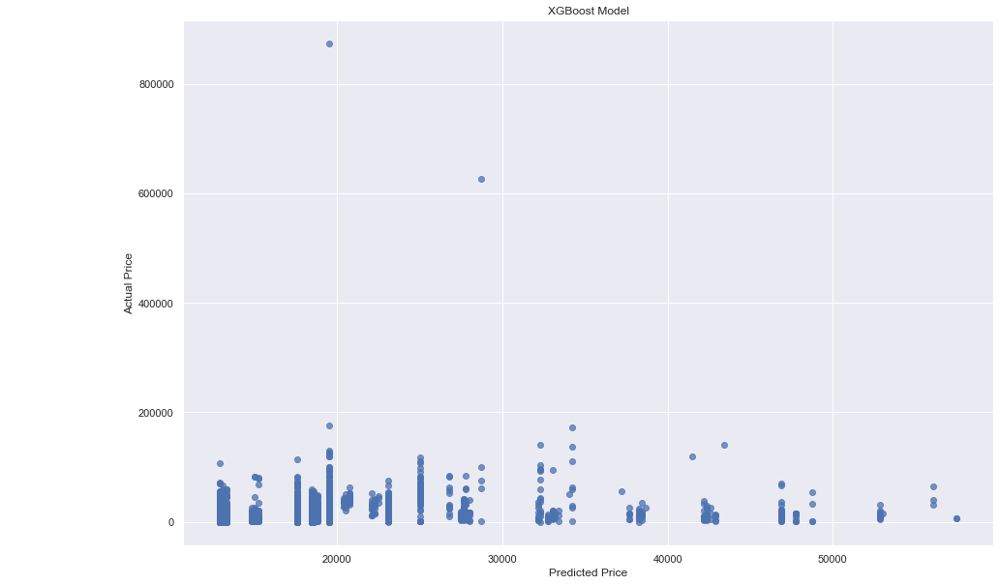

24097.959439076298


In [67]:



actual_values = y_test
plt.scatter(y_pred_testf2, actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('XGBoost Model')
overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(y_test, y_pred_testf2)))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()
print(sqrt(mean_squared_error(y_test, y_pred_testf2)))

<ipython-input-116-f904b66c1b6a>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


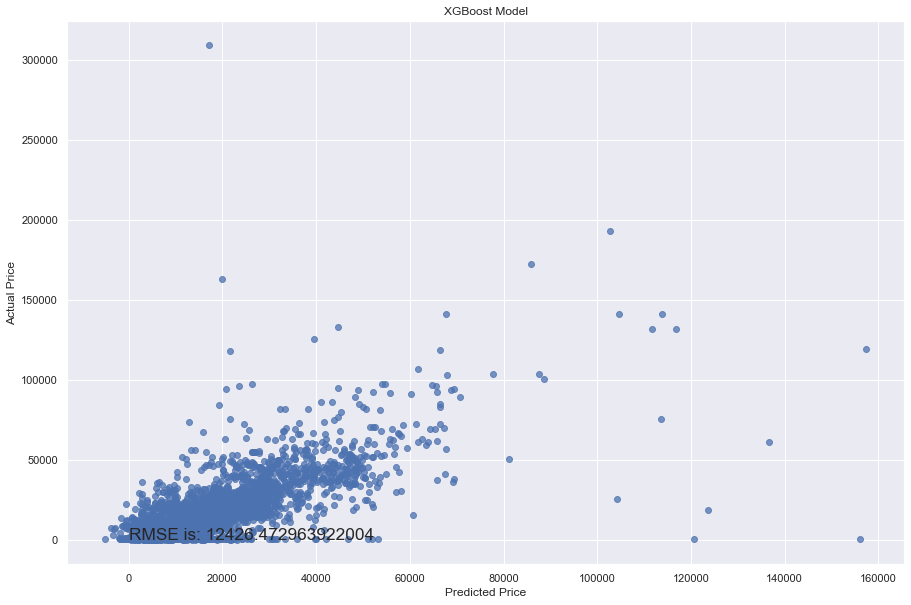

12426.472963922004


In [116]:
actual_values = y_test
plt.scatter(y_pred_testf3, actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('XGBoost Model')
overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(y_test, y_pred_testf3)))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()
print(sqrt(mean_squared_error(y_test, y_pred_testf3)))

<ipython-input-119-137f91b69731>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


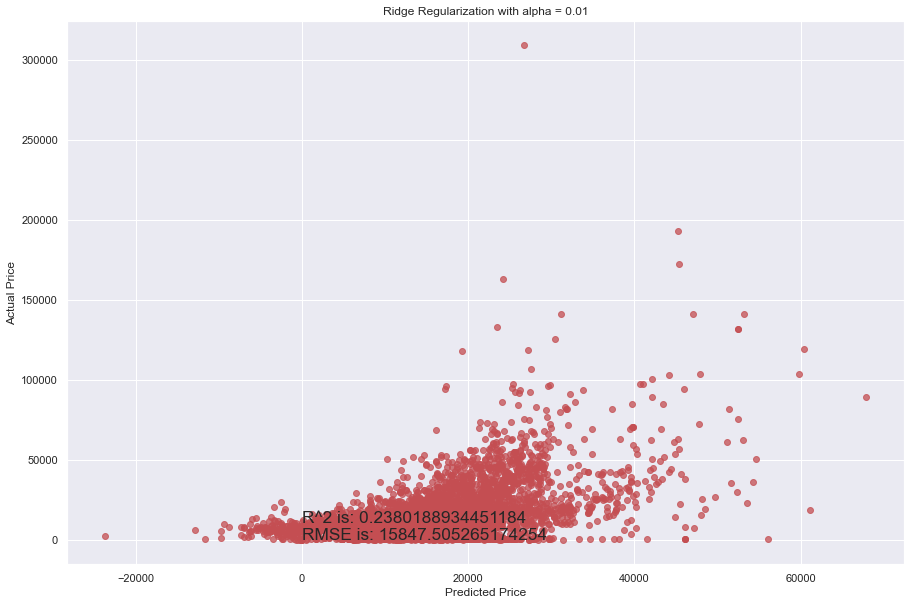

<ipython-input-119-137f91b69731>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


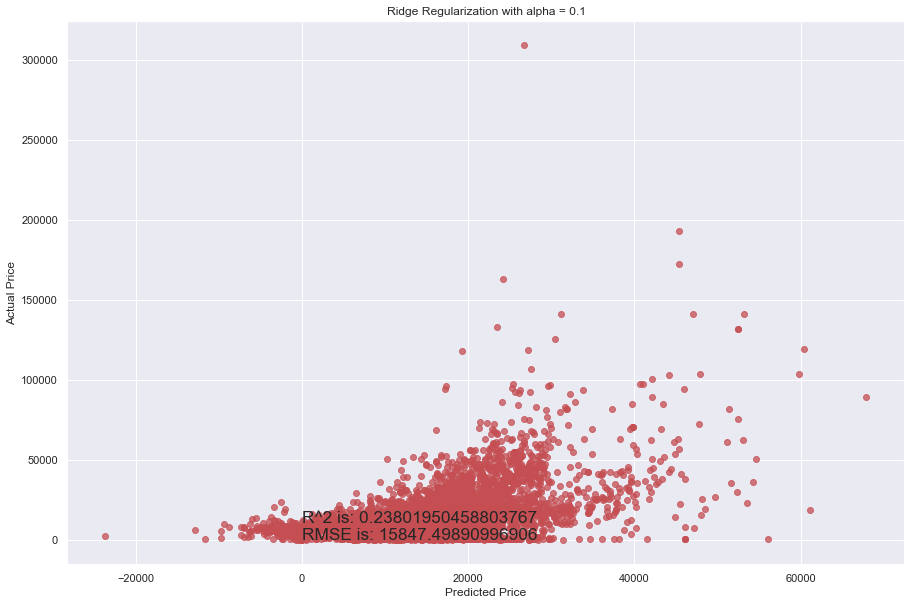

<ipython-input-119-137f91b69731>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


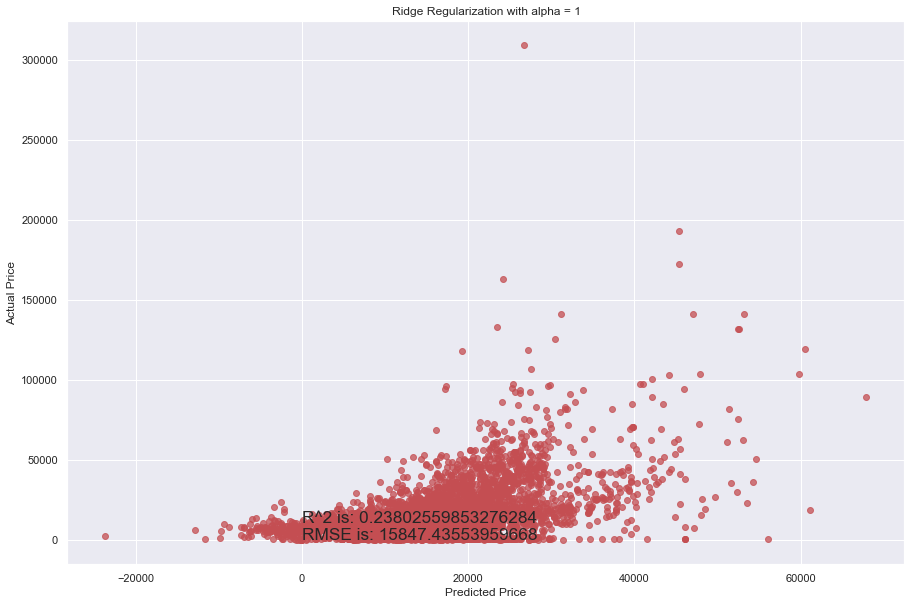

<ipython-input-119-137f91b69731>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


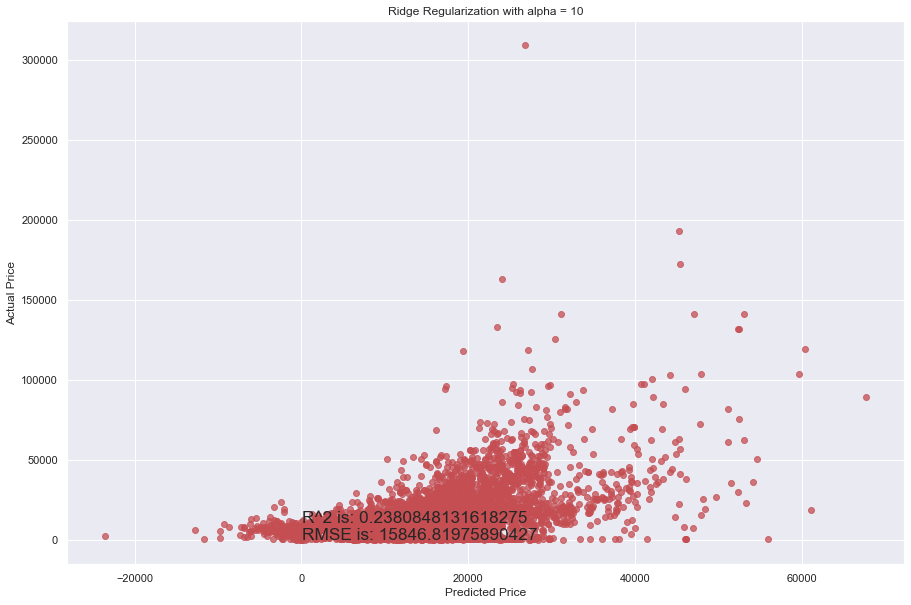

<ipython-input-119-137f91b69731>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


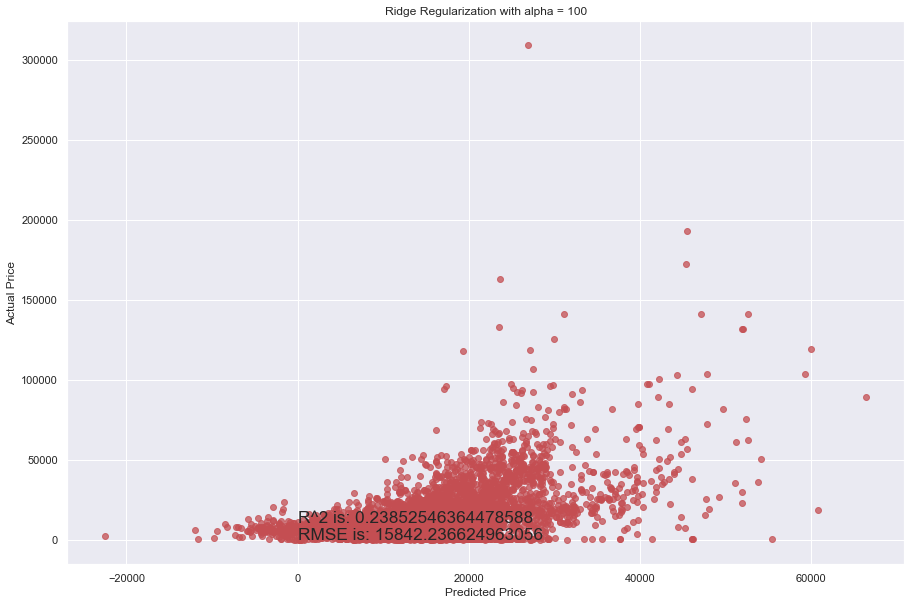

In [119]:
# Lasso

for i in range (-2, 3):
    alpha = 10**i
    rm = linear_model.Ridge(alpha=alpha)
    ridge_model = rm.fit(X_train, y_train)
    preds_ridge = ridge_model.predict(X_test)
    actual_values = y_test
    plt.scatter(preds_ridge, actual_values, alpha=.75, color='r')
    plt.xlabel('Predicted Price')
    plt.ylabel('Actual Price')
    plt.title('Ridge Regularization with alpha = {}'.format(alpha))
    overlay = 'R^2 is: {}\nRMSE is: {}'.format(
                    ridge_model.score(X_test, y_test),
                    sqrt(mean_squared_error(y_test, preds_ridge)))
    plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
    plt.show()

In [121]:
# Linear Regression

lr = linear_model.LinearRegression()
model = lr.fit(X_train, y_train)
predictions = model.predict(X_test)

<ipython-input-122-de100f335d34>:10: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


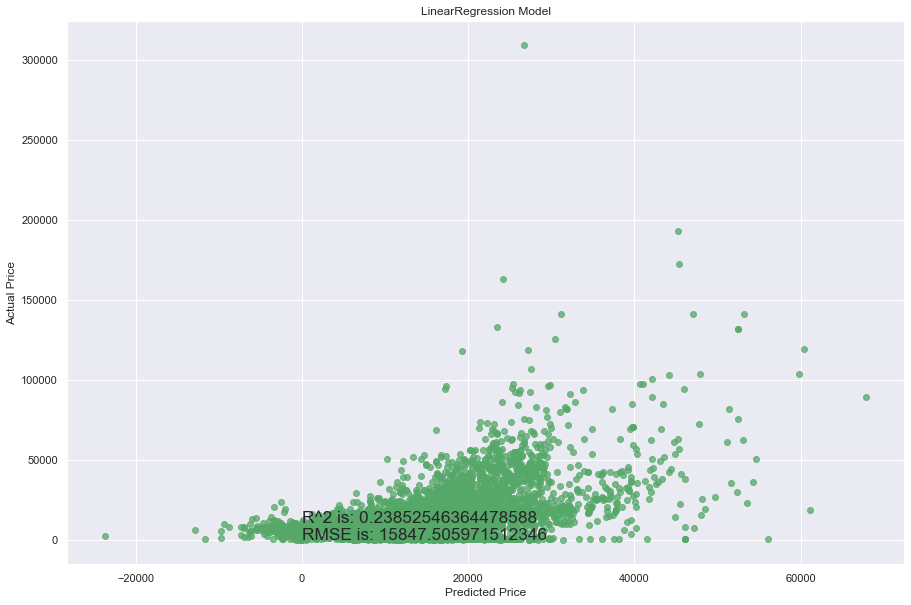

In [122]:
actual_values = y_test
plt.scatter(predictions, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('LinearRegression Model')
overlay = 'R^2 is: {}\nRMSE is: {}'.format(
                    ridge_model.score(X_test, y_test),
                    sqrt(mean_squared_error(y_test, predictions)))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

In [186]:
X_train_nn = np.asarray(X_train).astype('float32')
X_train_nn

array([[4.000e+00, 1.000e+00, 1.000e+00, ..., 2.000e+00, 1.800e+01,
        1.305e+03],
       [9.000e+00, 0.000e+00, 1.000e+00, ..., 3.000e+00, 4.800e+01,
        3.700e+02],
       [4.000e+00, 1.000e+00, 5.000e+00, ..., 5.000e+00, 3.000e+00,
        1.520e+02],
       ...,
       [9.000e+00, 1.000e+00, 2.000e+00, ..., 4.000e+00, 4.200e+01,
        9.290e+02],
       [4.000e+00, 1.000e+00, 1.000e+00, ..., 3.000e+00, 4.200e+01,
        9.290e+02],
       [9.000e+00, 1.000e+00, 2.000e+00, ..., 3.000e+00, 2.900e+01,
        3.430e+02]], dtype=float32)

In [187]:
X_train_nn.shape

(13320, 15)

In [188]:
y_train.shape

(13320,)

In [123]:
# artificial nural neywork

#Inıtialising the ANN
model = Sequential()
#Adding the input layer and first hidden layer
model.add(Dense(units =480, activation= 'tanh', 
                input_dim=X_train.shape[1]))
#Add the second hidden layer
model.add(Dense(units =480, activation= 'tanh'))
#Add the second hidden layer

model.add(Dense(units =240, activation= 'relu'))
#The output layer
model.add(Dense(units =1, activation= 'elu'))

In [99]:
# rmsprop model

model.compile(optimizer= 'rmsprop', loss= keras.losses.mean_squared_error, metrics=['accuracy'])
model.fit(X_train_nn,y_train, validation_split=0.07, batch_size = 32, epochs=3000)

Epoch 1/3000
481/481 [==============================] - 2s 3ms/step - loss: 560028130.3900 - accuracy: 2.8568e-05
Epoch 2/3000
481/481 [==============================] - 1s 3ms/step - loss: 333078496.0664 - accuracy: 5.2453e-05
Epoch 3/3000
481/481 [==============================] - 2s 3ms/step - loss: 349036181.4772 - accuracy: 2.2245e-04
Epoch 4/3000
481/481 [==============================] - 1s 3ms/step - loss: 372365158.1743 - accuracy: 1.1895e-04
Epoch 5/3000
481/481 [==============================] - 1s 3ms/step - loss: 324196039.6017 - accuracy: 1.1875e-04
Epoch 6/3000
481/481 [==============================] - 1s 3ms/step - loss: 296753246.2407 - accuracy: 9.0080e-05
Epoch 7/3000
481/481 [==============================] - 1s 3ms/step - loss: 318877393.1286 - accuracy: 5.7738e-06
Epoch 8/3000
481/481 [==============================] - 1s 3ms/step - loss: 303895921.7261 - accuracy: 2.9111e-05
Epoch 9/3000
481/481 [==============================] - 1s 3ms/step - loss: 295268179.71

In [128]:
# rmsprop model

model.compile(optimizer= 'rmsprop', loss= keras.losses.mean_squared_error, metrics=['mse'])
model.fit(X_train_nn,y_train, validation_split=0.07, batch_size = 32, epochs=3000)

Epoch 1/3000
447/447 [==============================] - 3s 4ms/step - loss: 390857112.5000 - mse: 390857112.5000 - val_loss: 303766496.0000 - val_mse: 303766496.0000
Epoch 2/3000
447/447 [==============================] - 1s 3ms/step - loss: 369019756.8214 - mse: 369019756.8214 - val_loss: 303746048.0000 - val_mse: 303746048.0000
Epoch 3/3000
447/447 [==============================] - 1s 3ms/step - loss: 343344896.2857 - mse: 343344896.2857 - val_loss: 303784608.0000 - val_mse: 303784608.0000
Epoch 4/3000
447/447 [==============================] - 1s 3ms/step - loss: 340276725.1786 - mse: 340276725.1786 - val_loss: 303897632.0000 - val_mse: 303897632.0000
Epoch 5/3000
447/447 [==============================] - 1s 3ms/step - loss: 351907341.4107 - mse: 351907341.4107 - val_loss: 303761696.0000 - val_mse: 303761696.0000
Epoch 6/3000
447/447 [==============================] - 1s 3ms/step - loss: 326570579.7857 - mse: 326570579.7857 - val_loss: 303813088.0000 - val_mse: 303813088.0000
Epoc

In [129]:
# rmsprop model predictions

y_pred_rmsprop = model.predict(X_test)
y_pred_rmsprop

array([[17112.105],
       [17112.105],
       [17112.105],
       ...,
       [17112.105],
       [17112.105],
       [17112.105]], dtype=float32)

In [130]:
# sgd model

model.compile(optimizer= 'sgd', loss= keras.losses.mean_squared_error, metrics=['mse'])
model.fit(X_train_nn,y_train, validation_split=0.07, batch_size = 32, epochs=3000)

Epoch 1/3000
447/447 [==============================] - 2s 3ms/step - loss: 20141846850954252.0000 - mse: 20141846850954252.0000 - val_loss: 593910144.0000 - val_mse: 593910144.0000
Epoch 2/3000
447/447 [==============================] - 1s 2ms/step - loss: 629840450.0000 - mse: 629840450.0000 - val_loss: 593910144.0000 - val_mse: 593910144.0000
Epoch 3/3000
447/447 [==============================] - 1s 2ms/step - loss: 628621791.8571 - mse: 628621791.8571 - val_loss: 593910144.0000 - val_mse: 593910144.0000
Epoch 4/3000
447/447 [==============================] - 1s 2ms/step - loss: 622332656.5714 - mse: 622332656.5714 - val_loss: 593910144.0000 - val_mse: 593910144.0000
Epoch 5/3000
447/447 [==============================] - 1s 2ms/step - loss: 613207868.9286 - mse: 613207868.9286 - val_loss: 593910144.0000 - val_mse: 593910144.0000
Epoch 6/3000
447/447 [==============================] - 1s 2ms/step - loss: 651288075.0000 - mse: 651288075.0000 - val_loss: 593910144.0000 - val_mse: 593

In [131]:
# sgd model predictions

y_pred_sgd = model.predict(X_test)
y_pred_sgd

array([[-1.],
       [-1.],
       [-1.],
       ...,
       [-1.],
       [-1.],
       [-1.]], dtype=float32)

In [134]:
# artificial nural network with dropout

#Inıtialising the ANN
model = Sequential()
#Adding the input layer and first hidden layer
model.add(Dense(units =300, kernel_initializer=he_normal(seed=None), activation= 'tanh', 
                input_dim=X_train.shape[1]))

model.add(Dropout(0.2))

#Add the first hidden layer
model.add(Dense(units =100, kernel_initializer=he_normal(seed=None), activation= 'tanh'))
model.add(Dropout(0.2))

#Add the second hidden layer
model.add(Dense(units =80, kernel_initializer=he_normal(seed=None), activation= 'relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))

#Add the third hidden layer
model.add(Dense(units =50, kernel_initializer=he_normal(seed=None), activation= 'relu'))
model.add(BatchNormalization())

#The output layer
model.add(Dense(units =1, kernel_initializer=he_normal(seed=None), activation= 'elu'))

print(model.summary())

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 300)               4800      
_________________________________________________________________
dropout (Dropout)            (None, 300)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 100)               30100     
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 80)                8080      
_________________________________________________________________
batch_normalization (BatchNo (None, 80)                320       
_________________________________________________________________
dropout_2 (Dropout)          (None, 80)               

In [136]:
# adam model

model.compile(optimizer= 'adam', loss= keras.losses.mean_squared_error, metrics=['mse'])
model.fit(X_train_nn,y_train, validation_split=0.07, batch_size = 32, epochs=3000)

Epoch 1/3000
447/447 [==============================] - 2s 2ms/step - loss: 459067584.9286 - mse: 459067584.9286 - val_loss: 385994976.0000 - val_mse: 385994976.0000
Epoch 2/3000
447/447 [==============================] - 1s 2ms/step - loss: 439578250.2143 - mse: 439578250.2143 - val_loss: 378198048.0000 - val_mse: 378198048.0000
Epoch 3/3000
447/447 [==============================] - 1s 2ms/step - loss: 419137297.7857 - mse: 419137297.7857 - val_loss: 370118272.0000 - val_mse: 370118272.0000
Epoch 4/3000
447/447 [==============================] - 1s 2ms/step - loss: 428687978.1429 - mse: 428687978.1429 - val_loss: 368080608.0000 - val_mse: 368080608.0000
Epoch 5/3000
447/447 [==============================] - 1s 2ms/step - loss: 426052721.4286 - mse: 426052721.4286 - val_loss: 338974496.0000 - val_mse: 338974496.0000
Epoch 6/3000
447/447 [==============================] - 1s 2ms/step - loss: 391771616.7857 - mse: 391771616.7857 - val_loss: 338367968.0000 - val_mse: 338367968.0000
Epoc

In [137]:
# adam model predictions

y_pred_adam_m2 = model.predict(X_test)
y_pred_adam_m2

array([[37800.08 ],
       [12086.859],
       [10141.445],
       ...,
       [24643.11 ],
       [12086.777],
       [24643.041]], dtype=float32)

15809.839162316248


<ipython-input-158-0899e4b4c935>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


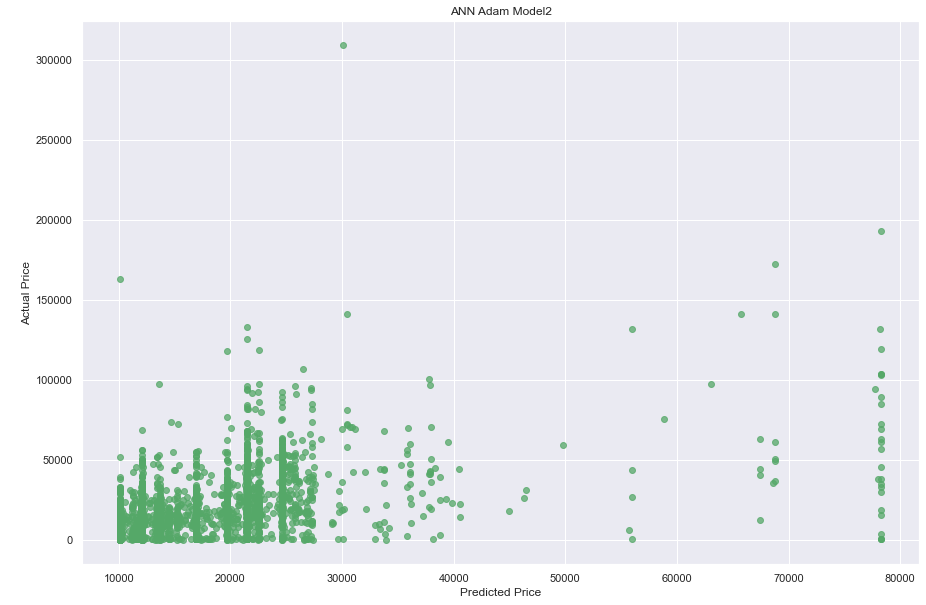

In [158]:
actual_values = y_test
plt.scatter(y_pred_adam_m2, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('ANN Adam Model2')
print(sqrt(mean_squared_error(y_test, y_pred_adam_m2[:,])))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

In [148]:
sqrt(mean_squared_error(y_test, y_pred_adam_m2[:,]))

15809.839162316248

In [185]:
from keras.layers.normalization import BatchNormalization
# artifical neural network dropout 2

#Inıtialising the ANN
model = Sequential()
#Adding the input layer and first hidden layer
model.add(Dense(units =150, kernel_initializer=he_normal(seed=None), activation= 'tanh', 
                input_dim=X_train.shape[1]))



#Add the first hidden layer
model.add(Dense(units =100, kernel_initializer=he_normal(seed=None), activation= 'tanh'))
model.add(Dropout(0.2))

#Add the second hidden layer
model.add(Dense(units =80, kernel_initializer=he_normal(seed=None), activation= 'tanh'))
model.add(BatchNormalization())
model.add(Dropout(0.2))

#Add the third hidden layer
model.add(Dense(units =50, kernel_initializer=he_normal(seed=None), activation= 'tanh'))


#Add the fourth hidden layer
model.add(Dense(units =30, kernel_initializer=he_normal(seed=None), activation= 'relu'))
model.add(BatchNormalization())

#Add the fifth hidden layer
model.add(Dense(units =10, kernel_initializer=he_normal(seed=None), activation= 'relu'))
model.add(BatchNormalization())

#The output layer
model.add(Dense(units =1, kernel_initializer=he_normal(seed=None), activation= 'elu'))

print(model.summary())

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 150)               2400      
_________________________________________________________________
dense_25 (Dense)             (None, 100)               15100     
_________________________________________________________________
dropout_5 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 80)                8080      
_________________________________________________________________
batch_normalization_5 (Batch (None, 80)                320       
_________________________________________________________________
dropout_6 (Dropout)          (None, 80)                0         
_________________________________________________________________
dense_27 (Dense)             (None, 50)               

In [156]:
# adam model 2

model.compile(optimizer= 'adam', loss= keras.losses.mean_squared_error, metrics=['mse'])
model.fit(X_train_nn,y_train, validation_split=0.07, epochs=3000)

Epoch 1/3000
447/447 [==============================] - 3s 3ms/step - loss: 610447790.0000 - mse: 610447790.0000 - val_loss: 593538240.0000 - val_mse: 593538240.0000
Epoch 2/3000
447/447 [==============================] - 1s 2ms/step - loss: 607283972.5000 - mse: 607283972.5000 - val_loss: 592445312.0000 - val_mse: 592445312.0000
Epoch 3/3000
447/447 [==============================] - 1s 2ms/step - loss: 618528284.5000 - mse: 618528284.5000 - val_loss: 591072576.0000 - val_mse: 591072576.0000
Epoch 4/3000
447/447 [==============================] - 1s 2ms/step - loss: 629402694.9286 - mse: 629402694.9286 - val_loss: 589379072.0000 - val_mse: 589379072.0000
Epoch 5/3000
447/447 [==============================] - 1s 2ms/step - loss: 682135580.1429 - mse: 682135580.1429 - val_loss: 586963264.0000 - val_mse: 586963264.0000
Epoch 6/3000
447/447 [==============================] - 1s 2ms/step - loss: 632761636.3571 - mse: 632761636.3571 - val_loss: 585885248.0000 - val_mse: 585885248.0000
Epoc

In [157]:
# adam model 2 predictions

y_pred_adam_m3 = model.predict(X_test)
y_pred_adam_m3

array([[43284.96 ],
       [17825.947],
       [10024.116],
       ...,
       [17831.19 ],
       [17825.95 ],
       [17831.188]], dtype=float32)

17038.719079301864


<ipython-input-160-57dfb124279c>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


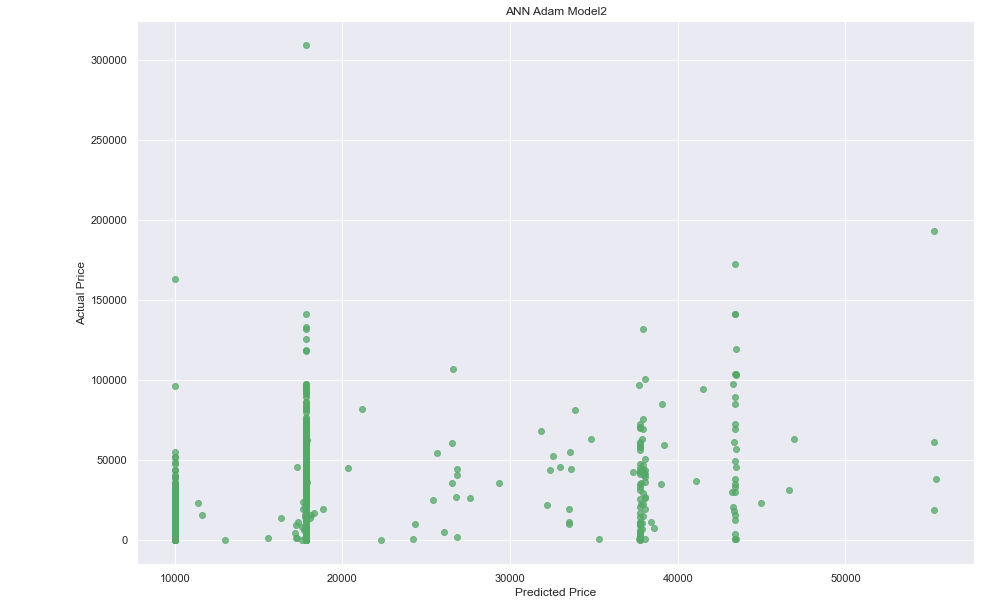

In [160]:
actual_values = y_test
plt.scatter(y_pred_adam_m3, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('ANN Adam Model2')
print(sqrt(mean_squared_error(y_test, y_pred_adam_m3[:,])))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

In [174]:
# removing lower end outliers

indexNames2 = train5[ train5['Price'] < 1000 ].index
train5.drop(indexNames2 , inplace=True)
train5

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color,Mileage,Airbags,Cylinders,Prod_year,Engine_volume,Manufacturer,Model,Price
0,4.0,1.0,2.0,0.0,0.0,1.0,0.0,12.0,14.0,4.0,2.0,5.0,4.0,13.0,742.0,13328
1,4.0,0.0,5.0,2.0,0.0,1.0,0.0,1.0,15.0,3.0,2.0,6.0,4.0,18.0,1334.0,16621
2,3.0,0.0,5.0,3.0,1.0,1.0,1.0,1.0,15.0,1.0,2.0,5.0,2.0,35.0,278.0,8467
3,4.0,1.0,2.0,0.0,0.0,1.0,0.0,14.0,13.0,0.0,2.0,6.0,3.0,2.0,219.0,3607
4,3.0,1.0,5.0,0.0,1.0,1.0,0.0,12.0,6.0,2.0,2.0,6.0,2.0,13.0,715.0,11726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19231,9.0,1.0,1.0,0.0,2.0,1.0,0.0,7.0,8.0,4.0,2.0,6.0,4.0,29.0,385.0,5802
19232,1.0,1.0,0.0,1.0,2.0,0.0,0.0,12.0,18.0,2.0,2.0,3.0,30.0,6.0,541.0,8467
19233,9.0,1.0,5.0,2.0,1.0,1.0,0.0,11.0,13.0,3.0,2.0,6.0,3.0,18.0,1334.0,15681
19234,4.0,1.0,1.0,0.0,1.0,1.0,0.0,7.0,9.0,2.0,2.0,5.0,3.0,18.0,1442.0,26108


(array([1.3952e+04, 2.2380e+03, 3.1600e+02, 9.3000e+01, 3.1000e+01,
        9.0000e+00, 3.0000e+00, 2.0000e+00, 3.0000e+00, 4.0000e+00]),
 array([  1000. ,  31790.6,  62581.2,  93371.8, 124162.4, 154953. ,
        185743.6, 216534.2, 247324.8, 278115.4, 308906. ]),
 <BarContainer object of 10 artists>)

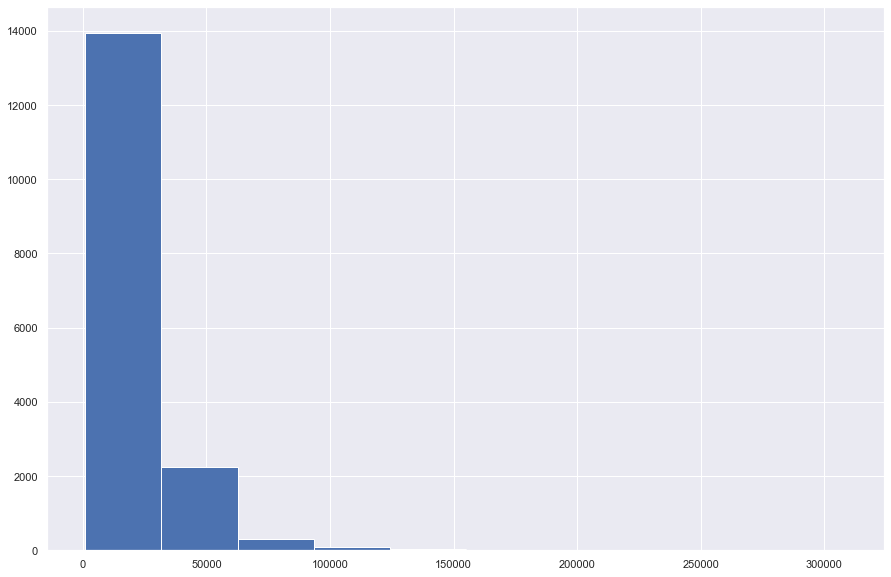

In [176]:
plt.hist(train5['Price'])

In [192]:
# test train split after lower end outlier removal

X = train5.iloc[:, : -1]
y = train5.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [178]:
# XGBOOST 2

regr = xgb.XGBRegressor(silent=False, random_state=15)
#regr = MultiOutputRegressor(regr1)
# declare parameters for hyperparameter tuning
parameters = {'learning_rate':[0.001,0.01,0.1],'n_estimators':[100,300,500,700],'max_depth':[1,2,3]} 

# Perform cross validation 
clf = GridSearchCV(regr,
                    param_grid = parameters,
                    scoring="neg_mean_squared_error",
                    cv = 5,
                    n_jobs = -1,
                    verbose = 1)
result = clf.fit(X_train, y_train)

# Summarize results
print("Best: %f using %s" % (result.best_score_, result.best_params_))
means = result.cv_results_['mean_test_score']
stds = result.cv_results_['std_test_score']
params = result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f 1(%f) with: %r" % (mean, stdev, param))   

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[16:10:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Best: -136365797.787386 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
-634861809.850902 1(17609247.264110) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 100}
-520858080.111444 1(18067438.494147) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 300}
-442994986.240088 1(18349316.493932) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 500}
-389188818.634884 1(18591149.602914) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators'

In [179]:
xgb2 = xgb.XGBRegressor(max_depth=3,learning_rate = 0.1,n_estimators=500,nthread=-1)
xgb2

XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=0.1, max_delta_step=None, max_depth=3,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, nthread=-1, num_parallel_tree=None,
             random_state=None, reg_alpha=None, reg_lambda=None,
             scale_pos_weight=None, subsample=None, tree_method=None,
             validate_parameters=None, verbosity=None)

In [180]:
y_pred_testf4=clf.predict(X_test)

<ipython-input-181-94ce8590d1f3>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


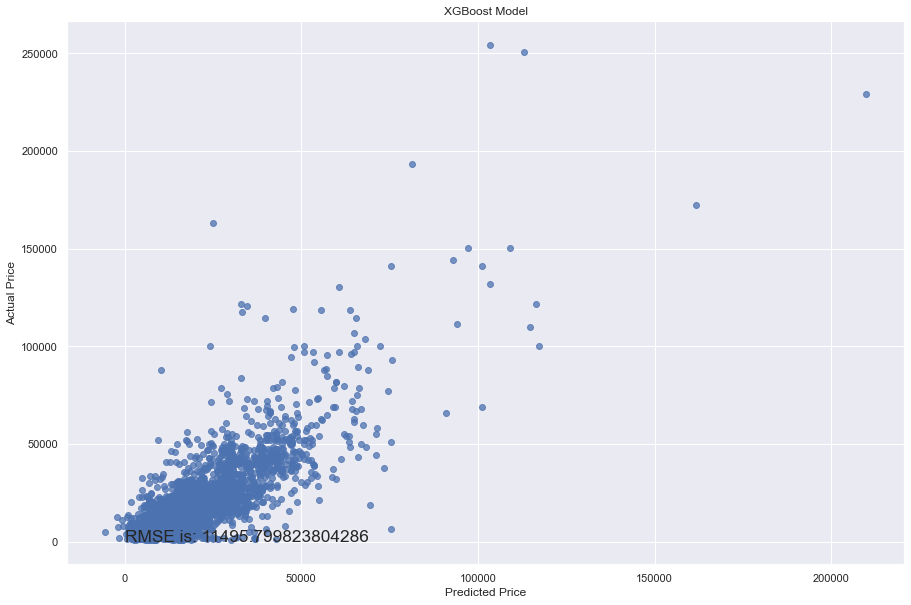

11495.799823804286


In [181]:
actual_values = y_test
plt.scatter(y_pred_testf4, actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('XGBoost Model')
overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(y_test, y_pred_testf4)))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()
print(sqrt(mean_squared_error(y_test, y_pred_testf4)))

<ipython-input-182-732b2e9bfe00>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


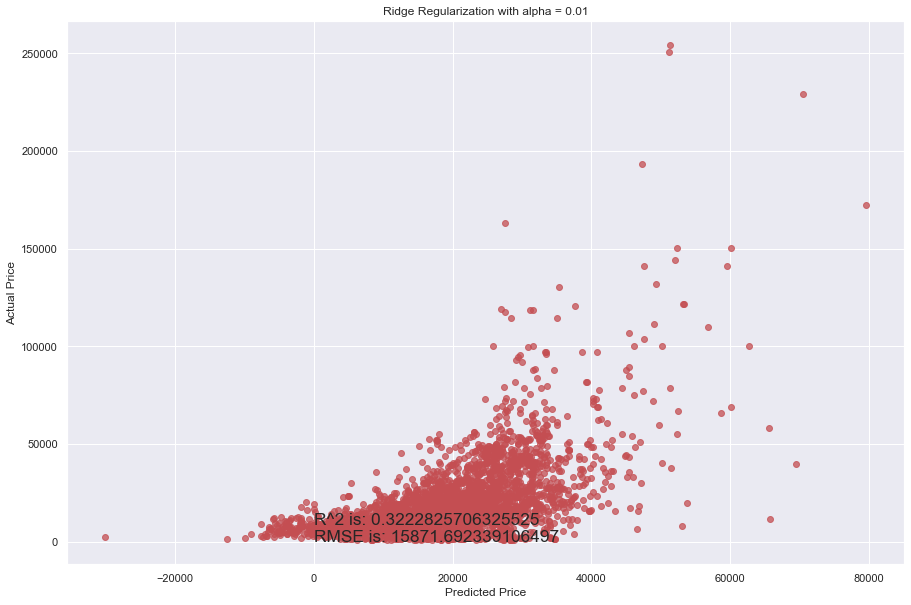

<ipython-input-182-732b2e9bfe00>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


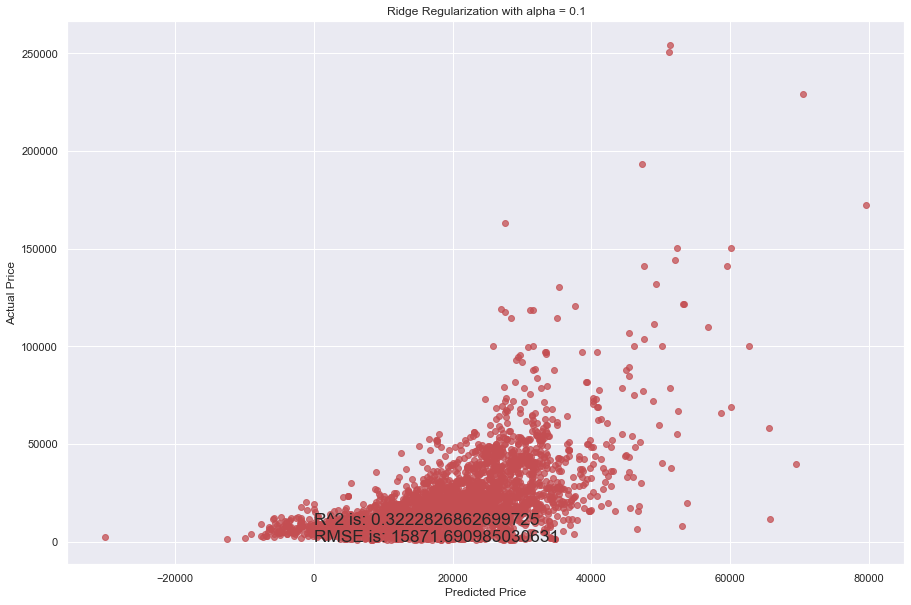

<ipython-input-182-732b2e9bfe00>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


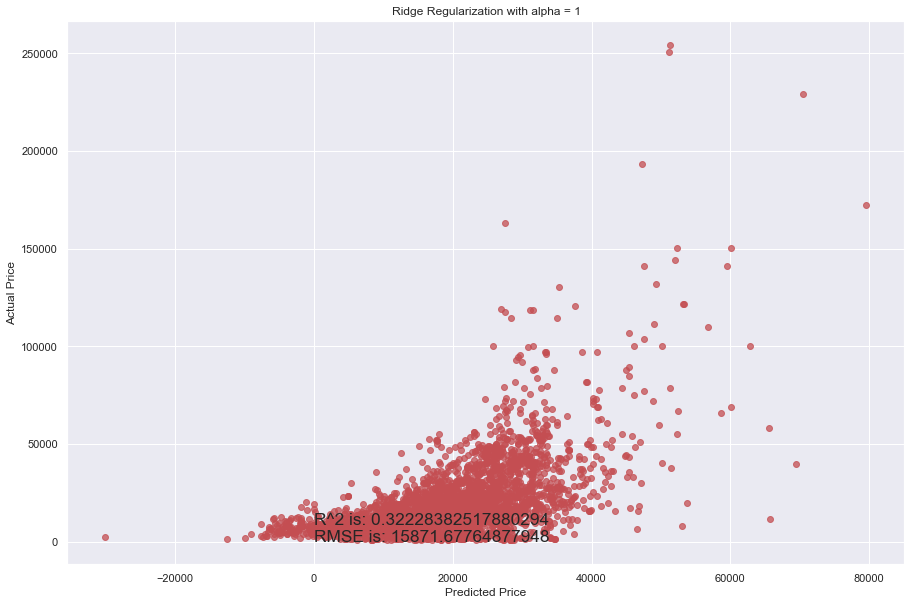

<ipython-input-182-732b2e9bfe00>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


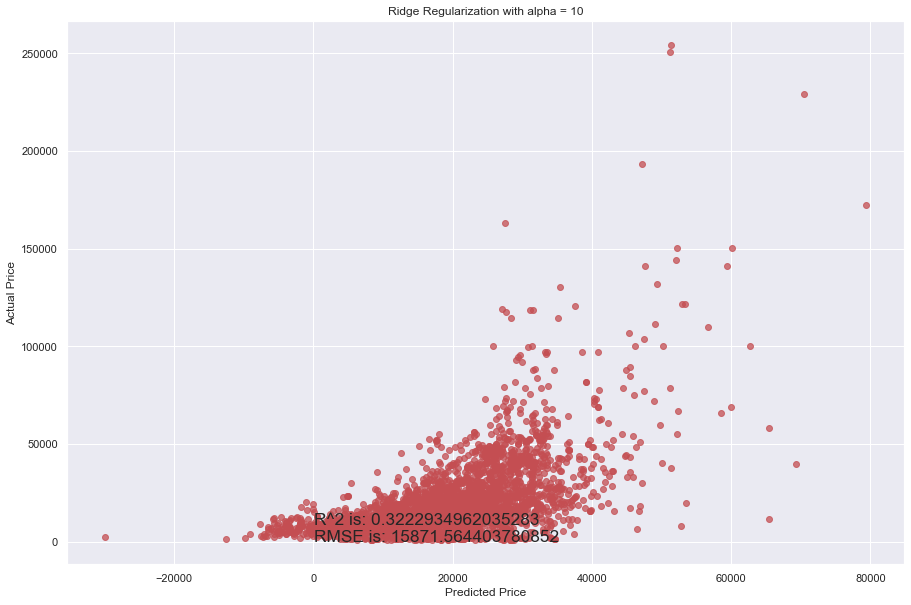

<ipython-input-182-732b2e9bfe00>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


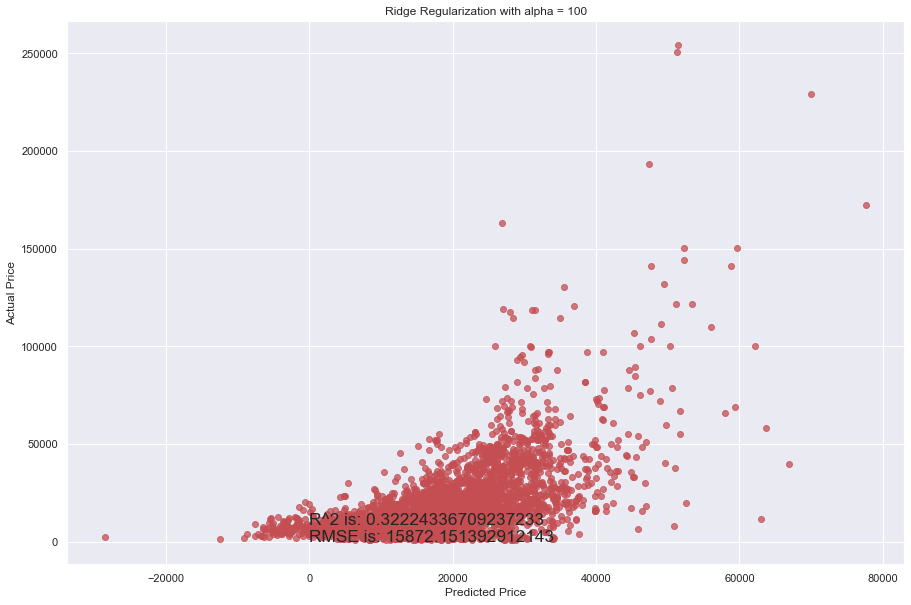

In [182]:
# LASSO 2

for i in range (-2, 3):
    alpha = 10**i
    rm = linear_model.Ridge(alpha=alpha)
    ridge_model = rm.fit(X_train, y_train)
    preds_ridge = ridge_model.predict(X_test)
    actual_values = y_test
    plt.scatter(preds_ridge, actual_values, alpha=.75, color='r')
    plt.xlabel('Predicted Price')
    plt.ylabel('Actual Price')
    plt.title('Ridge Regularization with alpha = {}'.format(alpha))
    overlay = 'R^2 is: {}\nRMSE is: {}'.format(
                    ridge_model.score(X_test, y_test),
                    sqrt(mean_squared_error(y_test, preds_ridge)))
    plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
    plt.show()

In [183]:
# Linear regression 2

lr = linear_model.LinearRegression()
model = lr.fit(X_train, y_train)
predictions2 = model.predict(X_test)

<ipython-input-184-d4470746a09b>:10: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


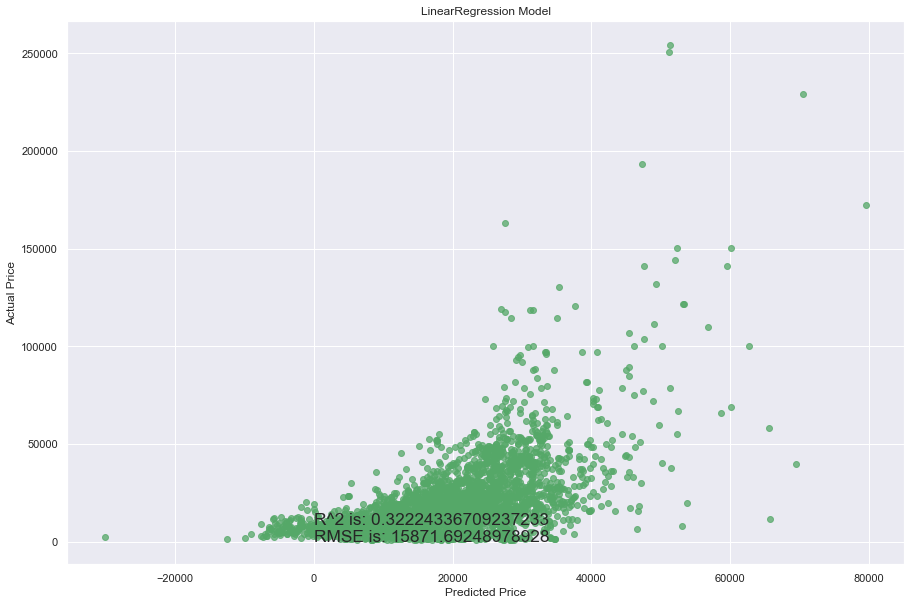

In [184]:
actual_values = y_test
plt.scatter(predictions2, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('LinearRegression Model')
overlay = 'R^2 is: {}\nRMSE is: {}'.format(
                    ridge_model.score(X_test, y_test),
                    sqrt(mean_squared_error(y_test, predictions2)))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

In [189]:
# adam 3

model.compile(optimizer= 'adam', loss= keras.losses.mean_squared_error, metrics=['mse'])
model.fit(X_train_nn,y_train, validation_split=0.07, batch_size=64, epochs=3000)

Epoch 1/3000
194/194 [==============================] - 3s 4ms/step - loss: 703541956.5949 - mse: 703541956.5949 - val_loss: 661085504.0000 - val_mse: 661085504.0000
Epoch 2/3000
194/194 [==============================] - 0s 2ms/step - loss: 679612736.6564 - mse: 679612736.6564 - val_loss: 661105024.0000 - val_mse: 661105024.0000
Epoch 3/3000
194/194 [==============================] - 0s 2ms/step - loss: 770384167.5487 - mse: 770384167.5487 - val_loss: 660152064.0000 - val_mse: 660152064.0000
Epoch 4/3000
194/194 [==============================] - 0s 2ms/step - loss: 725777566.5231 - mse: 725777566.5231 - val_loss: 659961024.0000 - val_mse: 659961024.0000
Epoch 5/3000
194/194 [==============================] - 0s 2ms/step - loss: 714207858.8718 - mse: 714207858.8718 - val_loss: 660693824.0000 - val_mse: 660693824.0000
Epoch 6/3000
194/194 [==============================] - 0s 2ms/step - loss: 723142043.8974 - mse: 723142043.8974 - val_loss: 660829696.0000 - val_mse: 660829696.0000
Epoc

In [190]:
y_pred_adam_m3_bs = model.predict(X_test)
y_pred_adam_m3_bs

array([[21719.297],
       [21719.299],
       [21719.299],
       ...,
       [21719.287],
       [40682.62 ],
       [13674.514]], dtype=float32)

17062.10164880151


<ipython-input-191-ad23499c806f>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


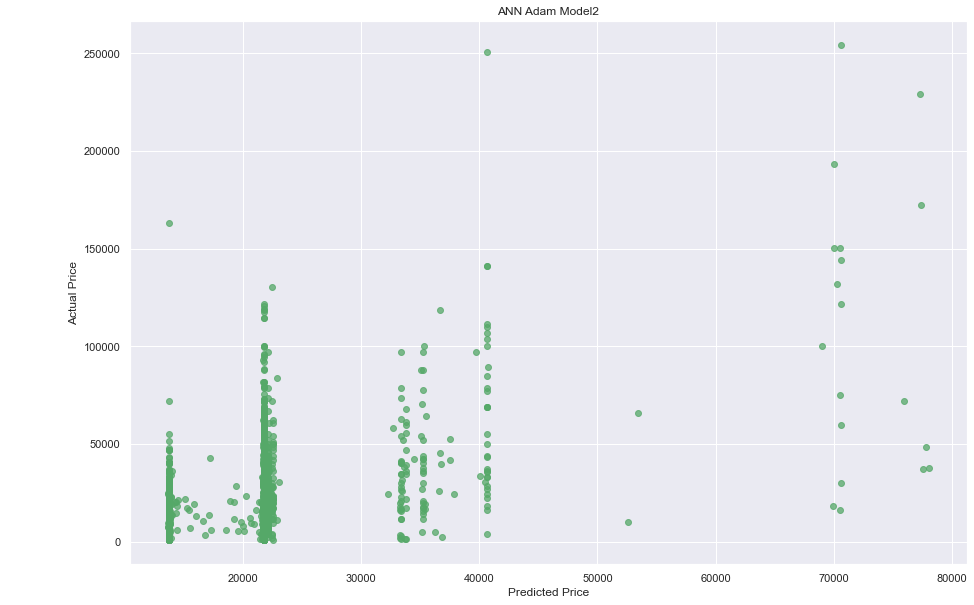

In [191]:
actual_values = y_test
plt.scatter(y_pred_adam_m3_bs, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('ANN Adam Model2')
print(sqrt(mean_squared_error(y_test, y_pred_adam_m3_bs[:,])))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

Feature 0: 4179.606249
Feature 1: 1462.000422
Feature 2: 4111.252260
Feature 3: 6550.693756
Feature 4: 736.053455
Feature 5: 88.827889
Feature 6: 3154.002373
Feature 7: 11522.636559
Feature 8: 13356.739813
Feature 9: 2233.257355
Feature 10: 153.968206
Feature 11: 1631.042008
Feature 12: 60902.986564
Feature 13: 16193.793510
Feature 14: 426735.870327


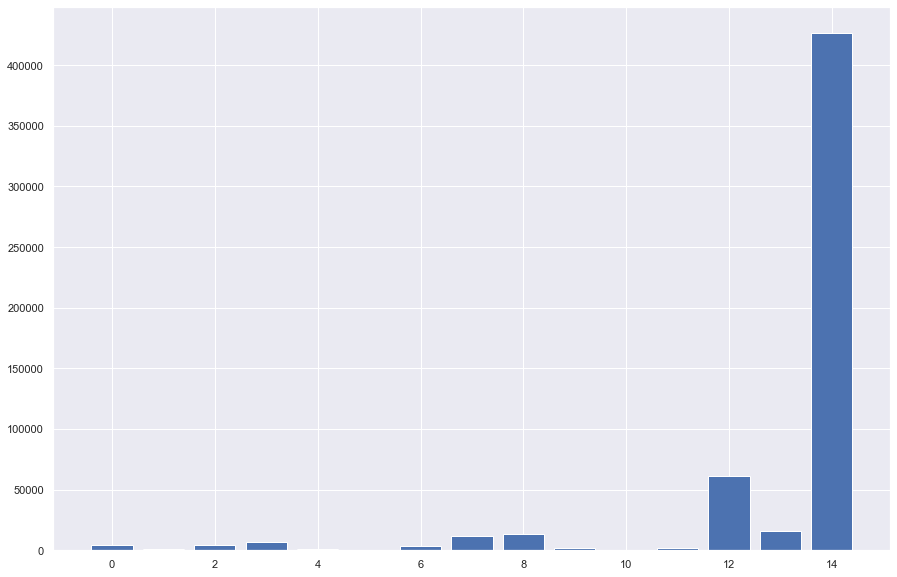

In [196]:
# feature selection based on chi2

fs = SelectKBest(score_func=chi2, k='all') 
fs.fit(X, y)
X_enc_ch = fs.transform(X) 


# Scores for the features - Chi-Squared Feature Selection
for i in range(len(fs.scores_)): print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

In [197]:
X.columns

Index(['Category', 'Leather interior', 'Fuel type', 'Gear box type',
       'Drive wheels', 'Doors', 'Wheel', 'Color', 'Mileage', 'Airbags',
       'Cylinders', 'Prod_year', 'Engine_volume', 'Manufacturer', 'Model'],
      dtype='object')

In [199]:
X_fs = X.drop(['Leather interior','Drive wheels', 'Doors', 'Cylinders', 'Prod_year'],  axis = 1)
X_fs

,Category,Fuel type,Gear box type,Wheel,Color,Mileage,Airbags,Engine_volume,Manufacturer,Model
0,4.0,2.0,0.0,0.0,12.0,14.0,4.0,4.0,13.0,742.0
1,4.0,5.0,2.0,0.0,1.0,15.0,3.0,4.0,18.0,1334.0
2,3.0,5.0,3.0,1.0,1.0,15.0,1.0,2.0,35.0,278.0
3,4.0,2.0,0.0,0.0,14.0,13.0,0.0,3.0,2.0,219.0
4,3.0,5.0,0.0,0.0,12.0,6.0,2.0,2.0,13.0,715.0
...,...,...,...,...,...,...,...,...,...,...
19231,9.0,1.0,0.0,0.0,7.0,8.0,4.0,4.0,29.0,385.0
19232,1.0,0.0,1.0,0.0,12.0,18.0,2.0,30.0,6.0,541.0
19233,9.0,5.0,2.0,0.0,11.0,13.0,3.0,3.0,18.0,1334.0
19234,4.0,1.0,0.0,0.0,7.0,9.0,2.0,3.0,18.0,1442.0


In [200]:
# test train split after feature selection

X_train_fs, X_test_fs, y_train_fs, y_test_fs = train_test_split(X_fs, y, test_size=0.2, random_state=1)

In [201]:
# XGBOOST 3

# initialize Our first XGBoost model...
regr = xgb.XGBRegressor(silent=False, random_state=15)
#regr = MultiOutputRegressor(regr1)
# declare parameters for hyperparameter tuning
parameters = {'learning_rate':[0.001,0.01,0.1],'n_estimators':[100,300,500,700],'max_depth':[1,2,3]} 

# Perform cross validation 
clf = GridSearchCV(regr,
                    param_grid = parameters,
                    scoring="neg_mean_squared_error",
                    cv = 5,
                    n_jobs = -1,
                    verbose = 1)
result = clf.fit(X_train_fs, y_train_fs)

# Summarize results
print("Best: %f using %s" % (result.best_score_, result.best_params_))
means = result.cv_results_['mean_test_score']
stds = result.cv_results_['std_test_score']
params = result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f 1(%f) with: %r" % (mean, stdev, param))  

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[16:59:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Best: -194022048.821589 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
-637225320.147544 1(17708264.408163) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 100}
-526976766.947169 1(17998423.033432) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 300}
-452354294.180830 1(17855528.704077) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators': 500}
-401607956.482365 1(17755615.279079) with: {'learning_rate': 0.001, 'max_depth': 1, 'n_estimators'

In [202]:
xgb3 = xgb.XGBRegressor(max_depth=3,learning_rate = 0.1,n_estimators=500,nthread=-1)
xgb3

XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=0.1, max_delta_step=None, max_depth=3,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, nthread=-1, num_parallel_tree=None,
             random_state=None, reg_alpha=None, reg_lambda=None,
             scale_pos_weight=None, subsample=None, tree_method=None,
             validate_parameters=None, verbosity=None)

In [203]:
y_pred_testf5=clf.predict(X_test_fs)

<ipython-input-205-1b004bcddcf0>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


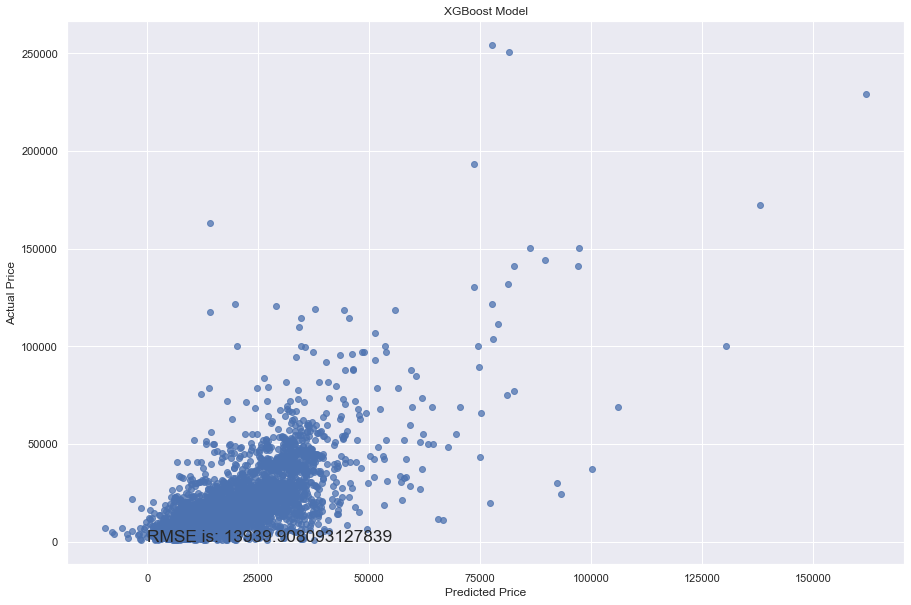

13939.908093127839


In [205]:
actual_values = y_test_fs
plt.scatter(y_pred_testf5, actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('XGBoost Model')
overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(y_test_fs, y_pred_testf5)))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()
print(sqrt(mean_squared_error(y_test_fs, y_pred_testf5)))

<ipython-input-208-e2f62b4a0967>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


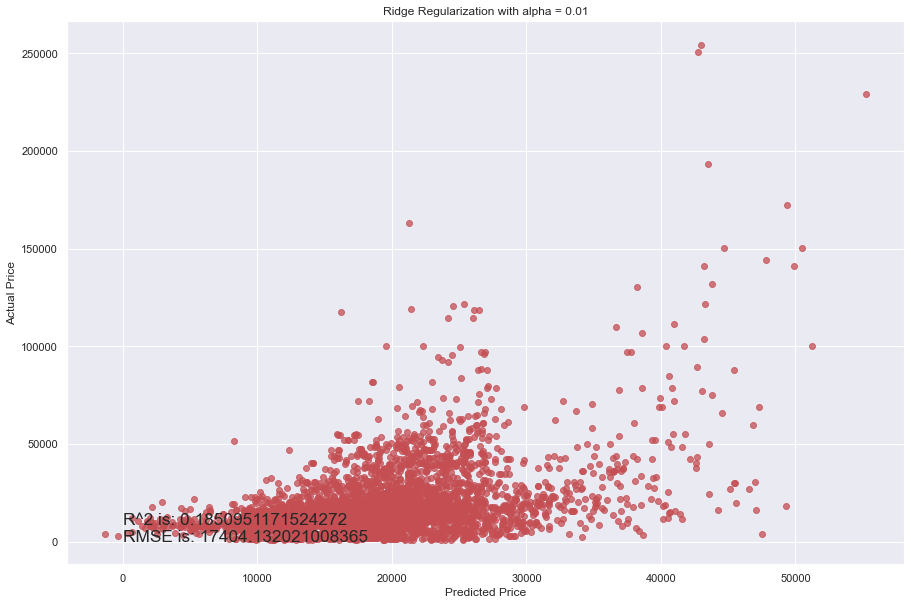

<ipython-input-208-e2f62b4a0967>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


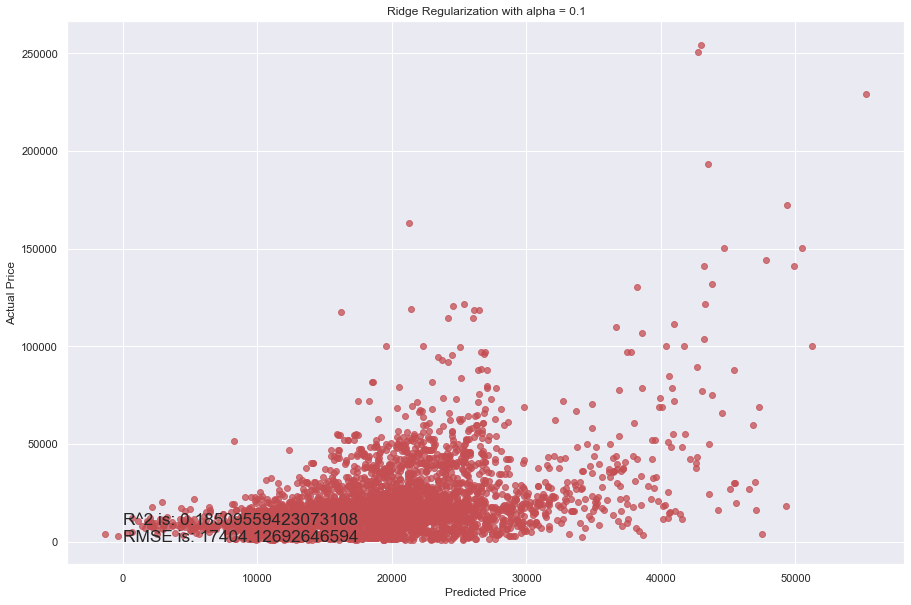

<ipython-input-208-e2f62b4a0967>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


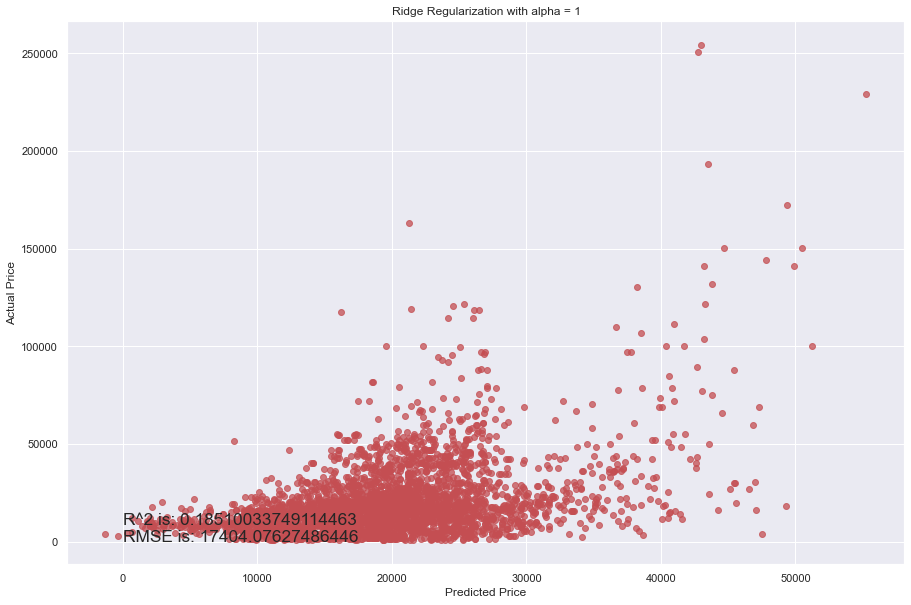

<ipython-input-208-e2f62b4a0967>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


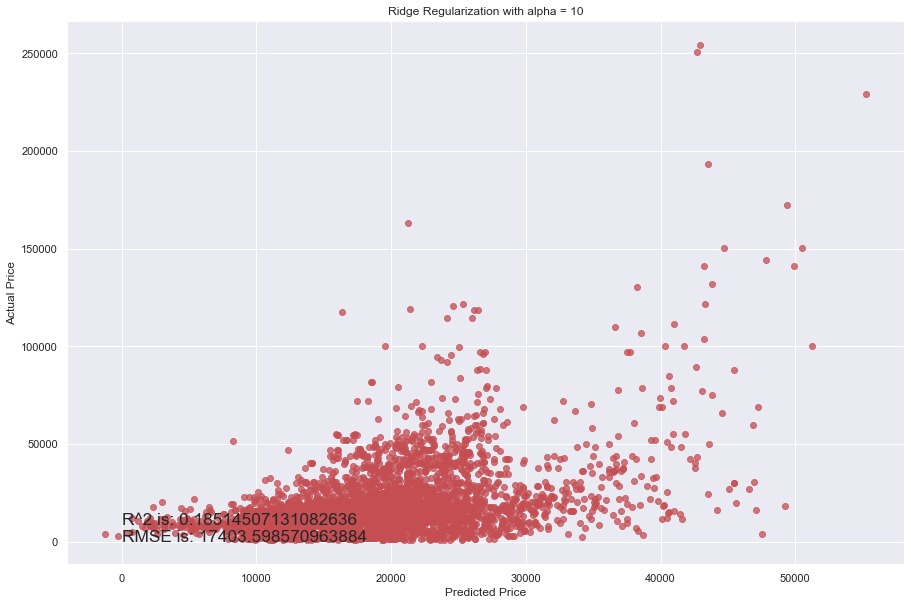

<ipython-input-208-e2f62b4a0967>:14: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


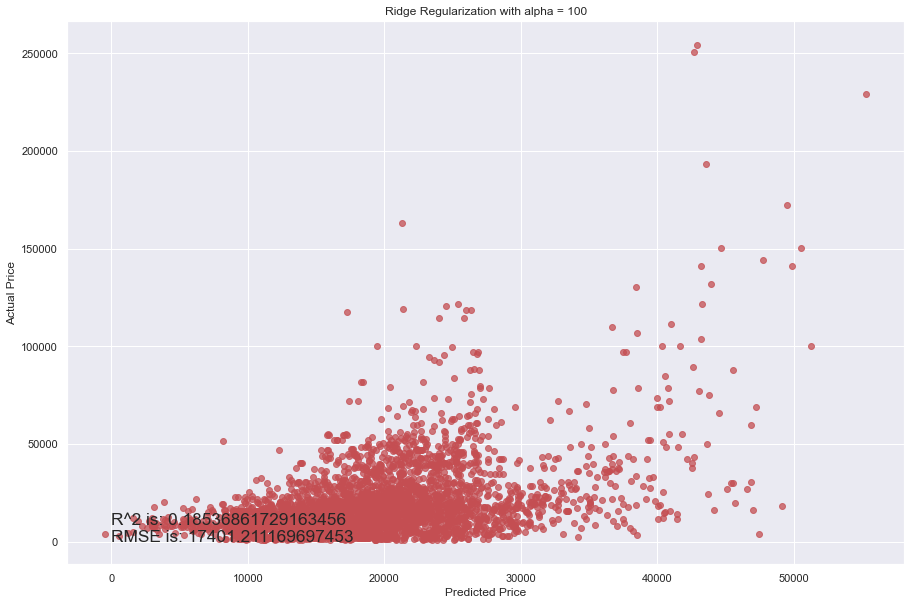

In [208]:
# Lasso 3

for i in range (-2, 3):
    alpha = 10**i
    rm = linear_model.Ridge(alpha=alpha)
    ridge_model2 = rm.fit(X_train_fs, y_train_fs)
    preds_ridge2 = ridge_model2.predict(X_test_fs)
    actual_values = y_test_fs
    plt.scatter(preds_ridge2, actual_values, alpha=.75, color='r')
    plt.xlabel('Predicted Price')
    plt.ylabel('Actual Price')
    plt.title('Ridge Regularization with alpha = {}'.format(alpha))
    overlay = 'R^2 is: {}\nRMSE is: {}'.format(
                    ridge_model2.score(X_test_fs, y_test_fs),
                    sqrt(mean_squared_error(y_test_fs, preds_ridge2)))
    plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
    plt.show()

In [209]:
# linear regression 3

lr = linear_model.LinearRegression()
model = lr.fit(X_train_fs, y_train_fs)
predictions3 = model.predict(X_test_fs)

<ipython-input-210-7b076819a800>:10: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


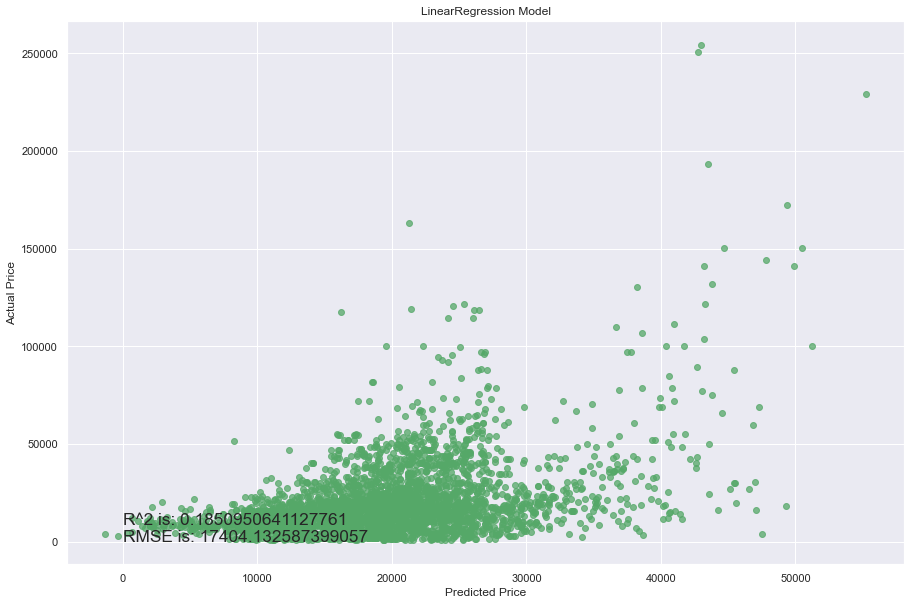

In [210]:
actual_values = y_test_fs
plt.scatter(predictions3, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('LinearRegression Model')
overlay = 'R^2 is: {}\nRMSE is: {}'.format(
                    model.score(X_test_fs, y_test_fs),
                    sqrt(mean_squared_error(y_test_fs, predictions3)))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

In [211]:
X_train_fs_nn = np.asarray(X_train_fs).astype('float32')
X_train_fs_nn

array([[4.000e+00, 1.000e+00, 0.000e+00, ..., 2.000e+00, 1.800e+01,
        1.305e+03],
       [9.000e+00, 1.000e+00, 0.000e+00, ..., 3.000e+00, 4.800e+01,
        3.700e+02],
       [4.000e+00, 5.000e+00, 0.000e+00, ..., 5.000e+00, 3.000e+00,
        1.520e+02],
       ...,
       [9.000e+00, 2.000e+00, 0.000e+00, ..., 4.000e+00, 4.200e+01,
        9.290e+02],
       [4.000e+00, 1.000e+00, 0.000e+00, ..., 3.000e+00, 4.200e+01,
        9.290e+02],
       [9.000e+00, 2.000e+00, 0.000e+00, ..., 3.000e+00, 2.900e+01,
        3.430e+02]], dtype=float32)

In [215]:
X_train_fs_nn.shape

(13320, 10)

In [214]:
y_train_fs.shape

(13320,)

In [231]:
X_train_fs_nn = np.reshape(X_train_fs_nn, (X_train_fs_nn.shape[0], 1, X_train_fs_nn.shape[1]))
X_train_fs_nn.shape

(13320, 1, 10)

In [252]:
X_train_fs_nn.shape

(13320, 1, 10)

In [245]:
X_test_fs_nn = np.asarray(X_test_fs).astype('float32')
X_test_fs_nn

array([[4.000e+00, 1.000e+00, 0.000e+00, ..., 3.000e+00, 1.600e+01,
        6.840e+02],
       [3.000e+00, 2.000e+00, 3.000e+00, ..., 2.000e+00, 2.600e+01,
        9.790e+02],
       [3.000e+00, 5.000e+00, 0.000e+00, ..., 2.000e+00, 1.800e+01,
        1.305e+03],
       ...,
       [9.000e+00, 5.000e+00, 3.000e+00, ..., 3.000e+00, 4.200e+01,
        1.226e+03],
       [4.000e+00, 1.000e+00, 2.000e+00, ..., 4.000e+01, 3.000e+00,
        1.553e+03],
       [3.000e+00, 5.000e+00, 2.000e+00, ..., 2.000e+00, 2.500e+01,
        1.242e+03]], dtype=float32)

In [255]:
X_test_fs_nn = np.reshape(X_test_fs_nn, (X_test_fs_nn.shape[0], 1, X_test_fs_nn.shape[1]))
X_test_fs_nn.shape

(3331, 1, 10)

In [ ]:
from keras.layers import LSTM, GRU
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from imblearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error,r2_score, accuracy_score
from xgboost import XGBRegressor
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error

In [279]:
# GRU model

model2 = Sequential()

model2.add(GRU(units =500, kernel_initializer=he_normal(seed=None), activation= 'tanh', 
                input_dim= ( X_train.shape[1]), return_sequences=True))



#Add the first hidden layer
model2.add(GRU(units =400, kernel_initializer=he_normal(seed=None), return_sequences=True, activation= 'tanh'))
model.add(Dropout(0.2))

#Add the second hidden layer
model2.add(GRU(units =300, kernel_initializer=he_normal(seed=None), return_sequences=True, activation= 'tanh'))
model2.add(BatchNormalization())
model2.add(Dropout(0.2))

#Add the third hidden layer
model2.add(GRU(units =200, kernel_initializer=he_normal(seed=None), return_sequences=True, activation= 'tanh'))


#Add the fourth hidden layer
model2.add(GRU(units =100, kernel_initializer=he_normal(seed=None), return_sequences=True, activation= 'relu'))
model2.add(BatchNormalization())
model2.add(Dropout(0.2))

#Add the fifth hidden layer
model2.add(GRU(units =50, kernel_initializer=he_normal(seed=None), return_sequences=True, activation= 'relu'))
model2.add(BatchNormalization())

#The output layer
model2.add(Dense(units =1, kernel_initializer=he_normal(seed=None), activation= 'elu'))

print(model2.summary())

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_60 (GRU)                 (None, None, 500)         775500    
_________________________________________________________________
gru_61 (GRU)                 (None, None, 400)         1082400   
_________________________________________________________________
gru_62 (GRU)                 (None, None, 300)         631800    
_________________________________________________________________
batch_normalization_31 (Batc (None, None, 300)         1200      
_________________________________________________________________
dropout_34 (Dropout)         (None, None, 300)         0         
_________________________________________________________________
gru_63 (GRU)                 (None, None, 200)         301200    
_________________________________________________________________
gru_64 (GRU)                 (None, None, 100)       

In [236]:
# adam 4(fs gru)

model.compile(optimizer= 'adam', loss= keras.losses.mean_squared_error, metrics=['mse'])
model.fit(X_train_fs_nn,y_train_fs, validation_split=0.07, batch_size=64, epochs=3000)

Epoch 1/3000
194/194 [==============================] - 22s 40ms/step - loss: 711238801.0667 - mse: 711238801.0667 - val_loss: 661074048.0000 - val_mse: 661074048.0000
Epoch 2/3000
194/194 [==============================] - 6s 31ms/step - loss: 714922163.8564 - mse: 714922163.8564 - val_loss: 658974336.0000 - val_mse: 658974336.0000
Epoch 3/3000
194/194 [==============================] - 6s 31ms/step - loss: 738356514.7897 - mse: 738356514.7897 - val_loss: 657258112.0000 - val_mse: 657258112.0000
Epoch 4/3000
194/194 [==============================] - 6s 31ms/step - loss: 723823749.2513 - mse: 723823749.2513 - val_loss: 655064192.0000 - val_mse: 655064192.0000
Epoch 5/3000
194/194 [==============================] - 6s 31ms/step - loss: 779095963.2410 - mse: 779095963.2410 - val_loss: 656026880.0000 - val_mse: 656026880.0000
Epoch 6/3000
194/194 [==============================] - 6s 31ms/step - loss: 725612112.2462 - mse: 725612112.2462 - val_loss: 653961664.0000 - val_mse: 653961664.00

In [257]:
y_pred_adam_m4_gru = model.predict(X_test_fs_nn)
y_pred_adam_m4_gru

array([[[28642.252]],

       [[25635.805]],

       [[15341.981]],

       ...,

       [[11821.369]],

       [[46655.855]],

       [[15476.747]]], dtype=float32)

In [266]:
y_pred_adam_m4_gru[:,0]

array([[28642.252],
       [25635.805],
       [15341.981],
       ...,
       [11821.369],
       [46655.855],
       [15476.747]], dtype=float32)

15976.441780625637


<ipython-input-267-8710910bb5cb>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


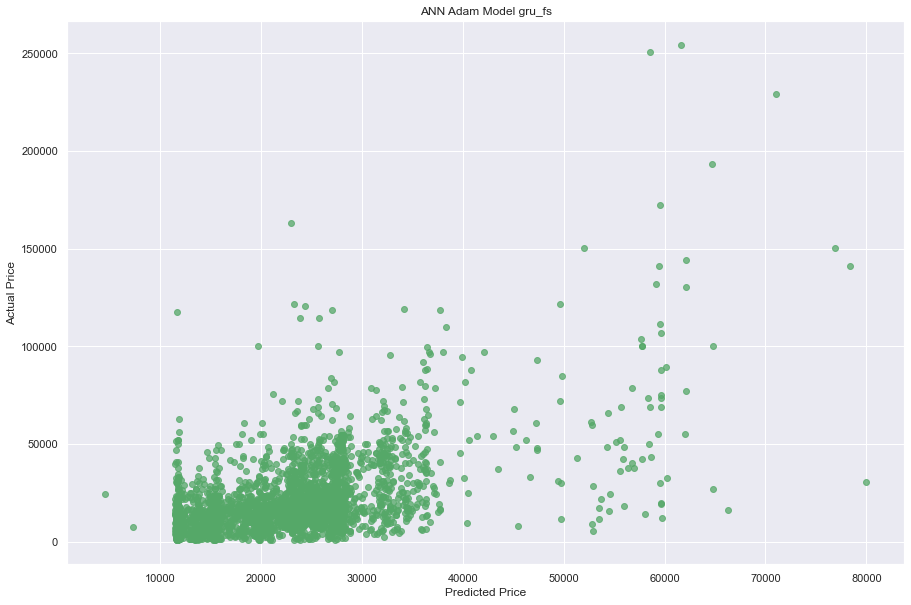

In [267]:
actual_values = y_test_fs
plt.scatter(y_pred_adam_m4_gru, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('ANN Adam Model gru_fs')
print(sqrt(mean_squared_error(y_test_fs, y_pred_adam_m4_gru[:,0])))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

In [269]:
X_train_nn2 = np.asarray(X_train).astype('float32')
X_train_nn2

array([[4.000e+00, 1.000e+00, 1.000e+00, ..., 2.000e+00, 1.800e+01,
        1.305e+03],
       [9.000e+00, 0.000e+00, 1.000e+00, ..., 3.000e+00, 4.800e+01,
        3.700e+02],
       [4.000e+00, 1.000e+00, 5.000e+00, ..., 5.000e+00, 3.000e+00,
        1.520e+02],
       ...,
       [9.000e+00, 1.000e+00, 2.000e+00, ..., 4.000e+00, 4.200e+01,
        9.290e+02],
       [4.000e+00, 1.000e+00, 1.000e+00, ..., 3.000e+00, 4.200e+01,
        9.290e+02],
       [9.000e+00, 1.000e+00, 2.000e+00, ..., 3.000e+00, 2.900e+01,
        3.430e+02]], dtype=float32)

In [270]:
X_train_nn2.shape

(13320, 15)

In [271]:
X_test_nn2 = np.asarray(X_test).astype('float32')
X_test_nn2

array([[4.000e+00, 1.000e+00, 1.000e+00, ..., 3.000e+00, 1.600e+01,
        6.840e+02],
       [3.000e+00, 0.000e+00, 2.000e+00, ..., 2.000e+00, 2.600e+01,
        9.790e+02],
       [3.000e+00, 1.000e+00, 5.000e+00, ..., 2.000e+00, 1.800e+01,
        1.305e+03],
       ...,
       [9.000e+00, 1.000e+00, 5.000e+00, ..., 3.000e+00, 4.200e+01,
        1.226e+03],
       [4.000e+00, 1.000e+00, 1.000e+00, ..., 4.000e+01, 3.000e+00,
        1.553e+03],
       [3.000e+00, 0.000e+00, 5.000e+00, ..., 2.000e+00, 2.500e+01,
        1.242e+03]], dtype=float32)

In [272]:
X_train_nn2 = np.reshape(X_train_nn2, (X_train_nn2.shape[0], 1, X_train_nn2.shape[1]))
X_train_nn2.shape

(13320, 1, 15)

In [273]:
X_test_nn2 = np.reshape(X_test_nn2, (X_test_nn2.shape[0], 1, X_test_nn2.shape[1]))
X_test_nn2.shape

(3331, 1, 15)

In [274]:
y_train

14386    44545
10764    13485
6887     52059
17722    40769
9990     11917
         ...  
9045     14113
12643    11604
6015     26030
14052    25512
285       2587
Name: Price, Length: 13320, dtype: int64

In [280]:
# adam 5 (gru)

model2.compile(optimizer= 'adam', loss= keras.losses.mean_squared_error, metrics=['mse'])
model2.fit(X_train_nn2,y_train, validation_split=0.07, batch_size=64, epochs=3000)

Epoch 1/3000
194/194 [==============================] - 16s 41ms/step - loss: 678271591.7128 - mse: 678271591.7128 - val_loss: 661232896.0000 - val_mse: 661232896.0000
Epoch 2/3000
194/194 [==============================] - 6s 31ms/step - loss: 692480580.9231 - mse: 692480580.9231 - val_loss: 661235072.0000 - val_mse: 661235072.0000
Epoch 3/3000
194/194 [==============================] - 6s 32ms/step - loss: 705002343.0564 - mse: 705002343.0564 - val_loss: 661231680.0000 - val_mse: 661231680.0000
Epoch 4/3000
194/194 [==============================] - 6s 32ms/step - loss: 730432147.3641 - mse: 730432147.3641 - val_loss: 655431488.0000 - val_mse: 655431488.0000
Epoch 5/3000
194/194 [==============================] - 6s 31ms/step - loss: 676115055.0974 - mse: 676115055.0974 - val_loss: 661233152.0000 - val_mse: 661233152.0000
Epoch 6/3000
194/194 [==============================] - 6s 31ms/step - loss: 749432497.5590 - mse: 749432497.5590 - val_loss: 649529856.0000 - val_mse: 649529856.00

In [282]:
y_pred_adam_m5_gru = model2.predict(X_test_nn2)
y_pred_adam_m5_gru

array([[[ 1.6721039e+04]],

       [[-1.0000000e+00]],

       [[-1.0000000e+00]],

       ...,

       [[-1.0000000e+00]],

       [[ 1.8054946e+03]],

       [[-1.0000000e+00]]], dtype=float32)

27865.493602231636


<ipython-input-285-92a9a5e941c2>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


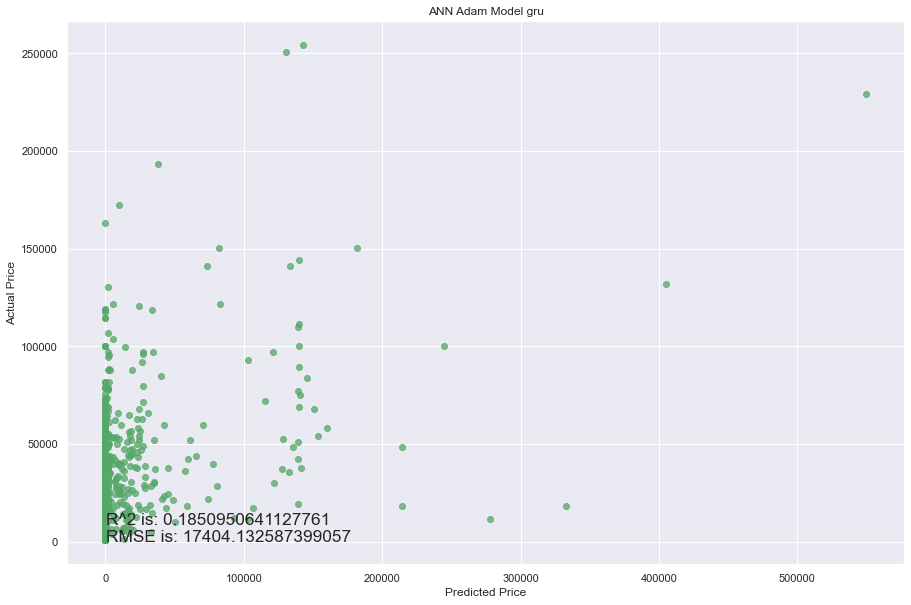

In [285]:
actual_values = y_test
plt.scatter(y_pred_adam_m5_gru, actual_values, alpha=.75,
            color='g') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('ANN Adam Model gru')
print(sqrt(mean_squared_error(y_test, y_pred_adam_m5_gru[:,0])))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()

In [288]:
reg= LinearRegression()

lreg= Lasso(alpha=0.1)

GBoost = GradientBoostingRegressor(n_estimators=300, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5) #loss huber is prone to outliers

rf= RandomForestRegressor(n_estimators=300,max_depth=4,min_samples_leaf=5,min_samples_split=10)

xgb= XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                             random_state =7, nthread = -1)

In [290]:
kf= KFold(n_splits=5,shuffle=True,random_state=10)

In [295]:
score=[]
rmse=[]
r2=[]

model_xgb = XGBRegressor()
model_xgb= model_xgb.fit(X_train,y_train)
score.append(model_xgb.score(X_test,y_test))
rmse.append(np.sqrt(mean_squared_error(y_test,model_xgb.predict(X_test))))
r2.append(r2_score(y_test,model_xgb.predict(X_test)))
    
print('Score:{}, Rmse:{}, R2: {}'.format(np.mean(score),np.mean(rmse),np.mean(r2)))

Score:0.6552937779302523, Rmse:11319.401647540075, R2: 0.6552937779302523


<ipython-input-296-9a5198f59aee>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


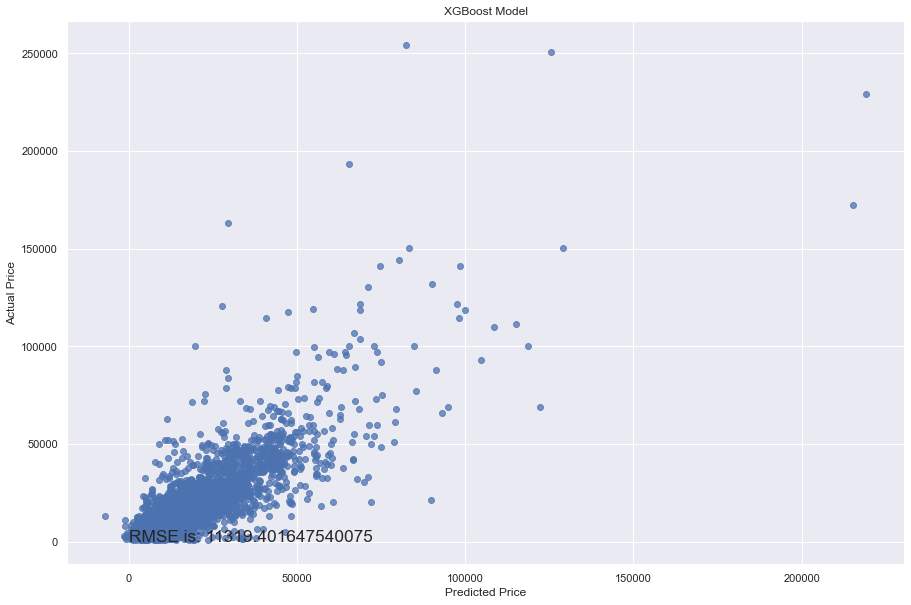

11319.401647540075


In [296]:
actual_values = y_test
plt.scatter(model_xgb.predict(X_test), actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('XGBoost Model')
overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(y_test, model_xgb.predict(X_test))))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()
print(sqrt(mean_squared_error(y_test, model_xgb.predict(X_test))))

In [297]:
score=[]
rmse=[]
r2=[]

model_gb = GradientBoostingRegressor()
model_gb= model_gb.fit(X_train,y_train)
score.append(model_gb.score(X_test,y_test))
rmse.append(np.sqrt(mean_squared_error(y_test,model_gb.predict(X_test))))
r2.append(r2_score(y_test,model_gb.predict(X_test)))
    
print('Score:{}, Rmse:{}, R2: {}'.format(np.mean(score),np.mean(rmse),np.mean(r2)))

Score:0.6026610957748295, Rmse:12152.88683492188, R2: 0.6026610957748295


<ipython-input-298-029f9d7b6192>:8: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


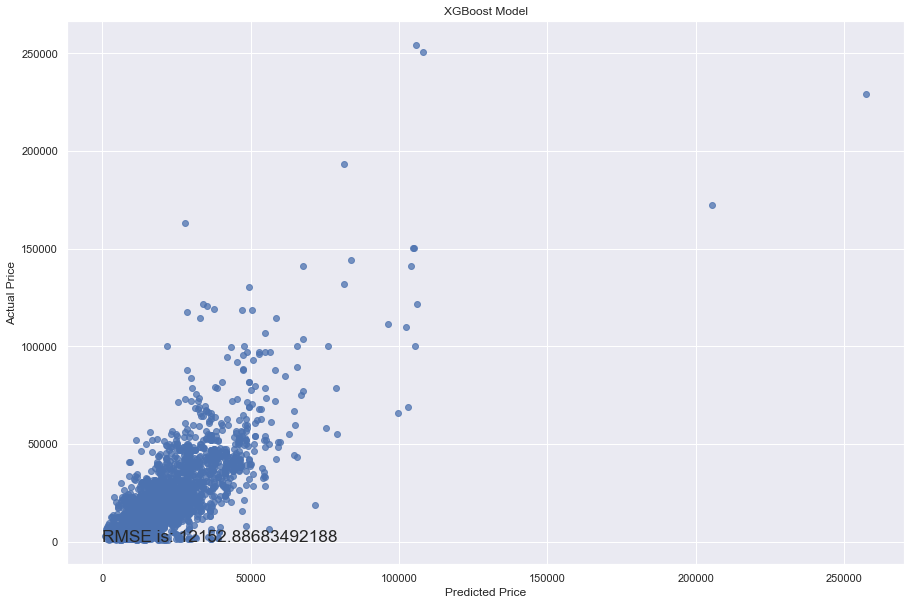

12152.88683492188


In [298]:
actual_values = y_test
plt.scatter(model_gb.predict(X_test), actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('XGBoost Model')
overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(y_test, model_gb.predict(X_test))))
plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
plt.show()
print(sqrt(mean_squared_error(y_test, model_gb.predict(X_test))))

In [303]:
n_folds = 5

def rmsle_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(train.values)
    rmse= np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)

In [ ]:
lasso = make_pipeline(RobustScaler(), Lasso(alpha =0.0005, random_state=1))
ENet = make_pipeline(RobustScaler(), ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3))
KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)
GBoost = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)
model_xgb = xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                              nthread = -1)
rf= RandomForestRegressor(n_estimators=300,max_depth=4,min_samples_leaf=5,min_samples_split=10)

In [308]:
lasso = make_pipeline(RobustScaler(), Lasso(alpha =0.0005, random_state=1))

In [304]:
ENet = make_pipeline(RobustScaler(), ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3))

In [305]:
KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)

In [306]:
GBoost = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)

In [307]:
model_xgb = xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                              nthread = -1)

In [309]:
rf= RandomForestRegressor(n_estimators=300,max_depth=4,min_samples_leaf=5,min_samples_split=10)

In [316]:
def score(model, X_train, y_train, y_test):
    model = model.fit(X_train,y_train)
    score = model.score(X_test,y_test)
    rmse = (np.sqrt(mean_squared_error(y_test,model.predict(X_test))))
    r2 = r2_score(y_test,model.predict(X_test))
    
    return(print('Score:{}, Rmse:{}, R2: {}'.format(np.mean(score),np.mean(rmse),np.mean(r2))))

In [353]:
def performance(model, train1, train2, test1, test2):
    
    model = model.fit(train1,train2)
    score = model.score(test1,test2)
    rmse = (np.sqrt(mean_squared_error(test2,model.predict(test1))))
    r2 = r2_score(test2,model.predict(test1))
    
    actual_values = test2
    plot = plt.scatter(model.predict(test1), actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
    plt.xlabel('Predicted Price')
    plt.ylabel('Actual Price')
    plt.title(model)
    overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(test2, model.predict(test1))))
    plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
    plt.show()
    
    return(plot, rmse, r2, score)

<ipython-input-344-5a4d4e71d7f4>:9: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


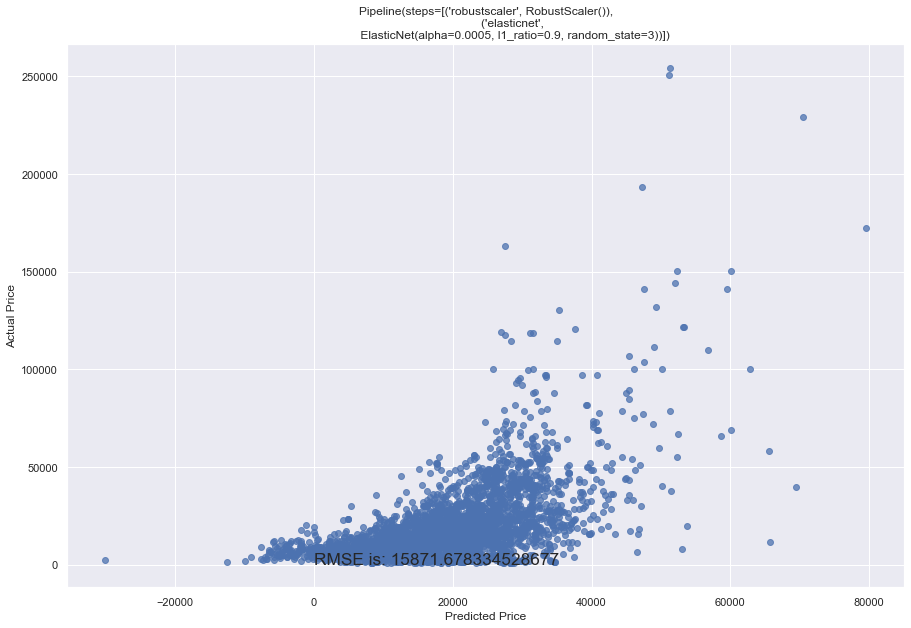

(<matplotlib.collections.PathCollection at 0x7fbe32926370>,
 15871.678334528677,
 0.3222837666162057,
 0.3222837666162057)

In [348]:
# Elastic Net

performance(ENet, X_train, y_train, X_test, y_test)

<ipython-input-344-5a4d4e71d7f4>:9: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


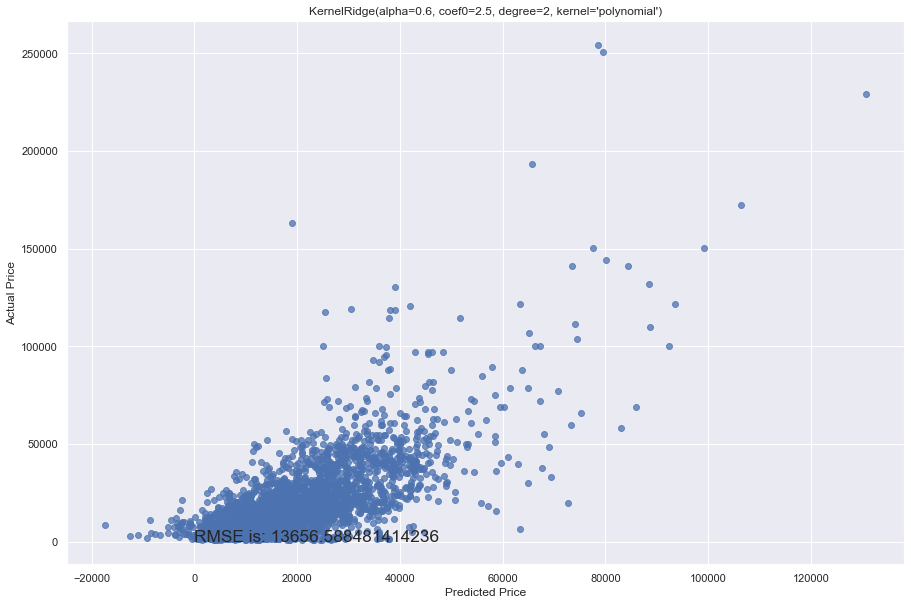

(<matplotlib.collections.PathCollection at 0x7fbf87c04730>,
 13656.588481414236,
 0.49825087042663596,
 0.49825087042663596)

In [350]:
# Kernel ridge regression

performance(KRR, X_train, y_train, X_test, y_test)

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


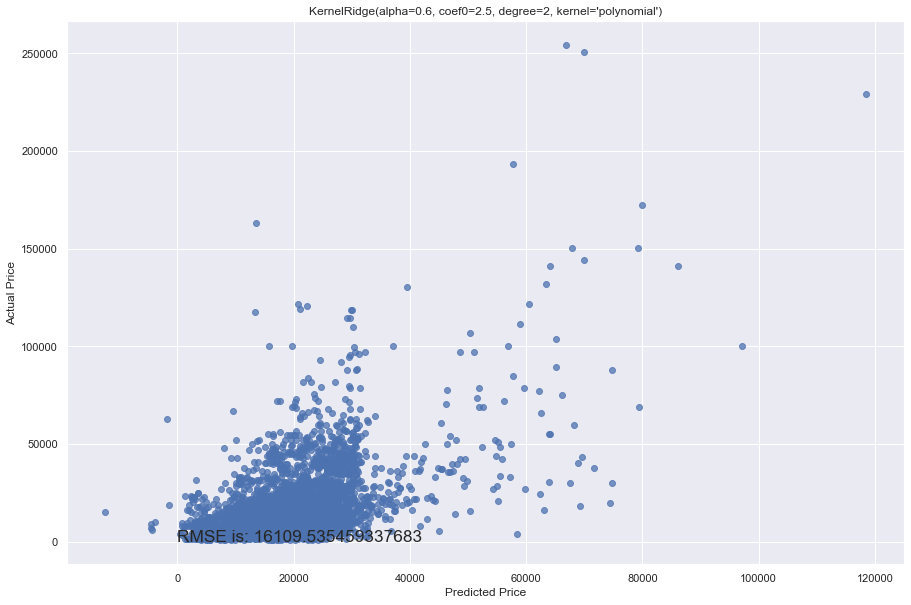

(<matplotlib.collections.PathCollection at 0x7fbf6d0288e0>,
 16109.535459337683,
 0.30181869402083783,
 0.30181869402083783)

In [358]:
# kernal ridge regression - feature selection

performance(KRR, X_train_fs, y_train_fs, X_test_fs, y_test_fs)

<ipython-input-344-5a4d4e71d7f4>:9: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


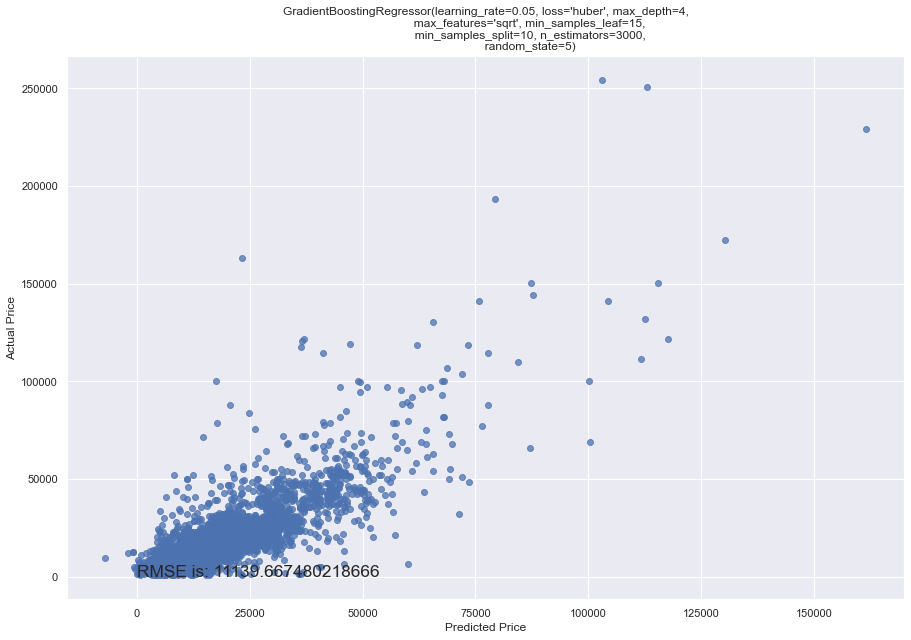

(<matplotlib.collections.PathCollection at 0x7fbf87c3abb0>,
 11139.667480218666,
 0.6661536467152069,
 0.6661536467152069)

In [352]:
# Gradient boost

performance(GBoost, X_train, y_train, X_test, y_test)

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


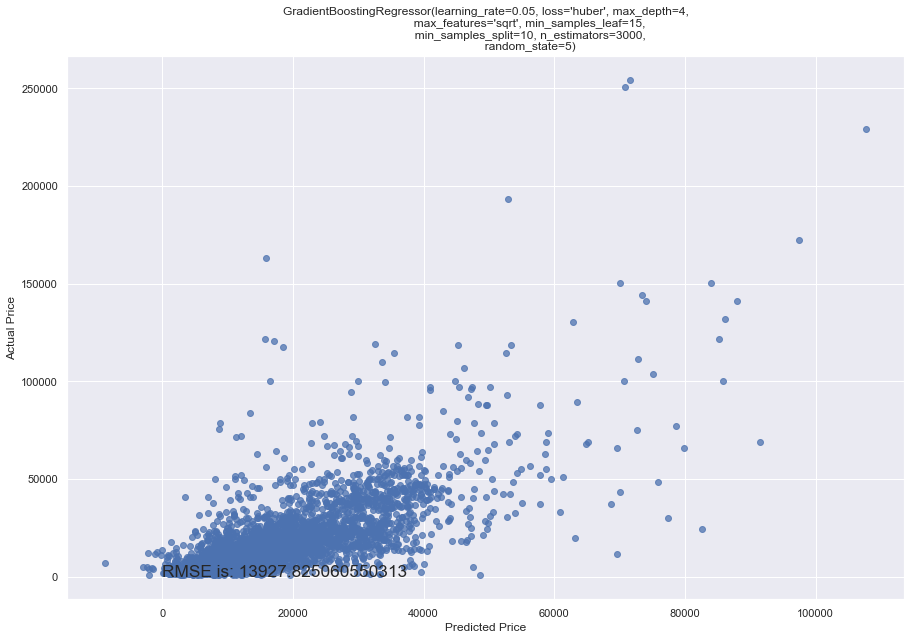

(<matplotlib.collections.PathCollection at 0x7fbf6e329c70>,
 13927.825060550313,
 0.4781222414163485,
 0.4781222414163485)

In [356]:
# Gradient boost - feature selection

performance(GBoost, X_train_fs, y_train_fs, X_test_fs, y_test_fs)

[02:29:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


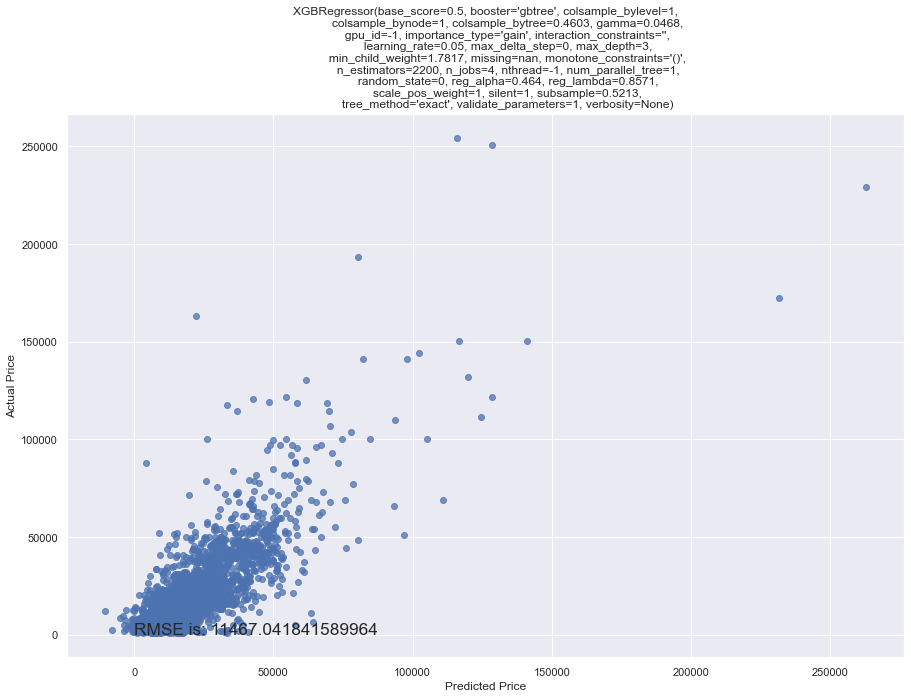

(<matplotlib.collections.PathCollection at 0x7fbf57c31eb0>,
 11467.041841589964,
 0.6462430536443016,
 0.6462430536443016)

In [354]:
# XGB

performance(model_xgb, X_train, y_train, X_test, y_test)

[02:31:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


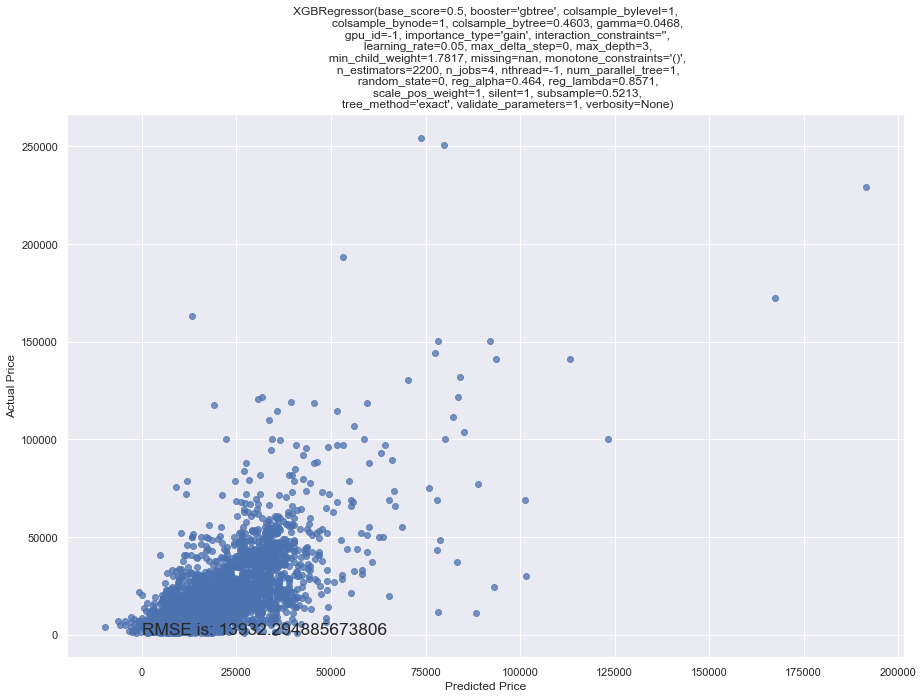

(<matplotlib.collections.PathCollection at 0x7fbf5843f1f0>,
 13932.294885673806,
 0.47778721758872544,
 0.47778721758872544)

In [355]:
# XGB - feature selection

performance(model_xgb, X_train_fs, y_train_fs, X_test_fs, y_test_fs)

Score:0.4763902669193294, Rmse:13950.917304263516, R2: 0.4763902669193294
None


<ipython-input-318-ae45958086b0>:9: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


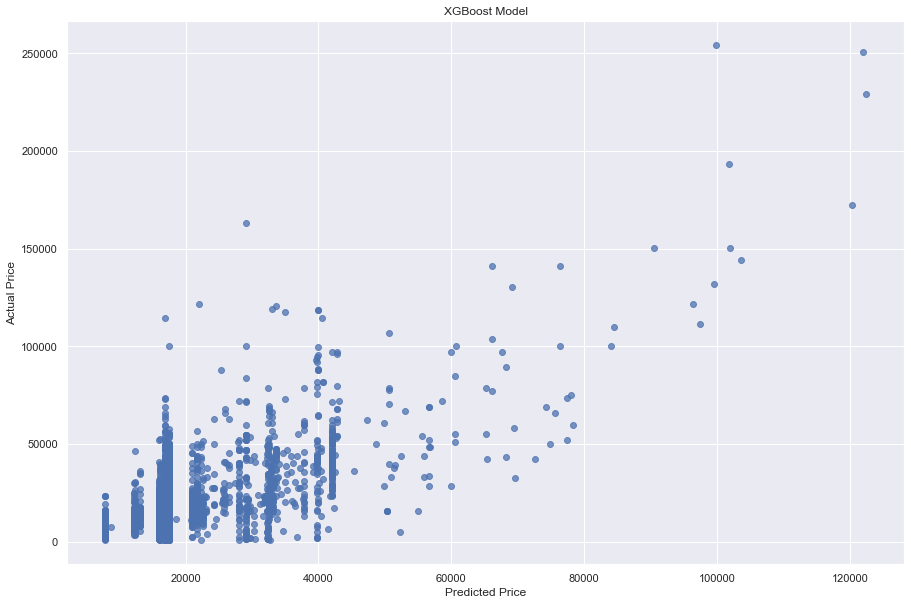

13950.917304263516


(<matplotlib.collections.PathCollection at 0x7fbe92699910>, None)

In [328]:
#print(score(rf, X_train, y_train, y_test))
#plot(rf, X_test, y_test)

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


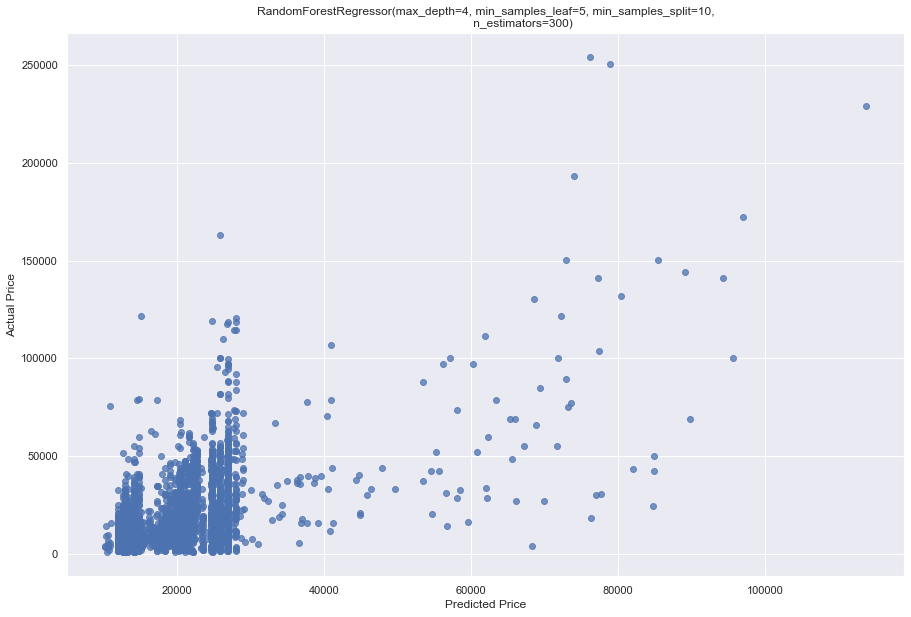

(<matplotlib.collections.PathCollection at 0x7fbf6e336940>,
 15831.469667697938,
 0.32571321478840587,
 0.32571321478840587)

In [359]:
# random forest - feature selection

performance(rf, X_train_fs, y_train_fs, X_test_fs, y_test_fs)

In [311]:
class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    #Now we do the predictions for cloned models and average them
    def predict(self, X):
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1)

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


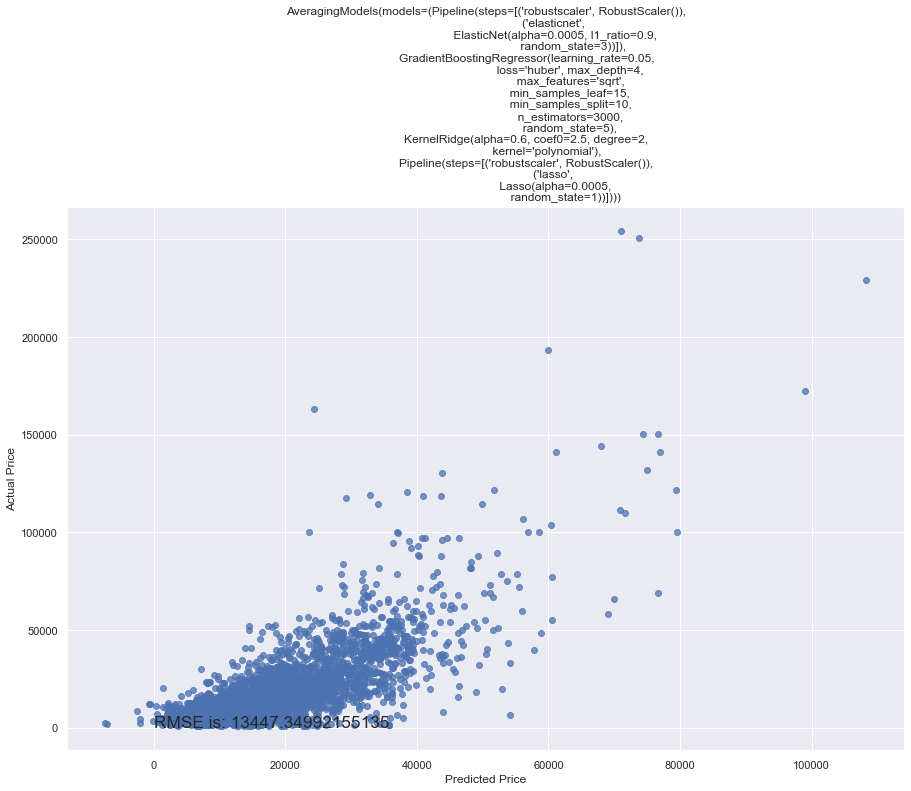

(<matplotlib.collections.PathCollection at 0x7fbe9275eac0>,
 13447.34992155135,
 0.5135081219522142,
 0.5135081219522142)

In [361]:
# ensemble models - averaging

averaged__models = AveragingModels(ENet, GBoost, KRR)
performance(averaged_models, X_train, y_train, X_test, y_test)

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


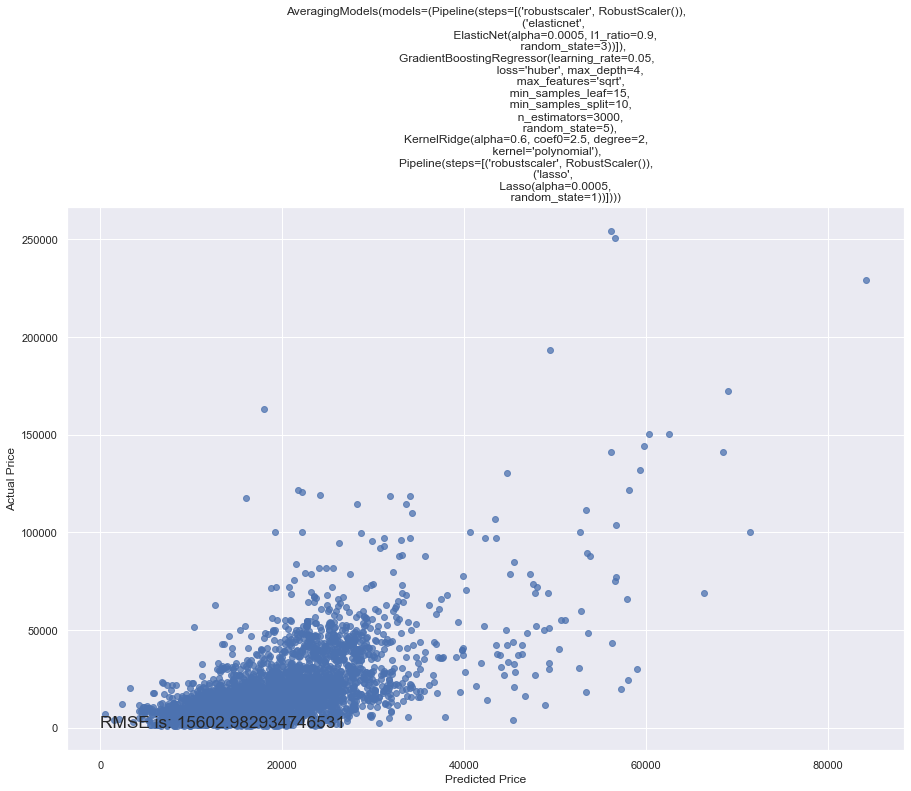

(<matplotlib.collections.PathCollection at 0x7fbe92575a00>,
 15602.982934746531,
 0.34503597088092175,
 0.34503597088092175)

In [360]:
performance(averaged_models, X_train_fs, y_train_fs, X_test_fs, y_test_fs)

In [ ]:
lasso = make_pipeline(RobustScaler(), Lasso(alpha =0.0005, random_state=1))
ENet = make_pipeline(RobustScaler(), ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3))
KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)
GBoost = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)
model_xgb = xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                              nthread = -1)
rf= RandomForestRegressor(n_estimators=300,max_depth=4,min_samples_leaf=5,min_samples_split=10)

In [368]:
from sklearn.ensemble import StackingRegressor
# ensemble model - stacking 


def get_stacking():
    # define the base models
    level0 = list()
    level0.append(('ENet', ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3)))
    level0.append(('GBoost', GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)))
    level0.append(('KRR', KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)))
    # define meta learner model
    level1 = Lasso(alpha =0.0005, random_state=1)
    # define the stacking ensemble
    model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5)
    return model

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


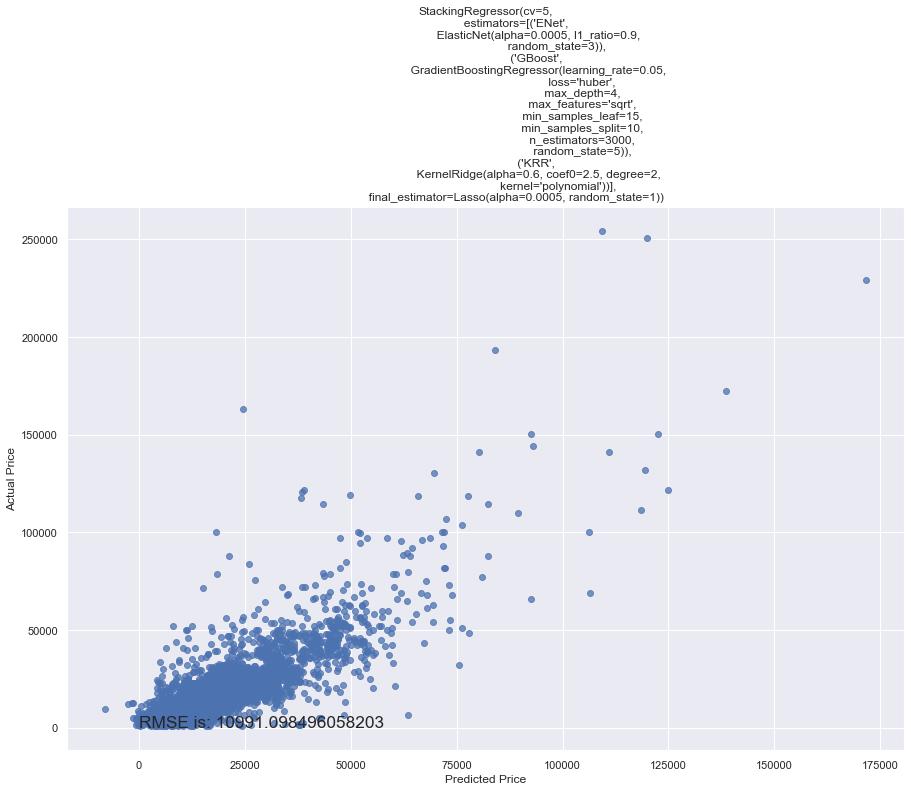

(<matplotlib.collections.PathCollection at 0x7fbdd3afaa30>,
 10991.098496058203,
 0.6749992362265986,
 0.6749992362265986)

In [369]:
performance(get_stacking(), X_train, y_train, X_test, y_test)

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


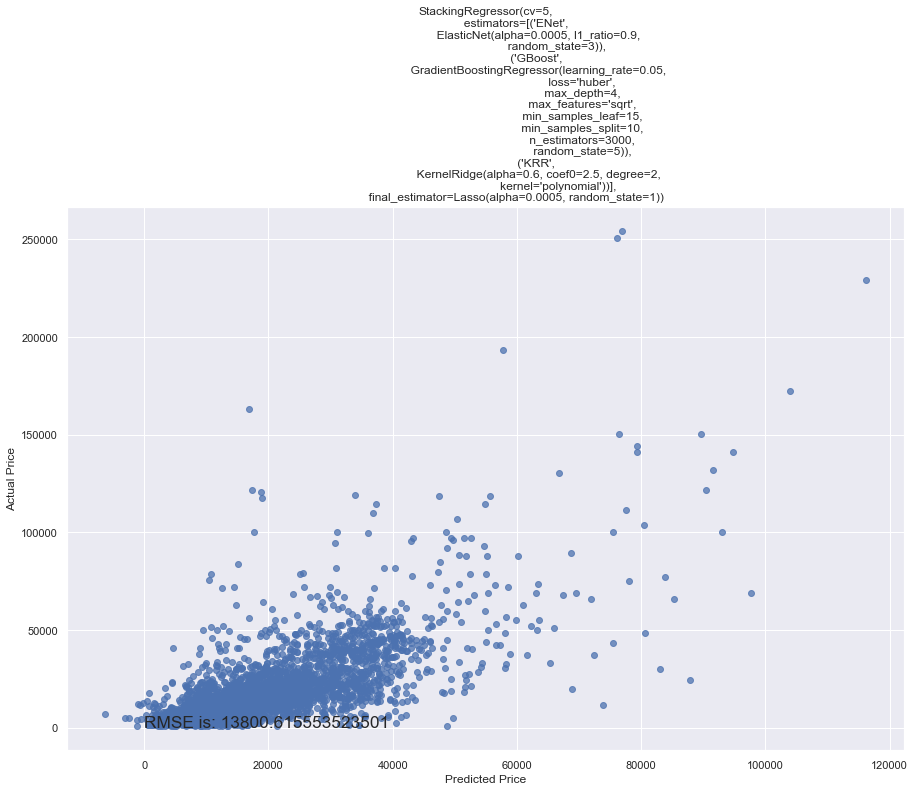

(<matplotlib.collections.PathCollection at 0x7fbdd3e07f10>,
 13800.615553523501,
 0.48761182593410013,
 0.48761182593410013)

In [370]:
performance(get_stacking(), X_train_fs, y_train_fs, X_test_fs, y_test_fs)

In [385]:
def get_stacking2():
    # define the base models
    level0 = list()
    level0.append(('ENet', ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3)))
    level0.append(('GBoost', GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)))
    level0.append(('KRR', KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)))
    level0.append(('xgb', xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                              nthread = -1)))
    # define meta learner model
    level1 = Lasso(alpha =0.0005, random_state=1)
    # define the stacking ensemble
    model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5)
    return model

[03:14:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:16:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:16:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/wor

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


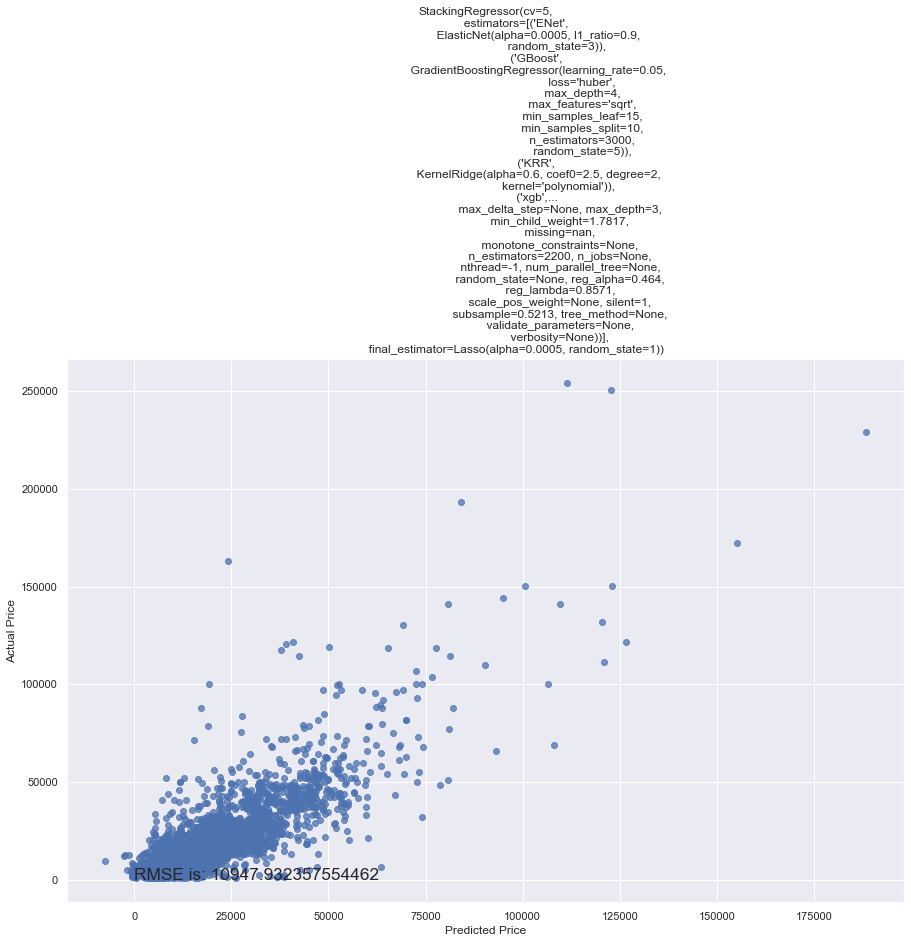

(<matplotlib.collections.PathCollection at 0x7fbdd3286760>,
 10947.932357554462,
 0.6775470214872255,
 0.6775470214872255)

In [386]:
performance(get_stacking2(), X_train, y_train, X_test, y_test)

In [390]:
def get_stacking3():
    # define the base models
    level0 = list()
    level0.append(('ENet', ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3)))
    level0.append(('GBoost', GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)))
    level0.append(('KRR', KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)))
    level0.append(('xgb', xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                              nthread = -1)))
    level0.append(('rf', RandomForestRegressor(n_estimators=300,max_depth=4,min_samples_leaf=5,min_samples_split=10)))
    # define meta learner model
    level1 = Lasso(alpha =0.0005, random_state=1)
    # define the stacking ensemble
    model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5)
    return model

[03:19:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:22:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:22:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/wor

<ipython-input-353-40b4dced6f11>:15: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')


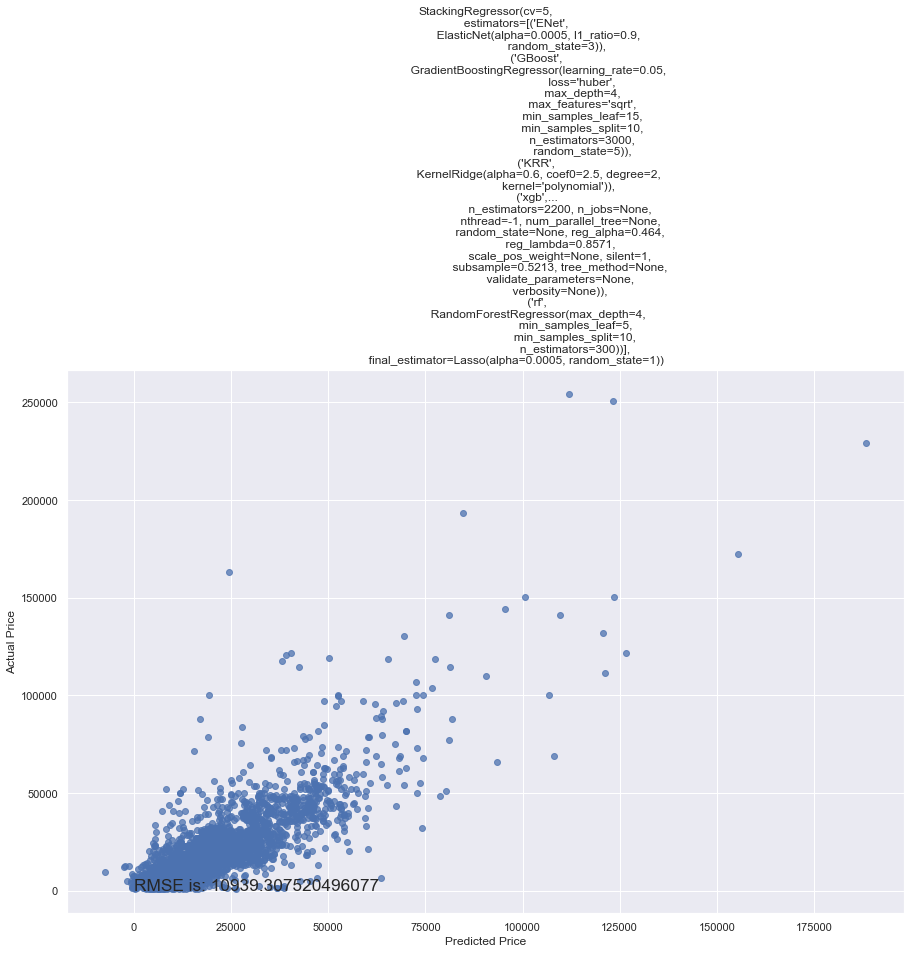

(<matplotlib.collections.PathCollection at 0x7fbdd3aacf40>,
 10939.307520496077,
 0.6780548815696121,
 0.6780548815696121)

In [391]:
# final model 1

performance(get_stacking3(), X_train, y_train, X_test, y_test)

In [393]:
from scipy.stats import boxcox
# Box cox transformation


p = boxcox(train5.Price,0.2)
p

array([28.41357937, 29.92218705, 25.51517861, ..., 29.51793092,
       33.22299601, 22.81837395])

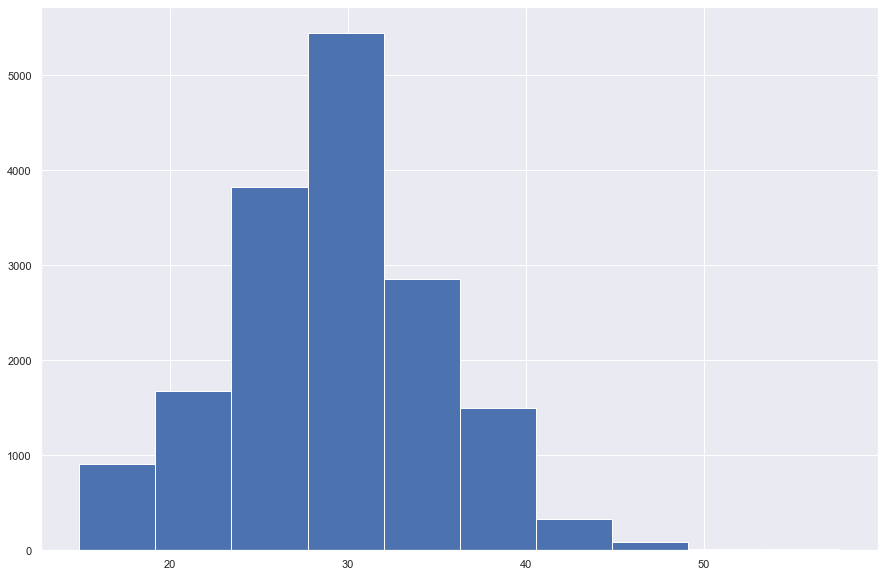

In [395]:
plt.hist(p)
plt.show()

In [396]:
train5['boxcoxprice'] = p

In [398]:
X = train5.iloc[:, : -2]
y = train5.iloc[:, -1]

0        28.413579
1        29.922187
2        25.515179
3        20.727598
4        27.568667
           ...    
19231    23.293427
19232    25.515179
19233    29.517931
19234    33.222996
19235    22.818374
Name: boxcoxprice, Length: 16651, dtype: float64

In [399]:
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(X, y, test_size=0.2, random_state=1)

In [404]:
def performance_b(model, train1, train2, test1, test2):
    
    model = model.fit(train1,train2)
    score = model.score(test1,test2)
    pred = model.predict(test1)
    Lambda=0.2
    Y=np.exp(np.log(Lambda*pred+1)/Lambda)
    rmse_b = (np.sqrt(mean_squared_error(test2, pred)))
    rmse_bc = (np.sqrt(mean_squared_error(test2, Y)))
    r2_b = r2_score(test2, pred)
    r2_bc = r2_score(test2, Y)
    
    actual_values = test2
    plot_b = plt.scatter(pred, actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
    plot_bc = plt.scatter(Y, actual_values, alpha=.75, color='g')
    plt.xlabel('Predicted Price')
    plt.ylabel('Actual Price')
    plt.title(model)
    #overlay = 'RMSE is: {}'.format(sqrt(mean_squared_error(test2, model.predict(test1))))
    #plt.annotate(s=overlay,xy=(12.1,10.6),size='x-large')
    plt.show()
    
    return(plot_b, rmse_b, r2_b, score, plot_bc, rmse_bc, r2_bc)

In [405]:
performance_b(get_stacking3(), X_train, y_train, X_test, y_test)

[03:46:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:49:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:49:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/wor

<ipython-input-404-50bdd12fa376>:7: RuntimeWarning: invalid value encountered in log
  Y=np.exp(np.log(Lambda*pred+1)/Lambda)


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [408]:
# final model 2

m_bs = get_stacking3().fit(X_train, y_train)
pred = m_bs.predict(X_test)

[03:54:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:56:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:56:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/wor

In [409]:
pred

array([51977.26986721, 18824.1142166 ,  5368.02789706, ...,
       14721.23712233, 59702.98314237,  8513.85657177])

In [419]:
rmse_b = (np.sqrt(mean_squared_error(y_test, pred)))
rmse_b

10940.044139155076

# Test Data

In [ ]:
# test data is treated in the same lines as training data

In [69]:
test = pd.read_csv('~/Downloads/test.csv')
test

,ID,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags,Price
0,44020629,-,VOLKSWAGEN,Golf,2012,Hatchback,No,Diesel,2.0 Turbo,0 km,4,Manual,Front,02-Mar,Left wheel,Grey,10,NaN
1,45784798,-,HYUNDAI,Sonata,2012,Sedan,Yes,Petrol,2.4,26000 km,4,Tiptronic,Front,04-May,Left wheel,Grey,10,NaN
2,45800257,-,NISSAN,Tiida,2005,Sedan,No,Petrol,1.5,168000 km,4,Automatic,Front,04-May,Right-hand drive,Sky blue,8,NaN
3,45797981,975,VOLVO,XC90,2012,Jeep,Yes,Petrol,3.2,143000 km,6,Automatic,4x4,04-May,Left wheel,Blue,12,NaN
4,45814303,-,OPEL,Astra,1993,Hatchback,No,Petrol,1.6,200000 km,4,Manual,Front,04-May,Left wheel,Black,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8240,44824410,1357,FIAT,Stilo,2004,Universal,No,Petrol,1.6,164000 km,4,Manual,Front,04-May,Left wheel,Blue,6,NaN
8241,45682346,-,BMW,528 F10,2012,Sedan,Yes,Petrol,2.8 Turbo,156000 km,4,Tiptronic,Front,04-May,Left wheel,Black,6,NaN
8242,45649860,1646,LEXUS,GX 460,2015,Jeep,Yes,Petrol,4.6,102907 km,8,Automatic,4x4,04-May,Left wheel,Black,0,NaN
8243,45809706,784,TOYOTA,Aqua,2017,Hatchback,Yes,Petrol,1.5,3000 km,4,Automatic,Front,04-May,Left wheel,Green,4,NaN


In [70]:
test.isnull().sum()

ID                     0
Levy                   0
Manufacturer           0
Model                  0
Prod. year             0
Category               0
Leather interior       0
Fuel type              0
Engine volume          0
Mileage                0
Cylinders              0
Gear box type          0
Drive wheels           0
Doors                  0
Wheel                  0
Color                  0
Airbags                0
Price               8245
dtype: int64

In [71]:
for i in test.columns:
    print("Basic statistics for feature : {0}".format(i))
    print(test[i].describe())
    print("---------------------------------------------")

Basic statistics for feature : ID
count    8.245000e+03
mean     4.558331e+07
std      8.956823e+05
min      2.126522e+07
25%      4.569648e+07
50%      4.577163e+07
75%      4.580180e+07
max      4.581664e+07
Name: ID, dtype: float64
---------------------------------------------
Basic statistics for feature : Levy
count     8245
unique     434
top          -
freq      2454
Name: Levy, dtype: object
---------------------------------------------
Basic statistics for feature : Manufacturer
count        8245
unique         62
top       HYUNDAI
freq         1589
Name: Manufacturer, dtype: object
---------------------------------------------
Basic statistics for feature : Model
count       8245
unique       995
top       Sonata
freq         478
Name: Model, dtype: object
---------------------------------------------
Basic statistics for feature : Prod. year
count    8245.000000
mean     2010.911583
std         5.548762
min      1943.000000
25%      2009.000000
50%      2012.000000
75%      

In [72]:
test['Mileage']= test['Mileage'].str.replace(r'km$', '')

test['Mileage'] = test['Mileage'].astype(float)
test['Mileage_2']=pd.qcut(test['Mileage'], q=20)

test['Mileage_2'].value_counts()

<ipython-input-72-f1a73a491ed2>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  test['Mileage']= test['Mileage'].str.replace(r'km$', '')


(138838.0, 150000.0]        461
(97541.6, 108000.0]         418
(-0.001, 2417.0]            413
(177841.2, 192000.0]        413
(2417.0, 27200.0]           413
(117999.2, 127675.0]        413
(127675.0, 138838.0]        413
(44228.6, 58000.0]          413
(326498.6, 2147483647.0]    413
(84442.8, 97541.6]          412
(71551.0, 84442.8]          412
(58000.0, 71551.0]          412
(162980.8, 177841.2]        412
(192000.0, 210325.8]        412
(210325.8, 234586.0]        412
(234586.0, 268133.8]        412
(268133.8, 326498.6]        412
(27200.0, 44228.6]          411
(108000.0, 117999.2]        406
(150000.0, 162980.8]        362
Name: Mileage_2, dtype: int64

In [73]:
bin_labels = ['0', '1', '2', '3', '4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19']
test['Mileage_3'] = pd.qcut(test['Mileage'],
                              q=[0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5,
                                 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1],
                              labels=bin_labels)
test['Mileage_3']

0        0
1        1
2       13
3       11
4       15
        ..
8240    13
8241    12
8242     7
8243     1
8244    18
Name: Mileage_3, Length: 8245, dtype: category
Categories (20, object): ['0' < '1' < '2' < '3' ... '16' < '17' < '18' < '19']

In [74]:
cut_labels_air = [0,1,2,3,4,5]
cut_bins_air = [0, 1, 3, 5, 10, 13, 20]
test['Airbags_2'] = pd.cut(test['Airbags'], bins=cut_bins_air, labels=cut_labels_air, precision=1)
test[['Airbags', 'Airbags_2']]

,Airbags,Airbags_2
0,10,3
1,10,3
2,8,3
3,12,4
4,0,NaN
...,...,...
8240,6,3
8241,6,3
8242,0,NaN
8243,4,2


In [75]:
test['Airbags_2'].value_counts()

2    2474
4    2402
3    1691
1     491
5      53
0      36
Name: Airbags_2, dtype: int64

In [76]:
test['Airbags_2'] = test['Airbags_2'].fillna (0)

In [77]:
test['Airbags_2'].value_counts()

2    2474
4    2402
3    1691
0    1134
1     491
5      53
Name: Airbags_2, dtype: int64

In [78]:
cut_labels_cyl = [0,1,2,3,4,5,6]
cut_bins_cyl = [0, 1, 3, 6, 8, 10, 14, 20]
test['Cylinders_2'] = pd.cut(test['Cylinders'], bins=cut_bins_cyl, labels=cut_labels_cyl, precision=1)
test[['Cylinders', 'Cylinders_2']]

,Cylinders,Cylinders_2
0,4,2
1,4,2
2,4,2
3,6,2
4,4,2
...,...,...
8240,4,2
8241,4,2
8242,8,3
8243,4,2


In [79]:
test['Cylinders_2'].value_counts()

2    7656
3     478
1      71
5      17
0      14
4       7
6       1
Name: Cylinders_2, dtype: int64

In [80]:
test['Cylinders_2'] = test['Cylinders_2'].fillna (0)
test['Cylinders_2'].value_counts()

2    7656
3     478
1      71
5      17
0      15
4       7
6       1
Name: Cylinders_2, dtype: int64

In [81]:
cut_labels_pdy = [0,1,2,3,4,5,6,7]
cut_bins_pdy = [1930, 1970, 1980, 1990, 2000, 2005, 2010, 2015, 2021]
test['Prod. year_2'] = pd.cut(test['Prod. year'], bins=cut_bins_pdy, labels=cut_labels_pdy, precision=1)
test[['Prod. year', 'Prod. year_2']]

,Prod. year,Prod. year_2
0,2012,6
1,2012,6
2,2005,4
3,2012,6
4,1993,3
...,...,...
8240,2004,4
8241,2012,6
8242,2015,6
8243,2017,7


In [82]:
test['Prod. year_2'].value_counts()

6    4095
5    1530
7    1366
4     721
3     500
2      25
0       6
1       2
Name: Prod. year_2, dtype: int64

In [83]:
test['Prod. year_2'] = test['Prod. year_2'].fillna (0)
test['Prod. year_2'].value_counts()

6    4095
5    1530
7    1366
4     721
3     500
2      25
0       6
1       2
Name: Prod. year_2, dtype: int64

In [84]:
test['Engine_volume'] = test['Engine volume']
test1 = test[test.Engine_volume.str.contains('Turbo',case=False)]
test1

,ID,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,...,Wheel,Color,Airbags,Price,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume
0,44020629,-,VOLKSWAGEN,Golf,2012,Hatchback,No,Diesel,2.0 Turbo,0.0,...,Left wheel,Grey,10,NaN,"(-0.001, 2417.0]",0,3,2,6,2.0 Turbo
5,45812490,639,BMW,320,2014,Sedan,Yes,Petrol,2.0 Turbo,59733.0,...,Left wheel,Black,12,NaN,"(58000.0, 71551.0]",4,4,2,6,2.0 Turbo
17,45804934,696,MERCEDES-BENZ,E 220,2013,Sedan,Yes,Diesel,2.2 Turbo,186000.0,...,Left wheel,Black,12,NaN,"(177841.2, 192000.0]",14,4,2,6,2.2 Turbo
21,45776797,-,MERCEDES-BENZ,GLA 250 4Matic,2015,Jeep,Yes,Petrol,2.0 Turbo,65000.0,...,Left wheel,Black,12,NaN,"(58000.0, 71551.0]",4,4,2,6,2.0 Turbo
26,45766845,-,FORD,Mustang,2015,Coupe,Yes,Petrol,2.3 Turbo,113600.0,...,Left wheel,Silver,6,NaN,"(108000.0, 117999.2]",8,3,2,6,2.3 Turbo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8140,45744687,738,CHEVROLET,Cruze,2017,Sedan,No,Petrol,1.4 Turbo,81000.0,...,Left wheel,Red,10,NaN,"(71551.0, 84442.8]",5,3,2,7,1.4 Turbo
8181,45777706,784,CHEVROLET,Malibu,2017,Sedan,No,Petrol,1.5 Turbo,74506.0,...,Left wheel,Black,8,NaN,"(71551.0, 84442.8]",5,3,2,7,1.5 Turbo
8183,45764678,562,CHEVROLET,Cruze,2015,Sedan,Yes,Petrol,1.4 Turbo,77600.0,...,Left wheel,Black,12,NaN,"(71551.0, 84442.8]",5,4,2,6,1.4 Turbo
8221,45427389,640,VOLKSWAGEN,Jetta TDI,2013,Sedan,Yes,Diesel,2.0 Turbo,136000.0,...,Left wheel,Grey,8,NaN,"(127675.0, 138838.0]",10,3,2,6,2.0 Turbo


In [85]:
test2 = test[~test.Engine_volume.str.contains('Turbo',case=False)]
test2

,ID,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,...,Wheel,Color,Airbags,Price,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume
1,45784798,-,HYUNDAI,Sonata,2012,Sedan,Yes,Petrol,2.4,26000.0,...,Left wheel,Grey,10,NaN,"(2417.0, 27200.0]",1,3,2,6,2.4
2,45800257,-,NISSAN,Tiida,2005,Sedan,No,Petrol,1.5,168000.0,...,Right-hand drive,Sky blue,8,NaN,"(162980.8, 177841.2]",13,3,2,4,1.5
3,45797981,975,VOLVO,XC90,2012,Jeep,Yes,Petrol,3.2,143000.0,...,Left wheel,Blue,12,NaN,"(138838.0, 150000.0]",11,4,2,6,3.2
4,45814303,-,OPEL,Astra,1993,Hatchback,No,Petrol,1.6,200000.0,...,Left wheel,Black,0,NaN,"(192000.0, 210325.8]",15,0,2,3,1.6
6,45772399,1646,LEXUS,GX 460,2015,Jeep,Yes,Petrol,4.6,102907.0,...,Left wheel,Black,0,NaN,"(97541.6, 108000.0]",7,0,3,6,4.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8239,45787008,645,TOYOTA,Prius,2011,Sedan,Yes,Petrol,1.8,283000.0,...,Left wheel,White,4,NaN,"(268133.8, 326498.6]",18,2,2,6,1.8
8240,44824410,1357,FIAT,Stilo,2004,Universal,No,Petrol,1.6,164000.0,...,Left wheel,Blue,6,NaN,"(162980.8, 177841.2]",13,3,2,4,1.6
8242,45649860,1646,LEXUS,GX 460,2015,Jeep,Yes,Petrol,4.6,102907.0,...,Left wheel,Black,0,NaN,"(97541.6, 108000.0]",7,0,3,6,4.6
8243,45809706,784,TOYOTA,Aqua,2017,Hatchback,Yes,Petrol,1.5,3000.0,...,Left wheel,Green,4,NaN,"(2417.0, 27200.0]",1,2,2,7,1.5


In [86]:
cut_labels_ev = [1,2,3,4,5,6,7,8]
cut_bins_ev = [0,0.9,1.9,2.9,3.9,4.9,5.9,6.9,7.9]
test2['Engine_volume_2'] = pd.cut(test2['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)
test2[['Engine_volume', 'Engine_volume_2']]

<ipython-input-86-0cae8c40af3d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2['Engine_volume_2'] = pd.cut(test2['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)


,Engine_volume,Engine_volume_2
1,2.4,3
2,1.5,2
3,3.2,4
4,1.6,2
6,4.6,5
...,...,...
8239,1.8,2
8240,1.6,2
8242,4.6,5
8243,1.5,2


In [87]:
test2['Engine_volume_2'].value_counts()

3    3288
2    2453
4    1176
5     331
6     106
1      33
7      24
8       0
Name: Engine_volume_2, dtype: int64

In [88]:
test1['Engine_volume'] = test1['Engine_volume'].str.replace(r' Turbo$', '')
test1

<ipython-input-88-7420c5812ae8>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  test1['Engine_volume'] = test1['Engine_volume'].str.replace(r' Turbo$', '')
<ipython-input-88-7420c5812ae8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['Engine_volume'] = test1['Engine_volume'].str.replace(r' Turbo$', '')


,ID,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,...,Wheel,Color,Airbags,Price,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume
0,44020629,-,VOLKSWAGEN,Golf,2012,Hatchback,No,Diesel,2.0 Turbo,0.0,...,Left wheel,Grey,10,NaN,"(-0.001, 2417.0]",0,3,2,6,2.0
5,45812490,639,BMW,320,2014,Sedan,Yes,Petrol,2.0 Turbo,59733.0,...,Left wheel,Black,12,NaN,"(58000.0, 71551.0]",4,4,2,6,2.0
17,45804934,696,MERCEDES-BENZ,E 220,2013,Sedan,Yes,Diesel,2.2 Turbo,186000.0,...,Left wheel,Black,12,NaN,"(177841.2, 192000.0]",14,4,2,6,2.2
21,45776797,-,MERCEDES-BENZ,GLA 250 4Matic,2015,Jeep,Yes,Petrol,2.0 Turbo,65000.0,...,Left wheel,Black,12,NaN,"(58000.0, 71551.0]",4,4,2,6,2.0
26,45766845,-,FORD,Mustang,2015,Coupe,Yes,Petrol,2.3 Turbo,113600.0,...,Left wheel,Silver,6,NaN,"(108000.0, 117999.2]",8,3,2,6,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8140,45744687,738,CHEVROLET,Cruze,2017,Sedan,No,Petrol,1.4 Turbo,81000.0,...,Left wheel,Red,10,NaN,"(71551.0, 84442.8]",5,3,2,7,1.4
8181,45777706,784,CHEVROLET,Malibu,2017,Sedan,No,Petrol,1.5 Turbo,74506.0,...,Left wheel,Black,8,NaN,"(71551.0, 84442.8]",5,3,2,7,1.5
8183,45764678,562,CHEVROLET,Cruze,2015,Sedan,Yes,Petrol,1.4 Turbo,77600.0,...,Left wheel,Black,12,NaN,"(71551.0, 84442.8]",5,4,2,6,1.4
8221,45427389,640,VOLKSWAGEN,Jetta TDI,2013,Sedan,Yes,Diesel,2.0 Turbo,136000.0,...,Left wheel,Grey,8,NaN,"(127675.0, 138838.0]",10,3,2,6,2.0


In [89]:
cut_labels_ev = [10,20,30,40,50,60,70,80]
cut_bins_ev = [0,0.9,1.9,2.9,3.9,4.9,5.9,6.9,7.9]
test1['Engine_volume_2'] = pd.cut(test1['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)
test1[['Engine_volume', 'Engine_volume_2']]

<ipython-input-89-ac6e659fed68>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['Engine_volume_2'] = pd.cut(test1['Engine_volume'].astype(float), bins=cut_bins_ev, labels=cut_labels_ev, precision=1)


,Engine_volume,Engine_volume_2
0,2.0,30
5,2.0,30
17,2.2,30
21,2.0,30
26,2.3,30
...,...,...
8140,1.4,20
8181,1.5,20
8183,1.4,20
8221,2.0,30


In [90]:
test1['Engine_volume_2'].value_counts()

30    382
20    278
40    138
50     21
10      7
60      1
70      1
80      0
Name: Engine_volume_2, dtype: int64

In [91]:
test3 = pd.concat([test1, test2], axis=0)
test3 = test3.sort_index(axis = 0)
test3.head(30)

,ID,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,...,Color,Airbags,Price,Mileage_2,Mileage_3,Airbags_2,Cylinders_2,Prod. year_2,Engine_volume,Engine_volume_2
0,44020629,-,VOLKSWAGEN,Golf,2012,Hatchback,No,Diesel,2.0 Turbo,0.0,...,Grey,10,NaN,"(-0.001, 2417.0]",0,3,2,6,2.0,30
1,45784798,-,HYUNDAI,Sonata,2012,Sedan,Yes,Petrol,2.4,26000.0,...,Grey,10,NaN,"(2417.0, 27200.0]",1,3,2,6,2.4,3
2,45800257,-,NISSAN,Tiida,2005,Sedan,No,Petrol,1.5,168000.0,...,Sky blue,8,NaN,"(162980.8, 177841.2]",13,3,2,4,1.5,2
3,45797981,975,VOLVO,XC90,2012,Jeep,Yes,Petrol,3.2,143000.0,...,Blue,12,NaN,"(138838.0, 150000.0]",11,4,2,6,3.2,4
4,45814303,-,OPEL,Astra,1993,Hatchback,No,Petrol,1.6,200000.0,...,Black,0,NaN,"(192000.0, 210325.8]",15,0,2,3,1.6,2
5,45812490,639,BMW,320,2014,Sedan,Yes,Petrol,2.0 Turbo,59733.0,...,Black,12,NaN,"(58000.0, 71551.0]",4,4,2,6,2.0,30
6,45772399,1646,LEXUS,GX 460,2015,Jeep,Yes,Petrol,4.6,102907.0,...,Black,0,NaN,"(97541.6, 108000.0]",7,0,3,6,4.6,5
7,45766222,1172,MERCEDES-BENZ,E 350,2011,Sedan,Yes,Diesel,3.5,64496.0,...,Blue,12,NaN,"(58000.0, 71551.0]",4,4,2,6,3.5,4
8,45803362,891,HYUNDAI,Sonata,2016,Sedan,Yes,LPG,2,300234.0,...,Silver,4,NaN,"(268133.8, 326498.6]",18,2,2,7,2,3
9,45809004,645,DAEWOO,Lacetti,2011,Sedan,Yes,Petrol,1.8,170000.0,...,White,4,NaN,"(162980.8, 177841.2]",13,2,2,6,1.8,2


In [92]:
test3['Engine_volume_2'].value_counts()

3     3288
2     2453
4     1176
30     382
5      331
20     278
40     138
6      106
1       33
7       24
50      21
10       7
60       1
70       1
Name: Engine_volume_2, dtype: int64

In [93]:
test4a = test[['Category', 'Leather interior', 'Fuel type', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color']]

oe = OrdinalEncoder()
oe.fit(test4a)
test4b = oe.transform(test4a)
test4b

array([[ 3.,  0.,  1., ...,  0.,  0.,  7.],
       [ 9.,  1.,  5., ...,  1.,  0.,  7.],
       [ 9.,  0.,  5., ...,  1.,  1., 13.],
       ...,
       [ 4.,  1.,  5., ...,  1.,  0.,  1.],
       [ 3.,  1.,  5., ...,  1.,  0.,  6.],
       [ 3.,  1.,  2., ...,  1.,  0., 11.]])

In [94]:
columns = ['Category', 'Leather interior', 'Fuel type', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color']

test4 = pd.DataFrame(test4b, columns = columns)
test4

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color
0,3.0,0.0,1.0,1.0,1.0,0.0,0.0,7.0
1,9.0,1.0,5.0,2.0,1.0,1.0,0.0,7.0
2,9.0,0.0,5.0,0.0,1.0,1.0,1.0,13.0
3,4.0,1.0,5.0,0.0,0.0,1.0,0.0,2.0
4,3.0,0.0,5.0,1.0,1.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...
8240,10.0,0.0,5.0,1.0,1.0,1.0,0.0,2.0
8241,9.0,1.0,5.0,2.0,1.0,1.0,0.0,1.0
8242,4.0,1.0,5.0,0.0,0.0,1.0,0.0,1.0
8243,3.0,1.0,5.0,0.0,1.0,1.0,0.0,6.0


In [95]:
threshold = 3 
value_counts = test['Manufacturer'].value_counts() 
to_rare = value_counts[value_counts <= threshold].index
to_rare

Index(['SCION', 'ALFA ROMEO', 'CITROEN', 'სხვა', 'MERCURY', 'FERRARI', 'ZAZ',
       'MASERATI', 'GREATWALL', 'SAAB', 'ROVER', 'FOTON', 'SATURN',
       'ASTON MARTIN', 'HUMMER', 'TATA', 'MOSKVICH', 'TESLA', 'BENTLEY', 'MG'],
      dtype='object')

In [96]:
test['Manufacturer'].replace(['CITROEN', 'ALFA ROMEO', 'SCION', 'ZAZ', 'ROVER', 'MASERATI', 'MERCURY',
       'GREATWALL', 'FERRARI', 'სხვა', 'SAAB', 'BENTLEY', 'TESLA', 'HUMMER',
       'SATURN', 'FOTON', 'TATA', 'MOSKVICH', 'MG', 'ASTON MARTIN'],'Rare', inplace=True)

test['Manufacturer'].value_counts()

HYUNDAI          1589
TOYOTA           1515
MERCEDES-BENZ     907
FORD              481
CHEVROLET         451
LEXUS             451
HONDA             414
BMW               398
NISSAN            284
VOLKSWAGEN        271
SSANGYONG         202
OPEL              190
KIA               184
AUDI              120
MITSUBISHI        119
SUBARU            109
MAZDA              75
JEEP               52
FIAT               45
DAEWOO             43
DODGE              37
SUZUKI             34
Rare               34
VAZ                32
MINI               30
LAND ROVER         26
INFINITI           19
PORSCHE            16
ACURA              13
JAGUAR             12
CHRYSLER           12
RENAULT            10
SKODA               8
VOLVO               8
GMC                 7
LINCOLN             7
GAZ                 7
BUICK               7
CADILLAC            6
PEUGEOT             5
DAIHATSU            5
UAZ                 5
ISUZU               5
Name: Manufacturer, dtype: int64

In [97]:
test3['Manufacturer_2'] = test['Manufacturer']
test3['Manufacturer_2']

0       VOLKSWAGEN
1          HYUNDAI
2           NISSAN
3            VOLVO
4             OPEL
           ...    
8240          FIAT
8241           BMW
8242         LEXUS
8243        TOYOTA
8244         HONDA
Name: Manufacturer_2, Length: 8245, dtype: object

In [98]:
oe_mfg = OrdinalEncoder()

mfg = test['Manufacturer'].values.reshape(-1, 1)
oe_mfg.fit(mfg)
test3['Manufacturer_3'] = oe_mfg.transform(mfg)
test3['Manufacturer_3']

0       41.0
1       15.0
2       28.0
3       42.0
4       29.0
        ... 
8240    10.0
8241     2.0
8242    22.0
8243    38.0
8244    14.0
Name: Manufacturer_3, Length: 8245, dtype: float64

In [99]:
oe_md = OrdinalEncoder()

md = test['Model'].values.reshape(-1, 1)
oe_md.fit(md)
test3['Model_2'] = oe_md.transform(md)
test3['Model_2']

0       521.0
1       837.0
2       885.0
3       970.0
4       165.0
        ...  
8240    867.0
8241     96.0
8242    509.0
8243    156.0
8244    564.0
Name: Model_2, Length: 8245, dtype: float64

In [100]:
test5 = test4
test5['Mileage'] = test['Mileage_3']
test5['Airbags'] = test['Airbags_2']
test5['Cylinders'] = test['Cylinders_2']
test5['Prod_year'] = test['Prod. year_2']
test5['Engine_volume'] = test3['Engine_volume_2']
test5['Manufacturer'] = test3['Manufacturer_3']
test5['Model'] = test3['Model_2']
test5['Price'] = test['Price']
test5.head()

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color,Mileage,Airbags,Cylinders,Prod_year,Engine_volume,Manufacturer,Model,Price
0,3.0,0.0,1.0,1.0,1.0,0.0,0.0,7.0,0,3,2,6,30,41.0,521.0,NaN
1,9.0,1.0,5.0,2.0,1.0,1.0,0.0,7.0,1,3,2,6,3,15.0,837.0,NaN
2,9.0,0.0,5.0,0.0,1.0,1.0,1.0,13.0,13,3,2,4,2,28.0,885.0,NaN
3,4.0,1.0,5.0,0.0,0.0,1.0,0.0,2.0,11,4,2,6,4,42.0,970.0,NaN
4,3.0,0.0,5.0,1.0,1.0,1.0,0.0,1.0,15,0,2,3,2,29.0,165.0,NaN


In [101]:
test5.dtypes

Category             float64
Leather interior     float64
Fuel type            float64
Gear box type        float64
Drive wheels         float64
Doors                float64
Wheel                float64
Color                float64
Mileage             category
Airbags             category
Cylinders           category
Prod_year           category
Engine_volume         object
Manufacturer         float64
Model                float64
Price                float64
dtype: object

In [102]:
test5['Mileage'] = test5['Mileage'].astype(float)
test5['Airbags'] = test5['Airbags'].astype(float)
test5['Cylinders'] = test5['Cylinders'].astype(float)
test5['Prod_year'] = test5['Prod_year'].astype(float)
test5['Engine_volume'] = test5['Engine_volume'].astype(float)


In [103]:
test5.dtypes

Category            float64
Leather interior    float64
Fuel type           float64
Gear box type       float64
Drive wheels        float64
Doors               float64
Wheel               float64
Color               float64
Mileage             float64
Airbags             float64
Cylinders           float64
Prod_year           float64
Engine_volume       float64
Manufacturer        float64
Model               float64
Price               float64
dtype: object

In [104]:
test5 = test5.iloc[:, : -1]
test5.head

<bound method NDFrame.head of       Category  Leather interior  Fuel type  Gear box type  Drive wheels  \
0          3.0               0.0        1.0            1.0           1.0   
1          9.0               1.0        5.0            2.0           1.0   
2          9.0               0.0        5.0            0.0           1.0   
3          4.0               1.0        5.0            0.0           0.0   
4          3.0               0.0        5.0            1.0           1.0   
...        ...               ...        ...            ...           ...   
8240      10.0               0.0        5.0            1.0           1.0   
8241       9.0               1.0        5.0            2.0           1.0   
8242       4.0               1.0        5.0            0.0           0.0   
8243       3.0               1.0        5.0            0.0           1.0   
8244       3.0               1.0        2.0            0.0           1.0   

      Doors  Wheel  Color  Mileage  Airbags  Cylinders  P

In [105]:
print(np.any(np.isfinite(test5)))
print(np.any(np.isnan(test5)))

True
True


In [106]:
test5.replace([np.inf, -np.inf], np.nan, inplace=True)

In [107]:
test5.fillna(value=0, inplace=True)
test5

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color,Mileage,Airbags,Cylinders,Prod_year,Engine_volume,Manufacturer,Model
0,3.0,0.0,1.0,1.0,1.0,0.0,0.0,7.0,0.0,3.0,2.0,6.0,30.0,41.0,521.0
1,9.0,1.0,5.0,2.0,1.0,1.0,0.0,7.0,1.0,3.0,2.0,6.0,3.0,15.0,837.0
2,9.0,0.0,5.0,0.0,1.0,1.0,1.0,13.0,13.0,3.0,2.0,4.0,2.0,28.0,885.0
3,4.0,1.0,5.0,0.0,0.0,1.0,0.0,2.0,11.0,4.0,2.0,6.0,4.0,42.0,970.0
4,3.0,0.0,5.0,1.0,1.0,1.0,0.0,1.0,15.0,0.0,2.0,3.0,2.0,29.0,165.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8240,10.0,0.0,5.0,1.0,1.0,1.0,0.0,2.0,13.0,3.0,2.0,4.0,2.0,10.0,867.0
8241,9.0,1.0,5.0,2.0,1.0,1.0,0.0,1.0,12.0,3.0,2.0,6.0,30.0,2.0,96.0
8242,4.0,1.0,5.0,0.0,0.0,1.0,0.0,1.0,7.0,0.0,3.0,6.0,5.0,22.0,509.0
8243,3.0,1.0,5.0,0.0,1.0,1.0,0.0,6.0,1.0,2.0,2.0,7.0,2.0,38.0,156.0


In [108]:
print(np.any(np.isfinite(test5)))
print(np.any(np.isnan(test5)))

True
False


In [109]:
test5.to_csv('~/Downloads/test5.csv')

#  Predicting on Test data set

In [442]:
X = train5.iloc[:, : -2]
y = train5['Price']


In [443]:
#final model 1

m_f = get_stacking3().fit(X, y)

[05:14:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:17:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:18:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/wor

In [446]:
test = pd.read_csv('~/Downloads/test5.csv')
test = test.iloc[:, 1: ]
test

,Category,Leather interior,Fuel type,Gear box type,Drive wheels,Doors,Wheel,Color,Mileage,Airbags,Cylinders,Prod_year,Engine_volume,Manufacturer,Model
0,3.0,0.0,1.0,1.0,1.0,0.0,0.0,7.0,0.0,3.0,2.0,6.0,30.0,41.0,521.0
1,9.0,1.0,5.0,2.0,1.0,1.0,0.0,7.0,1.0,3.0,2.0,6.0,3.0,15.0,837.0
2,9.0,0.0,5.0,0.0,1.0,1.0,1.0,13.0,13.0,3.0,2.0,4.0,2.0,28.0,885.0
3,4.0,1.0,5.0,0.0,0.0,1.0,0.0,2.0,11.0,4.0,2.0,6.0,4.0,42.0,970.0
4,3.0,0.0,5.0,1.0,1.0,1.0,0.0,1.0,15.0,0.0,2.0,3.0,2.0,29.0,165.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8240,10.0,0.0,5.0,1.0,1.0,1.0,0.0,2.0,13.0,3.0,2.0,4.0,2.0,10.0,867.0
8241,9.0,1.0,5.0,2.0,1.0,1.0,0.0,1.0,12.0,3.0,2.0,6.0,30.0,2.0,96.0
8242,4.0,1.0,5.0,0.0,0.0,1.0,0.0,1.0,7.0,0.0,3.0,6.0,5.0,22.0,509.0
8243,3.0,1.0,5.0,0.0,1.0,1.0,0.0,6.0,1.0,2.0,2.0,7.0,2.0,38.0,156.0


In [447]:
# final model 1 predictions

pred = m_f.predict(test)

In [455]:
submission = pd.DataFrame()
submission['Price'] = pred
submission['Price'] = round(submission['Price'], 3)
submission['Price'] = abs(submission['Price'])
submission

,Price
0,14638.809
1,21935.009
2,7196.996
3,8698.398
4,5553.442
...,...
8240,7214.417
8241,22190.081
8242,43476.554
8243,48571.154


In [457]:
submission.to_csv('~/Downloads/submission.csv')

In [456]:
(submission['Price'] < 0).any()

False

In [458]:
X = train5.iloc[:, : -2]
y = train5.iloc[:, -1]

In [459]:
# final model 2 (after box cox transformation)

m_f = get_stacking3().fit(X, y)

[06:35:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:38:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:38:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/wor

In [460]:
# predictions of final model 2 ( after box cox transformations )

pred = m_f.predict(test)

In [465]:
submission = pd.DataFrame()
submission['Price'] = pred

submission['Price'] = abs(submission['Price'])
submission['Price'] = np.exp(np.log(Lambda*submission['Price']+1)/Lambda)
submission['Price'] = round(submission['Price'], 3)
submission

,Price
0,15880.794
1,20833.124
2,7426.807
3,7594.329
4,4758.276
...,...
8240,7344.348
8241,20792.526
8242,40488.388
8243,43874.268


In [466]:
(submission['Price'] < 0).any()

False

In [467]:
submission.to_csv('~/Downloads/submission.csv')